# NB06: Geospatial Statistics & Feature Analysis (v37)

> Copyright (C) 2024-2026 Marco Heinzen - SPDX-License-Identifier: AGPL-3.0-or-later
> Part of the Master Thesis "Building Damage Assessment with Multimodal Satellite Time Series and Machine Learning in the Russia-Ukraine War 2022-2026"
> Code hosted at https://github.com/marcoheinzen/bda
> Parts of this code were written or improved with the assistance of Claude (Anthropic); all other code, and the concept, research, architecture, design, execution, testing and validation throughout, are the author's work.

# Added Cell 17: Rolling + Block feature analysis (AUC comparison, block timeline, VIF, Cohen's d)
# Source: bda_product_prepost + bda_rolling_stats_card/coh + bda_block_stats_card parquets

# CELL 1: NB06 CONFIG

In [1]:
# @title CELL 1: NB06 CONFIG
TIER_SELECTION = [0,1,2]                # [0], [0,1], [0,1,2], or "ALL"
CITY_SELECTION = None               # None = use tier filter, or ['Mariupol']
REQUIRE_DAMAGE = True               # only cities with damage labels
REQUIRE_ML_READY = False            # only cities flagged ML-ready
TARGET_COL = 'damage_binary'        # target column name
MIN_SAMPLES = 20                    # min samples per city to include
MIN_FEATURE_COVERAGE = 0.3          # min fraction of non-NaN per feature
# --- UNOSAT filtering ---
FILTER_UNOSAT_ONLY = True           # True: keep only 0/1 (drop -1 = not assessed)
                                    # False: keep all buildings (-1, 0, 1)
# --- Class balancing ---
BALANCE_CLASSES = False             # True: downsample class 0 to match class 1 per city
                                    # (random seed=42, for effect size / AUC / separability cells)
                                    # False: use all available samples (skewed)

# CELL 2: GLOBAL SETUP

In [2]:
# @title CELL 2: GLOBAL SETUP
import platform, os
if platform.system() == 'Windows':
    _setup = r'F:\PROJECTS\masterthesis\gdrive\masterthesis\notebooks\global_setup.py'
elif os.path.exists('/content/drive_f'):
    _setup = '/content/drive_f/masterthesis/notebooks/global_setup.py'
else:
    _setup = '/mnt/f/PROJECTS/masterthesis/gdrive/masterthesis/notebooks/global_setup.py'
with open(_setup) as f:
    exec(f.read())

BDA GLOBAL SETUP
Started: 2026-04-21 23:33:50
Python: 3.12.12

[1/7] Directory Structure
----------------------------------------------------------------------


/home/alpineobotics/miniconda3/envs/bda/lib/python3.12/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


  GDrive (G:):       /content/drive_f/masterthesis OK
  GDrive (F:):       /content/drive_f/masterthesis OK
  Local data (G:):   /content/masterthesis_local/data OK
  Data stack (F:):   /mnt/f/PROJECTS/masterthesis/data_stack OK

  TIER_SELECTION: [0, 1, 2]
  CITY_SELECTION: None (tier filter)
  REQUIRE_UNOSAT: False
  CITIES_TO_PROCESS: 21 cities

[2/7] Credentials
----------------------------------------------------------------------
  Copernicus: inf***
  OpenTopography: OK
  Earthdata: marcoheinzen

[3/7] Python Packages
----------------------------------------------------------------------


<string>:564: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.



  Already installed: 23
  Newly installed:   0
  Failed:            0

[4/7] Global Imports & Configuration
----------------------------------------------------------------------
  All imports loaded

[5/7] Processing Config & SNAP
----------------------------------------------------------------------
  GPT: Usage:
  Temporal baseline: 10-24 days
  Wavelength: 0.0555

[6/7] GPU Status
----------------------------------------------------------------------
  CUDA available: NVIDIA GeForce RTX 2070 SUPER
    CUDA version: 12.8

[7/7] Disk Space
----------------------------------------------------------------------
  GDrive (G:)     909.9/7452.0 GB (6542.1 GB free)
  GDrive (F:)     1196.7/3726.0 GB (2529.3 GB free)
  Local data      11560.8/14901.9 GB (3341.1 GB free)
  Data stack      1196.7/3726.0 GB (2529.3 GB free)
  WSL ext4        90.7/1006.9 GB (864.9 GB free)

GLOBAL SETUP COMPLETE
  Torch device: cuda
  Cities: 21, CITY=Avdiivka
  Functions: load_aoi(), load_aoi_gdf(), load_aoi_

# CELL 2B: DATASET PROFILES


In [3]:
# @title CELL 2B: DATASET PROFILES
import json as _json
from pathlib import Path
print("=" * 70)
print("CELL 2B: DATASET PROFILES")
print("=" * 70)
PROFILE_DIR = DATASET_ROOT / 'dataset_profiles'
RAW_PROFILES = []
if PROFILE_DIR.exists():
    for pf in sorted(PROFILE_DIR.glob('*.json')):
        if pf.name.endswith('_features.json'):
            continue
        with open(pf) as f:
            RAW_PROFILES.append(_json.load(f))
if RAW_PROFILES:
    PROFILES_DF = pd.DataFrame([
        {
            'parquet': p['parquet_name'],
            'rows': p['n_rows'],
            'cols': p['n_cols'],
            'features': p['n_features'],
            'cities': p['n_cities'],
            'NaN%': f"{p['nan_rate_overall']*100:.1f}",
            'timestamp': p['timestamp'][:16],
        }
        for p in RAW_PROFILES
    ])
else:
    PROFILES_DF = pd.DataFrame()
if len(PROFILES_DF) == 0:
    print("  No dataset profiles available.")
    print("  (profiles are created when log_dataset_profile() is called in NB05b)")
else:
    print(f"\n  {len(PROFILES_DF)} parquets profiled:\n")
    print(PROFILES_DF.to_string(index=False))
    for prof in RAW_PROFILES:
        pq = prof.get('parquet_name', '?')
        print(f"\n  --- {pq} ---")
        print(f"    rows={prof.get('n_rows')}, features={prof.get('n_features')}, "
              f"cities={prof.get('n_cities')}, NaN={prof.get('nan_rate_overall', 0)*100:.1f}%")
        if 'buildings_per_city' in prof:
            for city, n in sorted(prof['buildings_per_city'].items(), key=lambda x: -x[1]):
                dr = prof.get('damage_rate_per_city', {}).get(city)
                dr_s = f" ({dr:.1%} damaged)" if dr is not None else ""
                nan_c = prof.get('nan_rate_per_city', {}).get(city)
                nan_s = f" NaN={nan_c*100:.1f}%" if nan_c is not None else ""
                print(f"      {city:25s}: {n:>7,} buildings{dr_s}{nan_s}")
# ---- load per-feature stats ----
_feat_rows = []
if PROFILE_DIR.exists():
    for pf in sorted(PROFILE_DIR.glob('*_features.json')):
        with open(pf) as f:
            rows = _json.load(f)
        pq_name = pf.name.replace('_features.json', '')
        for r in rows:
            r['parquet_name'] = pq_name
            _feat_rows.append(r)
FEATURE_STATS_DF = pd.DataFrame(_feat_rows) if _feat_rows else pd.DataFrame()
if len(FEATURE_STATS_DF) > 0:
    print(f"\n  FEATURE_STATS_DF: {len(FEATURE_STATS_DF)} feature records across "
          f"{FEATURE_STATS_DF['parquet_name'].nunique()} parquets")
else:
    print("\n  No feature stats available.")
    print("  (re-run NB05b to generate *_features.json profiles)")

CELL 2B: DATASET PROFILES

  51 parquets profiled:

                   parquet     rows  cols  features  cities NaN%        timestamp
        bda_block_stats_t0   197114   232       218       4 52.9 2026-04-17T20:04
        bda_block_stats_t1   265550   179       168      11 41.5 2026-04-17T20:07
        bda_block_stats_t2   444707   974       918       6 79.8 2026-04-17T20:12
          bda_buildings_t0   197114    26         0       4  0.0 2026-04-16T07:01
          bda_buildings_t1   265550    26         0      11  0.0 2026-04-16T07:02
          bda_buildings_t2   444707    26         0       6  0.0 2026-04-16T07:02
           bda_coh_drop_t0   180427    21        19       3 92.9 2026-04-17T20:28
           bda_coh_drop_t1   180526    21        19       8 85.7 2026-04-17T20:29
           bda_coh_drop_t2    13360    21        19       1 82.5 2026-04-17T20:29
     bda_prepost_single_t0   197114    40        31       4 38.3 2026-04-17T20:30
     bda_prepost_single_t1   265550    40     

# CELL 3: LOAD DATASET (from NB05 parquet via stack_loader)

Loads `bda_product_prepost` (period-aggregated features) + `bda_buildings` (metadata/labels).
Other datasets (COH drop, rolling, block, single-scene) are loaded in their own cells
(17, 18) to avoid cross-dataset NaN contamination. Each dataset is analyzed independently.
NB13 aggregates results across all datasets for model selection.


In [4]:
# @title CELL 3: LOAD DATASET FROM NB05b PER-TIER PARQUETS
import importlib
import pandas as pd
import numpy as np
import json as _json
from pathlib import Path

df_balanced = None

print("=" * 70)
print("CELL 3: LOAD DATASET FROM NB05b PER-TIER PARQUETS")
print("=" * 70)

# --- load per-tier parquets via load_tier_parquets (from global_setup) ---
_tiers = TIER_SELECTION if TIER_SELECTION != "ALL" else [0, 1, 2, 3, 4, 5]

print(f"  TIER_SELECTION: {_tiers}")
print(f"  Loading per-tier parquets...")

df_features = load_tier_parquets(PARQUET_PREPOST_TIER_FMT, _tiers)
print(f"    product_prepost: {len(df_features)} rows, {len(df_features.columns)} cols")

df_buildings = load_tier_parquets(PARQUET_BUILDINGS_TIER_FMT, _tiers)
print(f"    buildings: {len(df_buildings)} rows, {len(df_buildings.columns)} cols")

# --- merge: features + building metadata ---
join_cols = ['building_id', 'city']
bldg_extra = [c for c in df_buildings.columns if c not in df_features.columns]
df = df_features.merge(df_buildings[join_cols + bldg_extra], on=join_cols, how='left')
print(f"  Merged: {len(df)} buildings, {len(df.columns)} columns")

# --- column registry: try sqlite, graceful fallback to parse_feature_name ---
from stack_catalog import BDACatalog, parse_feature_name

_NON_FEATURE = {
    'building_id', 'city', 'tier', 'battle_start', 'battle_stop',
    'conflict_ongoing', 'has_card', 'has_coh', 'has_ms',
    'damage_binary', 'damage_label', 'damage', 'ems98_grade',
    'unosat_id', 'unosat_date', 'unosat_ep', 'area_m2',
    'centroid_x', 'centroid_y', 'n_pixels', 'height',
    'num_floors', 'roof_height', 'match_method', 'match_distance', 'in_aoi',
    'date', 'date1', 'date2', 'timestep', 'period_label',
}

PP_CAT = f'bda_product_prepost_t{_tiers[0]}'
BL_CAT = f'bda_buildings_t{_tiers[0]}'

cat = None
try:
    cat = BDACatalog(CATALOG_DB, readonly=True)
    META_COLS = cat.get_meta_cols(BL_CAT) + cat.get_meta_cols(PP_CAT)
    FEATURE_COLS = cat.get_feature_cols(PP_CAT)
    FEATURE_GROUPS = cat.get_feature_groups(PP_CAT)
    if not FEATURE_COLS:
        raise ValueError("catalog returned 0 features")
    print(f"  Catalog OK: {len(FEATURE_COLS)} features, {len(META_COLS)} meta, {len(FEATURE_GROUPS)} groups")
except Exception as e:
    print(f"  Catalog unavailable ({type(e).__name__}: {e})")
    print(f"  Building columns from DataFrame + parse_feature_name")
    cat = None
    FEATURE_COLS = [c for c in df.columns if c not in _NON_FEATURE]
    META_COLS = [c for c in df.columns if c in _NON_FEATURE and c in df.columns]
    FEATURE_GROUPS = {}
    for col in FEATURE_COLS:
        info = parse_feature_name(col)
        gname = info.get('group_name', 'other')
        if gname != 'meta':
            FEATURE_GROUPS.setdefault(gname, []).append(col)
    FEATURE_GROUPS = {k: sorted(v) for k, v in sorted(FEATURE_GROUPS.items()) if v}
    print(f"  Built: {len(FEATURE_COLS)} features, {len(FEATURE_GROUPS)} groups")

# ensure only cols actually in df
FEATURE_COLS = [c for c in FEATURE_COLS if c in df.columns]
META_COLS = [c for c in META_COLS if c in df.columns]
FEATURE_GROUPS = {k: [c for c in v if c in df.columns] for k, v in FEATURE_GROUPS.items()}
FEATURE_GROUPS = {k: v for k, v in FEATURE_GROUPS.items() if v}
print(f"  META_COLS: {len(META_COLS)}, FEATURE_COLS: {len(FEATURE_COLS)} (from bda.sqlite)")
print(f"  FEATURE_GROUPS: {', '.join(f'{k}({len(v)})' for k, v in sorted(FEATURE_GROUPS.items()))}")

# --- city filtering (tier already handled by load_tier_parquets) ---
if CITY_SELECTION is not None:
    df = df[df['city'].isin(CITY_SELECTION)].reset_index(drop=True)
    print(f"  CITY_SELECTION filter: {len(df)} rows")

if REQUIRE_DAMAGE and TARGET_COL in df.columns:
    cities_with_damage = df.groupby('city')[TARGET_COL].apply(lambda s: (s == 1).sum() > 0)
    keep_cities = cities_with_damage[cities_with_damage].index.tolist()
    df = df[df['city'].isin(keep_cities)].reset_index(drop=True)
    print(f"  REQUIRE_DAMAGE=True: {len(df)} rows, {len(keep_cities)} cities")

# --- target column ---
if TARGET_COL not in df.columns:
    fallbacks = ['damage_binary', 'damaged', 'damage_label', 'damage']
    for fb in fallbacks:
        if fb in df.columns and df[fb].nunique() >= 2:
            print(f"  WARNING: TARGET_COL='{TARGET_COL}' not found, using '{fb}'")
            TARGET_COL = fb
            break

if 'city' in df.columns:
    print(f"  Cities: {sorted(df['city'].unique())}")

if TARGET_COL in df.columns:
    print(f"  Target '{TARGET_COL}' (raw): {df[TARGET_COL].value_counts().to_dict()}")

    if FILTER_UNOSAT_ONLY:
        n_before = len(df)
        df = df[df[TARGET_COL] >= 0].reset_index(drop=True)
        print(f"  FILTER_UNOSAT_ONLY=True: {n_before} -> {len(df)} ({n_before - len(df)} removed)")

    print(f"  Target '{TARGET_COL}' (after filter): {df[TARGET_COL].value_counts().to_dict()}")

    if BALANCE_CLASSES and FILTER_UNOSAT_ONLY:
        balanced_parts = []
        for c in sorted(df['city'].unique()):
            cdf = df[df['city'] == c]
            dmg = cdf[cdf[TARGET_COL] == 1]
            und = cdf[cdf[TARGET_COL] == 0]
            n_target = len(dmg)
            if n_target > 0 and len(und) > n_target:
                und = und.sample(n=n_target, random_state=42)
            balanced_parts.append(pd.concat([dmg, und]))
        df_balanced = pd.concat(balanced_parts, ignore_index=True)
        print(f"  BALANCE_CLASSES=True: {len(df)} -> {len(df_balanced)} (50/50 per city)")
    else:
        df_balanced = None

    print(f"\n  Per-city damage:")
    for c in sorted(df['city'].unique()):
        cdf = df[df['city'] == c]
        n1 = int((cdf[TARGET_COL] == 1).sum())
        n0 = int((cdf[TARGET_COL] == 0).sum())
        print(f"    {c:<25s} damaged={n1:>5d}  undamaged={n0:>5d}  total={len(cdf):>6d}")

    CITIES_TO_PROCESS = sorted(df['city'].unique())
    CITY = CITIES_TO_PROCESS[0] if CITIES_TO_PROCESS else None
else:
    print(f"  WARNING: TARGET_COL='{TARGET_COL}' not found!")
    dmg_like = [c for c in df.columns if 'damage' in c.lower()]
    print(f"  Damage-like columns: {dmg_like}")
    CITIES_TO_PROCESS = sorted(df['city'].unique()) if 'city' in df.columns else []
    CITY = CITIES_TO_PROCESS[0] if CITIES_TO_PROCESS else None

if 'tier' in df.columns:
    print(f"  Tiers: {sorted(df['tier'].unique())}")

# --- feature group summary ---
print(f"\n  Feature groups ({len(FEATURE_GROUPS)}):")
for gname, cols in sorted(FEATURE_GROUPS.items()):
    print(f"    {gname:35s} {len(cols):>4d} columns")

# --- per-city data completeness ---
print(f"\n  DATA COMPLETENESS PER CITY (% non-NaN per feature group):")
sorted_groups = sorted(FEATURE_GROUPS.keys())
header_labels = [g[:8] for g in sorted_groups]
print(f"  {'City':<22s} {'N':>6s} {'Dmg':>5s}", end="")
for label in header_labels:
    print(f" {label:>8s}", end="")
print()

for CITY in CITIES_TO_PROCESS:
    city_df = df[df['city'] == CITY]
    n_bldg = len(city_df)
    n_dmg = int((city_df[TARGET_COL] == 1).sum()) if TARGET_COL in city_df.columns else 0
    print(f"  {CITY:<22s} {n_bldg:>6d} {n_dmg:>5d}", end="")
    for gname in sorted_groups:
        cols = [c for c in FEATURE_GROUPS[gname] if c in city_df.columns]
        if len(cols) > 0 and len(city_df) > 0:
            pct = city_df[cols].notna().values.mean() * 100
        else:
            pct = 0
        tag = f"{pct:.0f}%" if pct > 0 else "-"
        print(f" {tag:>8s}", end="")
    print()
    if n_bldg < MIN_SAMPLES:
        print(f"  {'':22s} WARNING: < {MIN_SAMPLES} samples, will be skipped")

OUT_DIR = OUTPUTS_DIR / "NB06"
OUT_DIR.mkdir(parents=True, exist_ok=True)
print(f"\n  Output: {OUT_DIR}")

# ---- RESULT REGISTRY (for NB13 consolidation) ----
from bda_results import ResultRegistry
registry = ResultRegistry(RESULTS_ROOT, notebook='NB06')

# ---- RESULTS + PLOT SAVER (all cells use this) ----
from datetime import datetime as _dt
import matplotlib.pyplot as plt

def save_result(data, name, cell_id, fmt='csv'):
    """Save DataFrame or dict to OUT_DIR/cell_id/ with timestamp."""
    cell_dir = OUT_DIR / cell_id
    cell_dir.mkdir(parents=True, exist_ok=True)
    ts = _dt.now().strftime('%Y%m%d_%H%M%S')
    if fmt == 'csv' and isinstance(data, pd.DataFrame):
        path = cell_dir / f"{name}_{ts}.csv"
        data.to_csv(path, index=False)
    elif fmt == 'json':
        path = cell_dir / f"{name}_{ts}.json"
        import json as _j
        with open(path, 'w') as fh:
            _j.dump(data, fh, indent=2, default=str)
    else:
        raise ValueError(f"Unknown fmt={fmt}")
    print(f"  Saved: {path.relative_to(OUT_DIR)} ({path.stat().st_size / 1024:.1f} KB)")
    return path

def save_fig(fig, name, cell_id, dpi=150):
    """Save matplotlib figure to disk, display in notebook, then close.
    Single call replaces savefig+show+close pattern."""
    cell_dir = OUT_DIR / cell_id
    cell_dir.mkdir(parents=True, exist_ok=True)
    ts = _dt.now().strftime('%Y%m%d_%H%M%S')
    path = cell_dir / f"{name}_{ts}.png"
    fig.savefig(path, dpi=dpi, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"  Plot: {path.relative_to(OUT_DIR)}")
    return path

print(f"  Helpers: save_result(data, name, cell_id), save_fig(fig, name, cell_id)")


CELL 3: LOAD DATASET FROM NB05b PER-TIER PARQUETS
  TIER_SELECTION: [0, 1, 2]
  Loading per-tier parquets...
  load_tier_parquets: 3 tiers, 907371 rows
    product_prepost: 907371 rows, 348 cols
  load_tier_parquets: 3 tiers, 907371 rows
    buildings: 907371 rows, 26 cols
  Merged: 907371 buildings, 372 columns
  Catalog unavailable (ValueError: catalog returned 0 features)
  Building columns from DataFrame + parse_feature_name
  Built: 346 features, 6 groups
  META_COLS: 26, FEATURE_COLS: 346 (from bda.sqlite)
  FEATURE_GROUPS: card(112), coh(36), landuse(3), ms_bands(81), ms_indices(108), s1(6)
  REQUIRE_DAMAGE=True: 907371 rows, 21 cities
  Cities: ['Avdiivka', 'Borodyanka', 'Bucha', 'Chernihiv', 'Chornobaivka', 'Dmytrivka', 'Hostomel', 'Irpin', 'Kharkiv', 'Kherson', 'Kramatorsk', 'Lysychansk', 'Makariv', 'Mariupol', 'Moschun', 'Mykolaiv', 'Okhtyrka', 'Rubizhne', 'Sievierodonetsk', 'Trostianets', 'Volnovakha']
  Target 'damage_binary' (raw): {0: 591263, -1: 308776, 1: 7332}
  FILTE

# CELL 3B: NaN STRUCTURE DIAGNOSTIC

Characterizes missing data BEFORE analysis cells consume it.
Uses scene parquets (with timestep) to show WHEN and WHERE data is missing.

Key outputs:
- Per-city, per-modality observation count by timestep
- Listwise vs pairwise NaN dropout quantification (PCA vs AUC impact)
- Feature-group NaN frequency per city (leakage risk diagnostic)
- Pre/post temporal balance after NaN filtering

Scientific motivation: NB09e proved NaN handling strategy > classifier choice
for SAR signal (coh_only AUC 0.47 -> 0.74 by not dropping NaN rows).
NaN patterns that vary by city encode geographic identity = leakage vector.

In [5]:
# @title CELL 3B: NaN STRUCTURE DIAGNOSTIC
import pandas as pd
import numpy as np
from pathlib import Path

print("=" * 70)
print("CELL 3B: NaN STRUCTURE DIAGNOSTIC")
print("=" * 70)

# ---- 1. PRODUCT_PREPOST: feature-group NaN frequency per city ----
print("\n[1/4] FEATURE-GROUP NaN FREQUENCY PER CITY (product_prepost)")
print("-" * 70)

nan_summary = []
for city_name in CITIES_TO_PROCESS:
    city_df = df[df['city'] == city_name]
    if len(city_df) == 0:
        continue
    row = {'city': city_name, 'n_buildings': len(city_df)}
    for gname, cols in sorted(FEATURE_GROUPS.items()):
        avail = [c for c in cols if c in city_df.columns]
        if avail:
            nan_frac = city_df[avail].isna().values.mean()
            row[f'{gname}_nan_pct'] = round(nan_frac * 100, 1)
        else:
            row[f'{gname}_nan_pct'] = 100.0
    nan_summary.append(row)

nan_df = pd.DataFrame(nan_summary)
group_nan_cols = [c for c in nan_df.columns if c.endswith('_nan_pct')]

print(f"  {'City':<22s} {'N':>6s}", end="")
for c in group_nan_cols:
    label = c.replace('_nan_pct', '')[:10]
    print(f" {label:>10s}", end="")
print()

for _, row in nan_df.iterrows():
    print(f"  {row['city']:<22s} {int(row['n_buildings']):>6d}", end="")
    for c in group_nan_cols:
        v = row[c]
        tag = f"{v:.0f}%" if v < 100 else "ALL NaN"
        print(f" {tag:>10s}", end="")
    print()

# variance across cities = leakage risk
if len(nan_df) > 1:
    print(f"\n  NaN variance across cities (higher = more leakage risk):")
    for c in group_nan_cols:
        std = nan_df[c].std()
        mn = nan_df[c].mean()
        label = c.replace('_nan_pct', '')
        risk = "HIGH" if std > 20 else "moderate" if std > 10 else "low"
        print(f"    {label:30s} mean={mn:5.1f}% std={std:5.1f}% risk={risk}")

# ---- 2. LISTWISE vs PAIRWISE DROPOUT ----
print(f"\n[2/4] LISTWISE vs PAIRWISE NaN DROPOUT")
print("-" * 70)
print("  Listwise = drop row if ANY feature NaN (PCA, VIF)")
print("  Pairwise = drop row if THIS feature NaN (AUC, Mann-Whitney)")

for city_name in CITIES_TO_PROCESS:
    city_df = df[df['city'] == city_name]
    if len(city_df) < MIN_SAMPLES:
        continue
    feat_cols_avail = [c for c in FEATURE_COLS if c in city_df.columns and city_df[c].notna().any()]
    n_total = len(city_df)

    # listwise: all features
    n_listwise_all = city_df[feat_cols_avail].dropna().shape[0]

    # listwise: per modality group
    modality_listwise = {}
    for gname, cols in sorted(FEATURE_GROUPS.items()):
        avail = [c for c in cols if c in city_df.columns and city_df[c].notna().any()]
        if avail:
            n_kept = city_df[avail].dropna().shape[0]
            modality_listwise[gname] = n_kept

    # pairwise: median across features
    pairwise_counts = [city_df[c].notna().sum() for c in feat_cols_avail]
    n_pairwise_median = int(np.median(pairwise_counts)) if pairwise_counts else 0

    pct_listwise = n_listwise_all / n_total * 100 if n_total > 0 else 0
    pct_pairwise = n_pairwise_median / n_total * 100 if n_total > 0 else 0

    print(f"\n  {city_name}: {n_total} buildings")
    print(f"    Listwise ALL features: {n_listwise_all}/{n_total} ({pct_listwise:.0f}%) retained")
    print(f"    Pairwise median:       {n_pairwise_median}/{n_total} ({pct_pairwise:.0f}%) retained")
    if pct_listwise < 50:
        print(f"    WARNING: >50% data lost in PCA/VIF (listwise deletion)")
    for gname, n_kept in sorted(modality_listwise.items()):
        pct = n_kept / n_total * 100
        flag = " <-- bottleneck" if pct < pct_pairwise * 0.8 else ""
        print(f"    Listwise {gname:20s}: {n_kept:>6d} ({pct:5.1f}%){flag}")

# ---- 3. TEMPORAL COVERAGE BY TIMESTEP + PERIOD (from scene parquets) ----
print(f"\n[3/4] TEMPORAL COVERAGE BY TIMESTEP + PERIOD (scene parquets)")
print("-" * 70)
print("  period_label derived at runtime: date vs battle_start/battle_stop")
print("  timestep: sequential index, t=0 = first obs >= battle_start")
print("  Rolling products: period_label = trailing edge of window (spans boundaries)")

scene_parquets = {
    'CARD': PARQUET_SCENE_CARD_TIER_FMT,
    'MS': PARQUET_SCENE_MS_TIER_FMT,
    'COH': PARQUET_SCENE_COH_TIER_FMT,
    'MS_derived': PARQUET_SCENE_MS_DERIVED_TIER_FMT,
}

for label, pq_fmt in scene_parquets.items():
    try:
        scene_df = load_tier_parquets(pq_fmt, _tiers)
    except FileNotFoundError:
        print(f"  {label}: no tier parquets found, skipping")
        continue
    date_col = 'date2' if 'date2' in scene_df.columns else 'date'
    print(f"\n  {label}: {len(scene_df)} rows")

    for city_name in CITIES_TO_PROCESS:
        city_scene = scene_df[scene_df['city'] == city_name]
        if city_scene.empty:
            continue
        if 'timestep' not in city_scene.columns:
            print(f"    {city_name}: no timestep column")
            continue

        n_bldg = city_scene['building_id'].nunique()
        n_dates = city_scene[date_col].nunique()
        ts_range = city_scene['timestep'].agg(['min', 'max'])

        # period breakdown (from period_label column, derived at runtime by NB05b)
        period_counts = {}
        if 'period_label' in city_scene.columns:
            for period in ['prebattle', 'crossbattle', 'postbattle']:
                period_dates = city_scene[city_scene['period_label'] == period][date_col].nunique()
                period_counts[period] = period_dates
        else:
            n_pre = (city_scene['timestep'] < 0).sum() // max(n_bldg, 1)
            n_post = (city_scene['timestep'] >= 0).sum() // max(n_bldg, 1)
            period_counts = {'prebattle': n_pre, 'crossbattle': 0, 'postbattle': n_post}

        pre = period_counts.get('prebattle', 0)
        cross = period_counts.get('crossbattle', 0)
        post = period_counts.get('postbattle', 0)

        print(f"    {city_name:<22s} dates={n_dates:>3d}  t=[{int(ts_range['min']):+d}..{int(ts_range['max']):+d}]  pre={pre} cross={cross} post={post}", end="")
        if pre == 0:
            print("  WARNING: no prebattle obs", end="")
        if post == 0 and cross == 0:
            print("  WARNING: no post/cross obs", end="")
        if pre > 0 and (cross + post) > 0:
            ratio = (cross + post) / pre
            if ratio > 5 or ratio < 0.2:
                print(f"  IMBALANCED ratio={ratio:.1f}", end="")
        print()

# rolling window boundary check
print(f"\n  ROLLING WINDOW PERIOD BOUNDARIES:")
for window_label, fmt in [('CARD', PARQUET_ROLLING_CARD_TIER_FMT), ('COH', PARQUET_ROLLING_COH_TIER_FMT)]:
    for w in [3, 7, 13]:
        try:
            rdf = load_tier_parquets(fmt, _tiers, window=w)
        except FileNotFoundError:
            continue
        if 'period_label' not in rdf.columns or 'timestep' not in rdf.columns:
            continue
        # find observations near t=0 that span the pre/cross boundary
        near_zero = rdf[(rdf['timestep'] >= -(w-1)) & (rdf['timestep'] <= 0)]
        if near_zero.empty:
            continue
        n_boundary = len(near_zero) // max(near_zero['building_id'].nunique(), 1)
        print(f"    {window_label} roll{w}: {n_boundary} timesteps near boundary (t={-(w-1)}..0) mix pre+cross data")

# ---- 4. NaN-ENCODES-CITY DIAGNOSTIC ----
print(f"\n[4/4] NaN-ENCODES-CITY DIAGNOSTIC")
print("-" * 70)
print("  Binary NaN mask per feature -> predict city with RF")
print("  If AUC >> 0.5 (1/n_cities), NaN patterns encode geography")

if len(CITIES_TO_PROCESS) >= 2:
    feat_cols_avail = [c for c in FEATURE_COLS if c in df.columns]
    nan_mask = df[feat_cols_avail].isna().astype(int)
    # only keep features with some variance in NaN pattern
    nan_var = nan_mask.var()
    informative = nan_var[nan_var > 0.01].index.tolist()

    if len(informative) >= 3:
        from sklearn.ensemble import RandomForestClassifier
        from sklearn.model_selection import cross_val_score
        from sklearn.preprocessing import LabelEncoder

        le = LabelEncoder()
        y = le.fit_transform(df['city'])
        X = nan_mask[informative].values

        rf = RandomForestClassifier(n_estimators=50, max_depth=5, random_state=42, n_jobs=-1)
        scores = cross_val_score(rf, X, y, cv=5, scoring='accuracy')
        chance = 1.0 / len(CITIES_TO_PROCESS)
        mean_acc = scores.mean()

        print(f"  Features with NaN variance: {len(informative)}/{len(feat_cols_avail)}")
        print(f"  RF accuracy from NaN mask: {mean_acc:.3f} (chance={chance:.3f})")
        if mean_acc > chance * 2:
            print(f"  CONCLUSION: NaN patterns STRONGLY encode city identity -> leakage risk HIGH")
            print(f"  Implication: LightGBM MIA can exploit NaN as city proxy in NB09")
        elif mean_acc > chance * 1.5:
            print(f"  CONCLUSION: NaN patterns moderately encode city identity -> leakage risk MODERATE")
        else:
            print(f"  CONCLUSION: NaN patterns weakly encode city identity -> leakage risk LOW")

        # which feature groups drive NaN-based city prediction?
        rf.fit(X, y)
        importances = pd.Series(rf.feature_importances_, index=informative)
        top10 = importances.nlargest(10)
        print(f"\n  Top NaN-predictive features (city identity from missingness):")
        for feat, imp in top10.items():
            # find which group this feature belongs to
            grp = 'unknown'
            for gname, cols in FEATURE_GROUPS.items():
                if feat in cols:
                    grp = gname
                    break
            print(f"    {feat:50s} imp={imp:.3f} group={grp}")
    else:
        print(f"  Only {len(informative)} informative NaN features, skipping RF diagnostic")
else:
    print(f"  Single city ({CITIES_TO_PROCESS}), NaN-city diagnostic not applicable")

print(f"\n{'='*70}")
print("NaN DIAGNOSTIC COMPLETE")
print(f"{'='*70}")



CELL 3B: NaN STRUCTURE DIAGNOSTIC

[1/4] FEATURE-GROUP NaN FREQUENCY PER CITY (product_prepost)
----------------------------------------------------------------------
  City                        N       card        coh    landuse   ms_bands ms_indices         s1
  Avdiivka                12523        50%        41%        41%        41%        41%        41%
  Borodyanka               5240        46%        37%    ALL NaN    ALL NaN    ALL NaN        37%
  Bucha                   17215        41%        31%        31%        31%        31%        31%
  Chernihiv               51375        47%    ALL NaN        44%        44%        42%    ALL NaN
  Chornobaivka             9909        20%        54%         7%         7%         7%    ALL NaN
  Dmytrivka               13649        41%        31%        54%        54%        45%        31%
  Hostomel                19145        43%        63%        33%        33%        33%        66%
  Irpin                   17365        42%       

# CELL 4: PER-FEATURE ROC/AUC + MANN-WHITNEY U

Univariate discriminability ranking. AUC = P(score_damaged > score_undamaged).
Mann-Whitney U tests null hypothesis of identical distributions.
Both are non-parametric — no normality assumption required.

In [6]:
# @title CELL 4: PER-FEATURE ROC/AUC + MANN-WHITNEY U
USE_BALANCED = False  # compares groups independently, balance irrelevant
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
from scipy import stats as scipy_stats
from sklearn.metrics import roc_auc_score

print("=" * 70)
print("CELL 4: PER-FEATURE ROC/AUC + MANN-WHITNEY U")
print("=" * 70)

auc_rows = []

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue
    if TARGET_COL not in city_df.columns or city_df[TARGET_COL].nunique() < 2:
        continue

    print(f"\n  {CITY} ({len(city_df)} buildings)")

    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * MIN_FEATURE_COVERAGE]

    for col in feature_cols:
        valid = city_df[[col, TARGET_COL]].dropna()
        if len(valid) < MIN_SAMPLES or valid[TARGET_COL].nunique() < 2:
            continue

        d_vals = valid.loc[valid[TARGET_COL] == 1, col].values
        c_vals = valid.loc[valid[TARGET_COL] == 0, col].values
        if len(d_vals) < 5 or len(c_vals) < 5:
            continue

        try:
            u_stat, p_val = scipy_stats.mannwhitneyu(d_vals, c_vals, alternative='two-sided')
            auc = roc_auc_score(valid[TARGET_COL], valid[col])
            auc_best = max(auc, 1 - auc)
        except Exception:
            continue

        auc_rows.append({
            'city': CITY, 'feature': col,
            'auc_raw': auc, 'auc_best': auc_best,
            'direction': 'higher=damaged' if auc >= 0.5 else 'lower=damaged',
            'mann_whitney_u': u_stat, 'mann_whitney_p': p_val,
            'mean_damaged': np.mean(d_vals), 'mean_control': np.mean(c_vals),
            'n_valid': len(valid),
        })

    city_rows = sorted([r for r in auc_rows if r['city'] == CITY],
                       key=lambda x: x['auc_best'], reverse=True)
    print(f"    Top features by AUC:")
    for r in city_rows[:15]:
        sig = '*' if r['mann_whitney_p'] < 0.05 else ' '
        print(f"      {r['feature']:50s} AUC={r['auc_best']:.3f} p={r['mann_whitney_p']:.1e} {sig}")

if not auc_rows:
    print("\n  WARNING: No features passed filters. Check:")
    print(f"    TARGET_COL={TARGET_COL} exists: {TARGET_COL in df.columns}")
    if TARGET_COL in df.columns:
        print(f"    TARGET_COL values: {df[TARGET_COL].value_counts().to_dict()}")
    print(f"    MIN_SAMPLES={MIN_SAMPLES}, MIN_FEATURE_COVERAGE={MIN_FEATURE_COVERAGE}")
    print(f"    Cities: {CITIES_TO_PROCESS}")
    for c in CITIES_TO_PROCESS[:3]:
        cdf = df[df['city'] == c]
        print(f"    {c}: {len(cdf)} rows, target nunique={cdf[TARGET_COL].nunique() if TARGET_COL in cdf.columns else 'N/A'}")
    auc_df = pd.DataFrame()
else:
    auc_df = pd.DataFrame(auc_rows).sort_values(['city', 'auc_best'], ascending=[True, False])
    save_result(auc_df, 'feature_auc', 'cell04_auc')

    # registry
    _top10 = auc_df.groupby('feature')['auc_best'].mean().nlargest(10)
    registry.log_statistics(
        cell_id='cell04_auc',
        analysis_name='feature_auc_mannwhitney',
        parquet_name='bda_product_prepost',
        tier_selection=_tiers,
        cities=CITIES_TO_PROCESS,
        n_buildings=len(_df),
        n_features_tested=auc_df['feature'].nunique(),
        summary_metrics={
            'mean_best_auc': float(auc_df['auc_best'].mean()),
            'max_best_auc': float(auc_df['auc_best'].max()),
            'n_significant_p05': int((auc_df['mann_whitney_p'] < 0.05).sum()),
        },
        top_features=[{'feature': f, 'mean_auc': float(a)} for f, a in _top10.items()],
        note='Per-feature AUC + Mann-Whitney U (Cell 4)',
        tags=['auc', 'mann_whitney', 'feature_selection'],
    )

CELL 4: PER-FEATURE ROC/AUC + MANN-WHITNEY U

  Avdiivka (12523 buildings)
    Top features by AUC:
      s2__composite__b08__post_winter_baseline_std       AUC=0.845 p=2.4e-27 *
      s2__composite__b12__post_winter_baseline_std       AUC=0.838 p=3.3e-26 *
      s2__composite__b04__post_winter_baseline_std       AUC=0.835 p=6.7e-26 *
      s2__composite__b11__prebattle_baseline_std         AUC=0.835 p=7.6e-26 *
      s2__composite__b11__winter_baseline_std            AUC=0.835 p=7.6e-26 *
      s1__vh__baseline__min_std                          AUC=0.835 p=8.4e-26 *
      s2__composite__b07__prebattle_baseline_std         AUC=0.832 p=1.8e-25 *
      s2__composite__b07__winter_baseline_std            AUC=0.832 p=1.8e-25 *
      s1__vh__baseline__median_std                       AUC=0.832 p=2.4e-25 *
      s2__composite__b05__prebattle_baseline_std         AUC=0.831 p=3.1e-25 *
      s2__composite__b05__winter_baseline_std            AUC=0.831 p=3.1e-25 *
      s2__composite__b11__post_

# CELL 4: PER-FEATURE ROC/AUC + MANN-WHITNEY U

## What the test does

For each feature column in `bda_product_prepost.parquet`, the test asks:
**Can this single feature value separate damaged buildings (label=1) from undamaged buildings (label=0)?**

AUC = P(feature_value_damaged > feature_value_undamaged) for a random pair.
Mann-Whitney U confirms statistical significance (non-parametric, no normality assumption).

This is NOT a pre-vs-post comparison for the same building.
It compares the DISTRIBUTION of one feature across damaged vs undamaged buildings.

## Why prebattle features can rank high

A prebattle feature measured BEFORE damage occurred can still discriminate damaged
from undamaged buildings because it captures **damage susceptibility**, not damage itself:
- Dense urban buildings (high spectral heterogeneity = high std) were disproportionately
  targeted compared to rural/agricultural structures (low std).
- Building location within the city correlates with both spectral signature and damage probability.

This is a legitimate predictive feature for ML but must be distinguished from change detection.

## Three feature roles in BDA

| Role | Example column | What it captures |
|------|---------------|------------------|
| **Context** (pre-battle) | `s2__b11__prebattle_baseline_std` | WHERE damage is likely (building type, urbanity, location) |
| **Change** (delta/dNBR) | `cd__dnbr__prebattle_vs_postbattle_max` | THAT damage occurred (spectral change between pre and post) |
| **Post-state** | `s2__b11__post_winter_baseline_std` | WHAT the area looks like after (damage signal + context confounded) |

All three are valid ML features but serve different roles.
Context features typically have higher univariate AUC because the location signal is stronger
and less noisy than the change signal. In multivariate models (RF, LightGBM), the combination
of context + change outperforms either alone.

## Why CARD/COH features may rank lower or be absent

- COH features can be ALL NaN for cities with incomplete SAR processing (NaN coverage filter removes them).
- CARD baseline features typically rank #27-63 (AUC 0.64-0.68) — below MS composites but significant.
- The NaN dropout issue (NB09e finding) means SAR features lose training data,
  reducing their effective sample size and statistical power in this test.

## Interpretation guidance

- Top-ranked features reveal which modalities carry the most univariate signal PER CITY.
- Delta/change features are the scientifically purest damage indicators but rank lower
  because change signals are noisier than context signals at 10m resolution.
- Cross-city consistency of top features indicates generalizability.
- Features that rank high for ALL cities are the most robust for multi-city ML.

# CELL 5: DESCRIPTIVE + INFERENTIAL STATISTICS

Cohen's d: pooled standard deviation, measures practical effect size.
Rank-biserial: r = 1 - 2U/(n1*n2), non-parametric effect size from Mann-Whitney.
Cross-city ANOVA on Cohen's d: checks if feature effects are consistent across cities.

In [7]:
# @title CELL 5: DESCRIPTIVE + INFERENTIAL STATISTICS
USE_BALANCED = False  # compares groups independently
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
from scipy import stats as scipy_stats

print("=" * 70)
print("CELL 5: DESCRIPTIVE + INFERENTIAL STATISTICS")
print("=" * 70)

def cohens_d(group1, group2):
    n1, n2 = len(group1), len(group2)
    if n1 < 2 or n2 < 2:
        return np.nan
    pooled_std = np.sqrt(((n1 - 1) * np.var(group1, ddof=1) + (n2 - 1) * np.var(group2, ddof=1)) / (n1 + n2 - 2))
    if pooled_std == 0:
        return 0.0
    return (np.mean(group1) - np.mean(group2)) / pooled_std

def rank_biserial(u_stat, n1, n2):
    return 1 - (2 * u_stat) / (n1 * n2)

all_stats_rows = []

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES or TARGET_COL not in city_df.columns:
        continue

    print(f"\n  {CITY}")

    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * MIN_FEATURE_COVERAGE]

    damaged = city_df[city_df[TARGET_COL] == 1]
    control = city_df[city_df[TARGET_COL] == 0]

    for col in feature_cols:
        d_vals = damaged[col].dropna().values
        c_vals = control[col].dropna().values
        if len(d_vals) < 5 or len(c_vals) < 5:
            continue

        try:
            u_stat, p_val = scipy_stats.mannwhitneyu(d_vals, c_vals, alternative='two-sided')
            rbc = rank_biserial(u_stat, len(d_vals), len(c_vals))
        except Exception:
            u_stat, p_val, rbc = np.nan, np.nan, np.nan

        d = cohens_d(d_vals, c_vals)

        all_stats_rows.append({
            'city': CITY, 'feature': col,
            'n_damaged': len(d_vals), 'n_control': len(c_vals),
            'mean_damaged': np.mean(d_vals), 'mean_control': np.mean(c_vals),
            'std_damaged': np.std(d_vals, ddof=1), 'std_control': np.std(c_vals, ddof=1),
            'cohens_d': d, 'mann_whitney_u': u_stat,
            'mann_whitney_p': p_val, 'rank_biserial': rbc,
            'significant_005': p_val < 0.05 if not np.isnan(p_val) else False,
            'effect_size_label': 'large' if abs(d) > 0.8 else 'medium' if abs(d) > 0.5 else 'small' if abs(d) > 0.2 else 'negligible',
        })

if not all_stats_rows:
    print("\n  WARNING: No features passed filters. No cities have both damaged and undamaged buildings.")
    stats_df = pd.DataFrame()
else:
    stats_df = pd.DataFrame(all_stats_rows)
    stats_csv = OUT_DIR / "all_cities_inferential_stats.csv"
    stats_df.to_csv(stats_csv, index=False)

print(f"\n{'='*70}")
print("TOP FEATURES BY EFFECT SIZE (|Cohen's d| > 0.3)")
print(f"{'='*70}")

for CITY in CITIES_TO_PROCESS:
    if len(stats_df) == 0 or 'city' not in stats_df.columns:
        break
    city_stats = stats_df[stats_df['city'] == CITY].copy()
    if len(city_stats) == 0:
        continue
    top = city_stats.reindex(city_stats['cohens_d'].abs().sort_values(ascending=False).index).head(15)
    print(f"\n  {CITY}:")
    for _, row in top.iterrows():
        if abs(row['cohens_d']) >= 0.3:
            sig = '*' if row['significant_005'] else ' '
            print(f"    {row['feature']:50s} d={row['cohens_d']:+.3f} p={row['mann_whitney_p']:.1e} {sig} [{row['effect_size_label']}]")

# cross-city ANOVA on Cohen's d
if len(CITIES_TO_PROCESS) > 1 and len(stats_df) > 0 and 'city' in stats_df.columns:
    print(f"\n{'='*70}")
    print("CROSS-CITY CONSISTENCY (Cohen's d sign agreement)")
    print(f"{'='*70}")
    common_features = set(stats_df[stats_df['city'] == CITIES_TO_PROCESS[0]]['feature'])
    for c in CITIES_TO_PROCESS[1:]:
        common_features &= set(stats_df[stats_df['city'] == c]['feature'])

    anova_rows = []
    for feat in sorted(common_features):
        d_values = stats_df[stats_df['feature'] == feat]['cohens_d'].values
        if len(d_values) > 1:
            same_sign = all(d > 0 for d in d_values) or all(d < 0 for d in d_values)
            anova_rows.append({
                'feature': feat, 'mean_d': np.mean(d_values), 'std_d': np.std(d_values),
                'consistent_sign': same_sign, 'n_cities': len(d_values),
            })

    anova_df = pd.DataFrame(anova_rows).sort_values('mean_d', key=abs, ascending=False)
    consistent = anova_df[anova_df['consistent_sign'] == True]
    print(f"  Features consistent across cities: {len(consistent)}/{len(anova_df)}")
    for _, row in consistent.head(15).iterrows():
        print(f"    {row['feature']:50s} mean_d={row['mean_d']:+.3f} (std={row['std_d']:.3f}) [{row['n_cities']} cities]")

if len(stats_df) > 0:
    print(f"\n  Saved: {stats_csv}")


CELL 5: DESCRIPTIVE + INFERENTIAL STATISTICS

  Avdiivka

  Borodyanka

  Bucha

  Chernihiv

  Chornobaivka

  Dmytrivka

  Hostomel

  Irpin

  Kharkiv

  Kherson

  Kramatorsk

  Lysychansk

  Makariv

  Mariupol

  Moschun

  Mykolaiv

  Okhtyrka

  Rubizhne

  Sievierodonetsk

  Trostianets

  Volnovakha

TOP FEATURES BY EFFECT SIZE (|Cohen's d| > 0.3)

  Avdiivka:
    s2__composite__b12__post_winter_baseline_std       d=+1.895 p=3.3e-26 * [large]
    s2__composite__b11__post_winter_baseline_std       d=+1.765 p=3.3e-25 * [large]
    s2__composite__b11__winter_baseline_std            d=+1.630 p=7.6e-26 * [large]
    s2__composite__b11__prebattle_baseline_std         d=+1.630 p=7.6e-26 * [large]
    s2__composite__b07__post_winter_baseline_std       d=+1.621 p=5.4e-25 * [large]
    s2__composite__b8a__post_winter_baseline_std       d=+1.614 p=5.2e-25 * [large]
    s1__vh__baseline__min_std                          d=+1.609 p=8.4e-26 * [large]
    s2__composite__b08__post_winter_bas

# CELL 6: COHERENCE x LANDUSE CROSS-ANALYSIS

Cross-tabulation: coherence/CARD change per landuse class.
Tests if damage signal concentrates in urban pixels (expected for BDA).

In [8]:
# @title CELL 6: COHERENCE x LANDUSE CROSS-ANALYSIS
USE_BALANCED = False
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd

print("=" * 70)
print("CELL 6: COHERENCE x LANDUSE CROSS-ANALYSIS")
print("=" * 70)

CLASS_NAMES = {1: 'snow', 2: 'water', 3: 'vegetation', 4: 'sparse_veg', 5: 'urban', 6: 'bare_soil'}

# landuse: try catalog, then catalog without parquet filter, then df scan
lu_cols_all = (cat.get_features_by_measurement('landuse', PP_CAT) if cat else [])
if not lu_cols_all:
    lu_cols_all = (cat.get_features_by_measurement('landuse') if cat else [])
if not lu_cols_all:
    lu_cols_all = [c for c in df.columns if 'landuse' in c.lower() and c not in META_COLS]
lu_cols_all = [c for c in lu_cols_all if c in df.columns]
print(f"  Landuse cols: {len(lu_cols_all)} {lu_cols_all[:5]}")

coh_cols_all = (cat.get_features_by_group('coh', PP_CAT) if cat else [])
if not coh_cols_all:
    coh_cols_all = [c for c in df.columns if c.startswith('s1__coh')]
card_cols_all = (cat.get_features_by_group('card', PP_CAT) if cat else [])
if not card_cols_all:
    card_cols_all = [c for c in df.columns if c.startswith('s1__v') and 'coh' not in c]
sar_pool = coh_cols_all + card_cols_all

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue

    print(f"\n  {CITY}")

    lu_cols = [c for c in lu_cols_all if c in city_df.columns
               and 'prebattle' in c.lower()
               and city_df[c].notna().sum() > 10]
    if not lu_cols:
        lu_cols = [c for c in lu_cols_all if c in city_df.columns
                   and ('mode' in c or 'landuse' in c.lower())
                   and city_df[c].notna().sum() > 10]
    if not lu_cols:
        print(f"    No landuse columns found (catalog returned {len(lu_cols_all)}), skipping")
        continue
    lu_col = lu_cols[0]
    print(f"    Landuse col: {lu_col}")

    sar_candidates = [c for c in sar_pool
                      if c in city_df.columns
                      and 'mean' in c and 'count' not in c
                      and city_df[c].notna().sum() > len(city_df) * 0.3
                      and city_df[c].dropna().std() > 1e-10]

    if not sar_candidates:
        print(f"    No SAR features found, skipping")
        continue

    for sar_col in sar_candidates[:3]:
        valid = city_df[[lu_col, sar_col, TARGET_COL]].dropna()
        if len(valid) < MIN_SAMPLES:
            continue

        print(f"\n    {sar_col} by prebattle landuse class:")
        print(f"      {'Class':>12s}  {'n':>5s}  {'mean_dmg':>9s}  {'mean_ctrl':>9s}  {'diff':>8s}")

        for cls_id in sorted(valid[lu_col].unique()):
            cls_name = CLASS_NAMES.get(int(cls_id), f'cls_{int(cls_id)}')
            subset = valid[valid[lu_col] == cls_id]
            dmg = subset[subset[TARGET_COL] == 1][sar_col]
            ctrl = subset[subset[TARGET_COL] == 0][sar_col]
            if len(dmg) >= 3 and len(ctrl) >= 3:
                diff = dmg.mean() - ctrl.mean()
                print(f"      {cls_name:>12s}  {len(subset):>5d}  {dmg.mean():>9.4f}  {ctrl.mean():>9.4f}  {diff:>+8.4f}")


CELL 6: COHERENCE x LANDUSE CROSS-ANALYSIS
  Landuse cols: 3 ['s2__composite__landuse__post_winter_baseline_mode', 's2__composite__landuse__prebattle_baseline_mode', 's2__composite__landuse__winter_baseline_mode']

  Avdiivka
    Landuse col: s2__composite__landuse__prebattle_baseline_mode

    s1__coh__baseline__max_mean by prebattle landuse class:
             Class      n   mean_dmg  mean_ctrl      diff
        sparse_veg   4751     0.7340     0.7397   -0.0057
             urban   1905     0.7394     0.7530   -0.0136
         bare_soil    693     0.7576     0.7600   -0.0024

    s1__coh__baseline__mean_mean by prebattle landuse class:
             Class      n   mean_dmg  mean_ctrl      diff
        sparse_veg   4751     0.5402     0.5559   -0.0157
             urban   1905     0.5551     0.5730   -0.0179
         bare_soil    693     0.5704     0.5791   -0.0088

    s1__coh__baseline__mean_std by prebattle landuse class:
             Class      n   mean_dmg  mean_ctrl      diff
   

# CELL 7: PER-DAMAGE-CLASS ANALYSIS (Kruskal-Wallis)

Tests if ordinal UNOSAT damage grades can be distinguished.
Kruskal-Wallis H-test: non-parametric one-way ANOVA (rank-based).
Note: most cities only have binary labels — cell skips if no ordinal grades.

CELL 7: PER-DAMAGE-CLASS ANALYSIS

  Avdiivka (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(7.0)]
  Saved: cell07_kruskal/Avdiivka_kruskal_wallis_20260421_235229.csv (25.5 KB)
    Kruskal-Wallis significant: 199/309 features


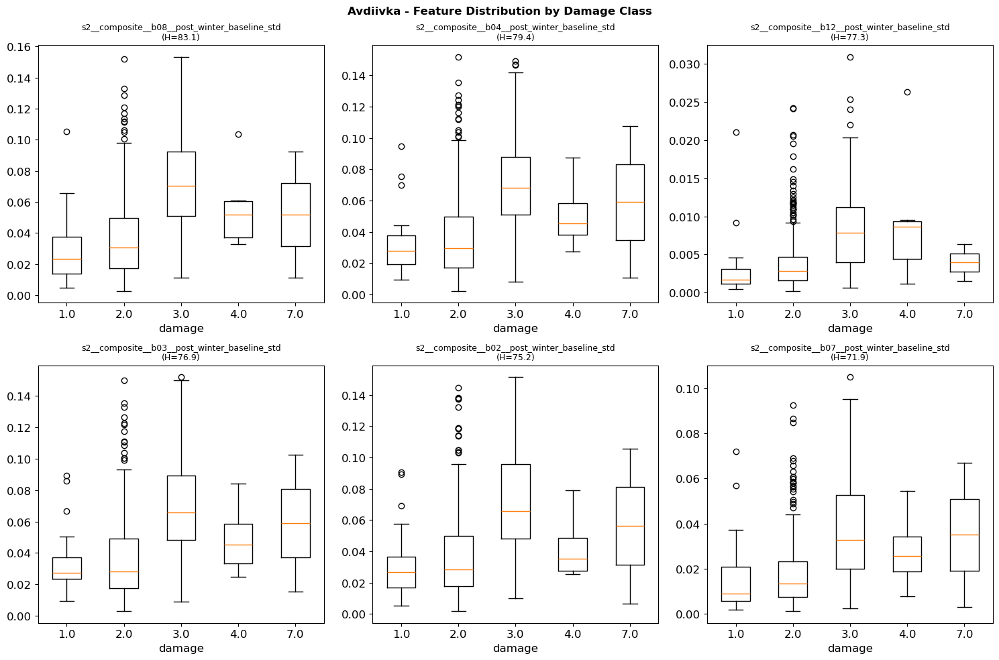

  Plot: cell07_kruskal/Avdiivka_damage_class_boxplots_20260421_235229.png
    CONCLUSION: 64% features distinguish grades -> ordinal MAY be feasible

  Borodyanka (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Borodyanka_kruskal_wallis_20260421_235231.csv (8.5 KB)
    Kruskal-Wallis significant: 10/117 features


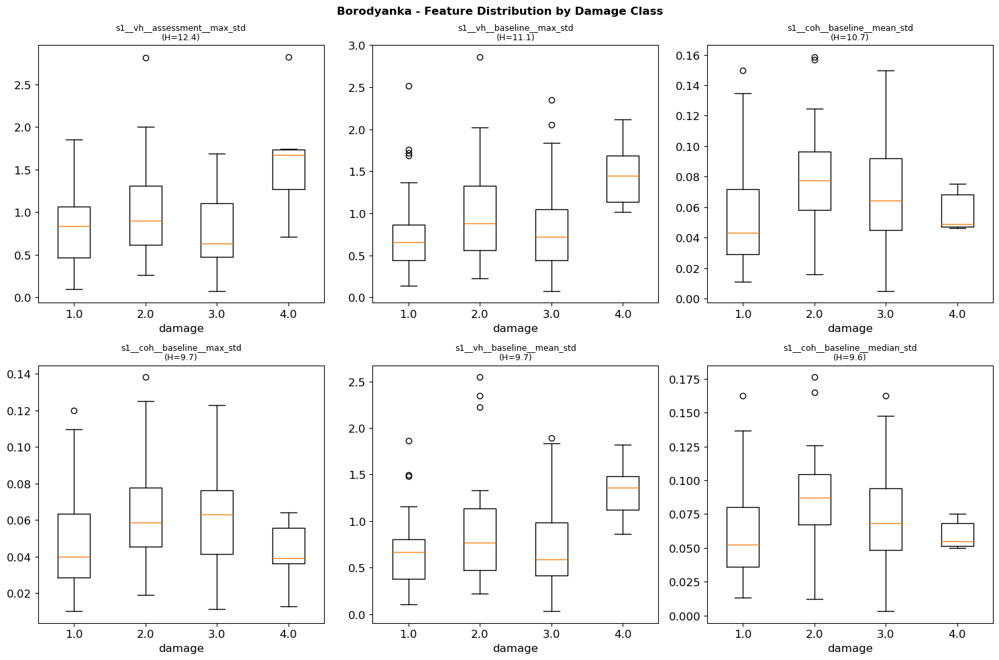

  Plot: cell07_kruskal/Borodyanka_damage_class_boxplots_20260421_235232.png
    CONCLUSION: Only 9% features distinguish damage grades -> binary justified

  Bucha (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Bucha_kruskal_wallis_20260421_235233.csv (24.8 KB)
    Kruskal-Wallis significant: 185/301 features


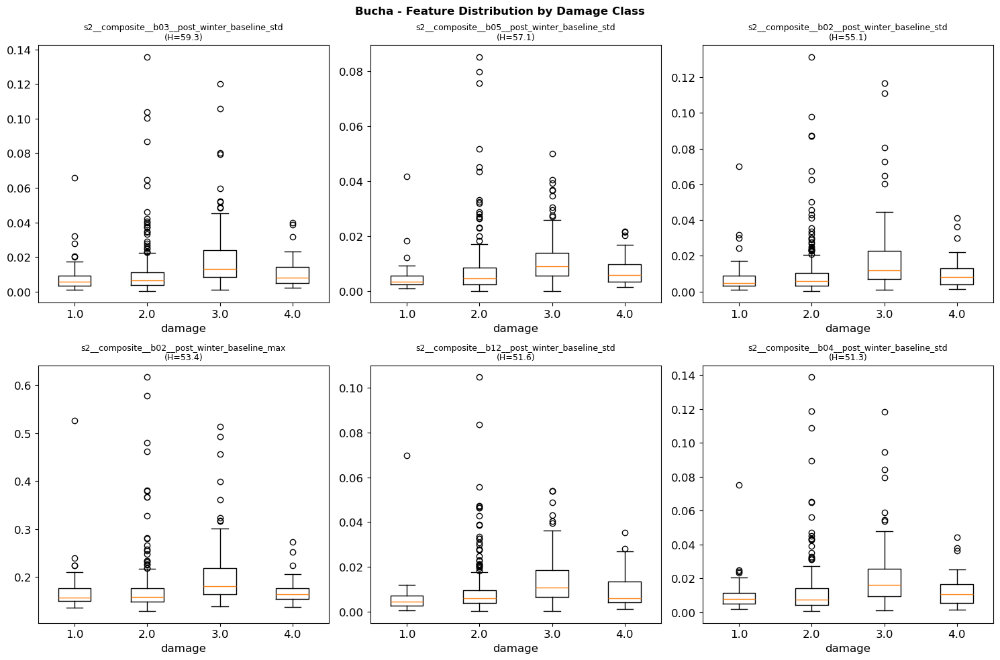

  Plot: cell07_kruskal/Bucha_damage_class_boxplots_20260421_235233.png
    CONCLUSION: 61% features distinguish grades -> ordinal MAY be feasible

  Chernihiv (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(7.0)]
  Saved: cell07_kruskal/Chernihiv_kruskal_wallis_20260421_235234.csv (21.8 KB)
    Kruskal-Wallis significant: 194/261 features


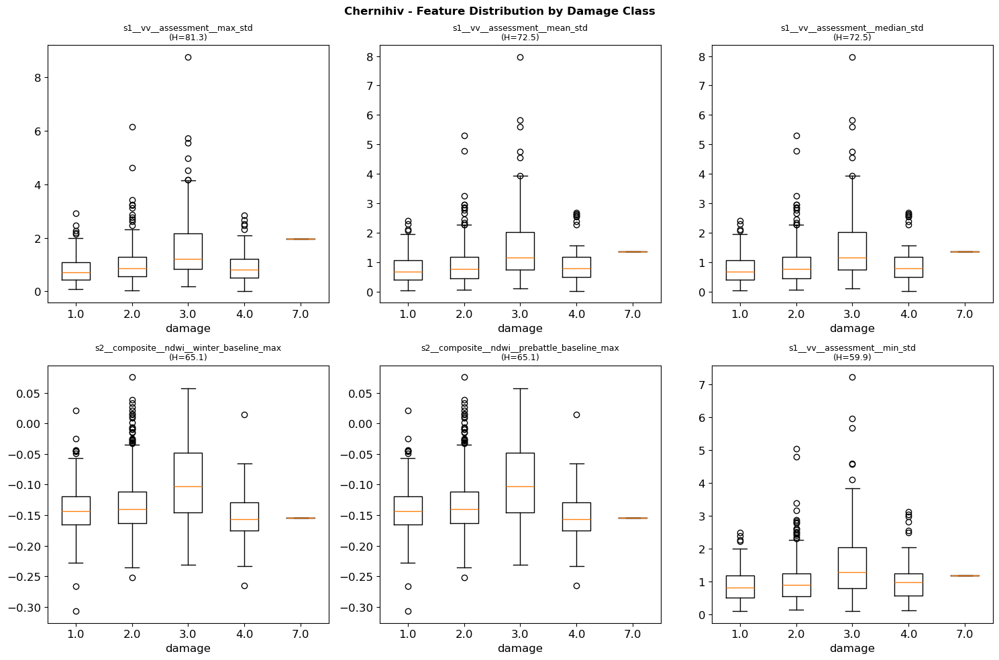

  Plot: cell07_kruskal/Chernihiv_damage_class_boxplots_20260421_235234.png
    CONCLUSION: 74% features distinguish grades -> ordinal MAY be feasible

  Chornobaivka (using damage)
    Damage classes: [np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Chornobaivka_kruskal_wallis_20260421_235236.csv (21.3 KB)
    Kruskal-Wallis significant: 27/256 features


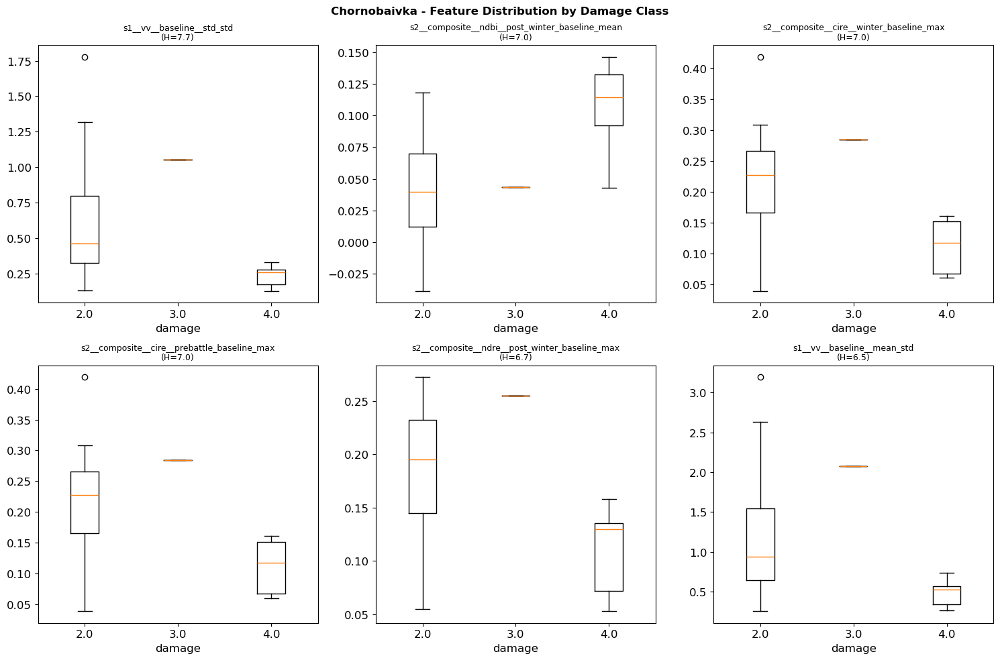

  Plot: cell07_kruskal/Chornobaivka_damage_class_boxplots_20260421_235236.png
    CONCLUSION: Only 11% features distinguish damage grades -> binary justified

  Dmytrivka (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Dmytrivka_kruskal_wallis_20260421_235238.csv (20.6 KB)
    Kruskal-Wallis significant: 151/255 features


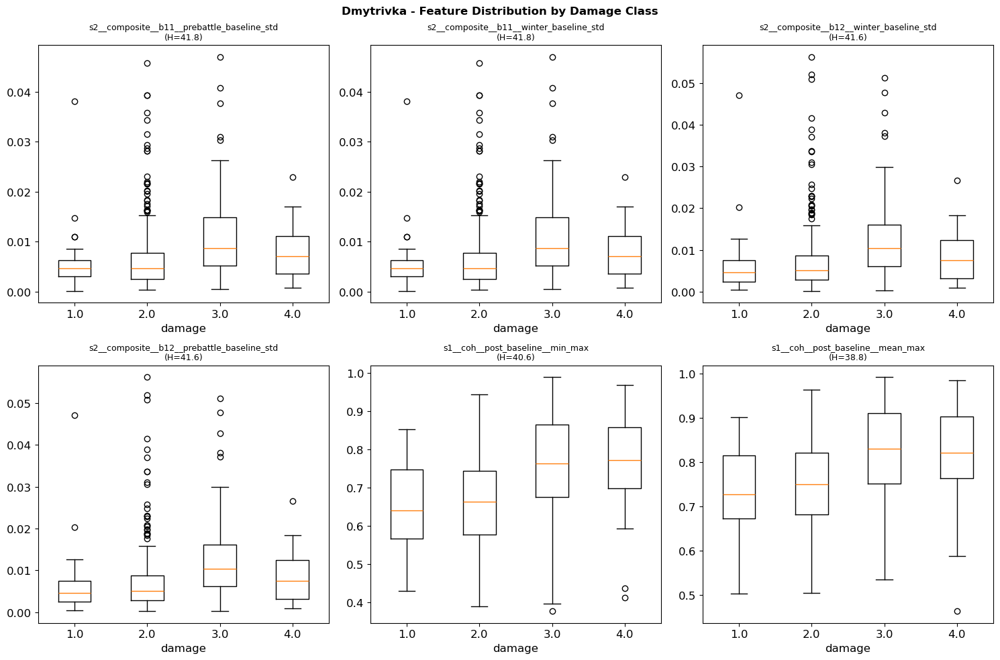

  Plot: cell07_kruskal/Dmytrivka_damage_class_boxplots_20260421_235238.png
    CONCLUSION: 59% features distinguish grades -> ordinal MAY be feasible

  Hostomel (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Hostomel_kruskal_wallis_20260421_235239.csv (25.3 KB)
    Kruskal-Wallis significant: 214/307 features


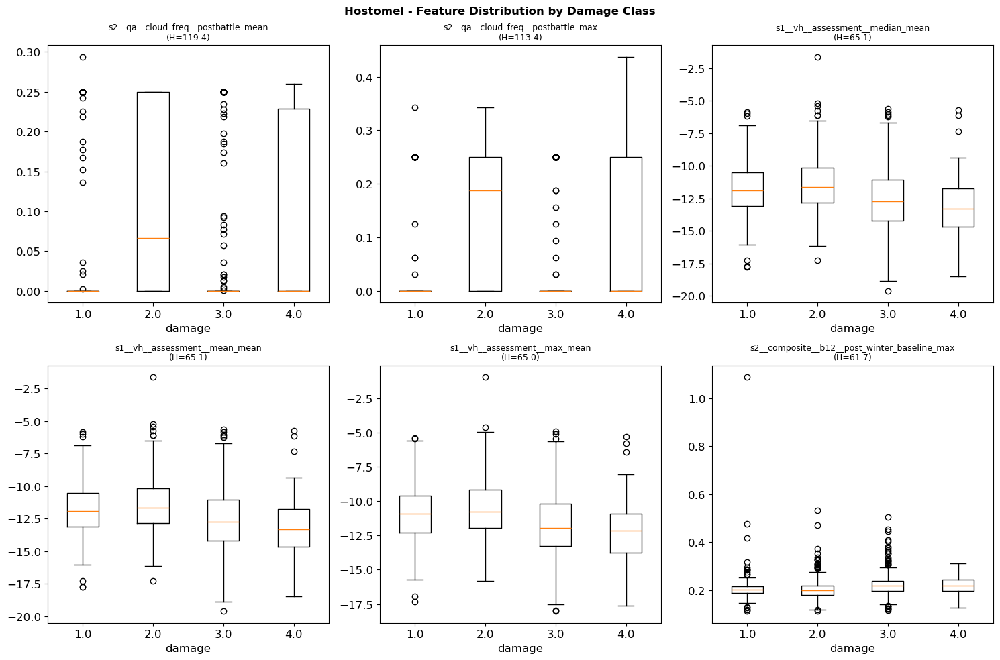

  Plot: cell07_kruskal/Hostomel_damage_class_boxplots_20260421_235240.png
    CONCLUSION: 70% features distinguish grades -> ordinal MAY be feasible

  Irpin (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Irpin_kruskal_wallis_20260421_235241.csv (20.9 KB)
    Kruskal-Wallis significant: 180/258 features


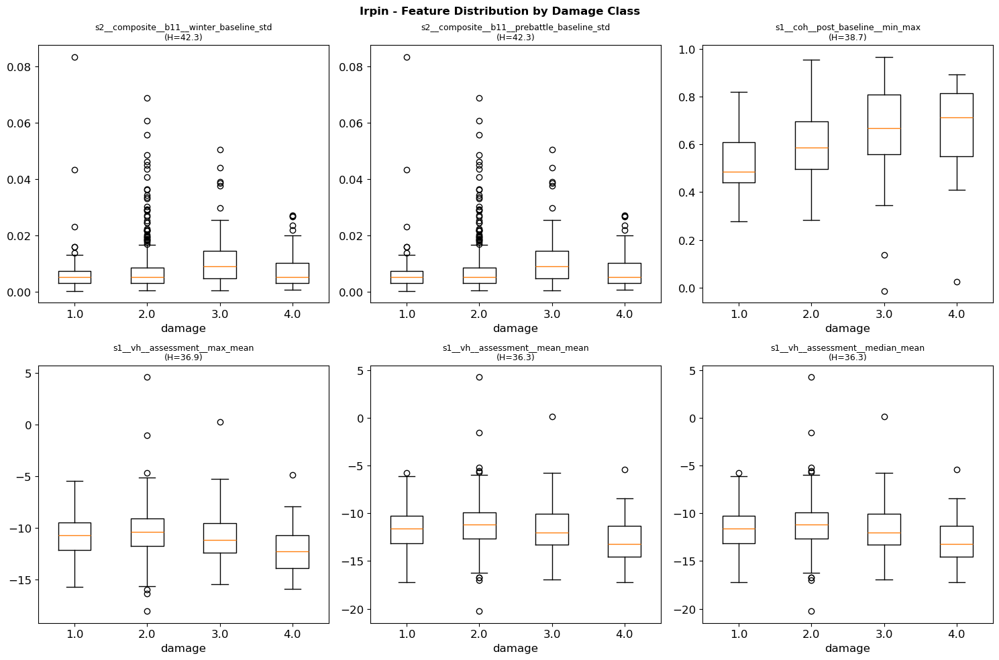

  Plot: cell07_kruskal/Irpin_damage_class_boxplots_20260421_235241.png
    CONCLUSION: 70% features distinguish grades -> ordinal MAY be feasible

  Kharkiv (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(6.0)]
  Saved: cell07_kruskal/Kharkiv_kruskal_wallis_20260421_235244.csv (22.5 KB)
    Kruskal-Wallis significant: 220/268 features


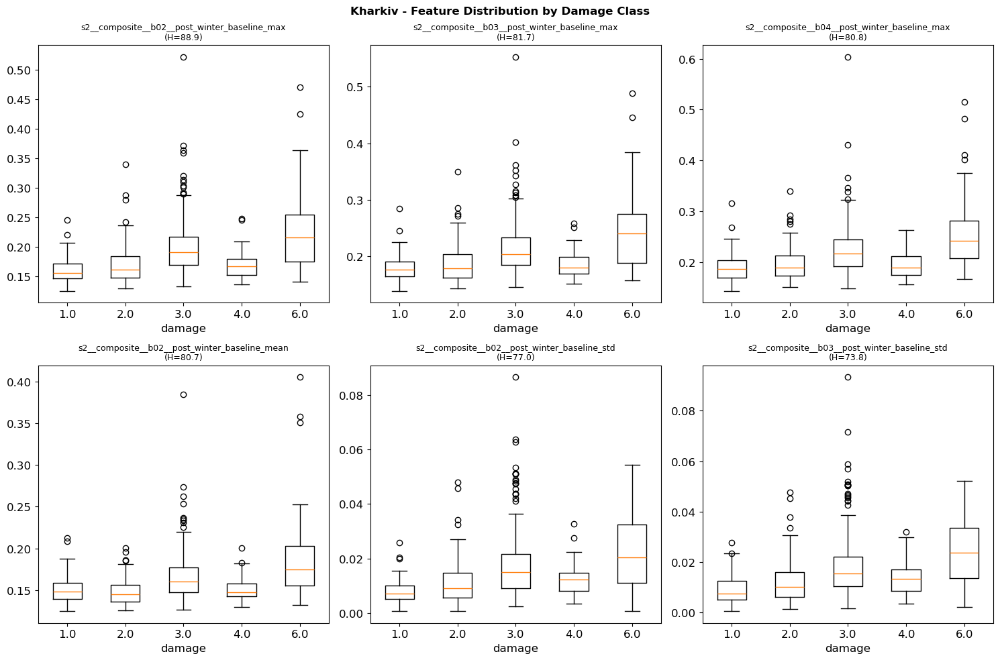

  Plot: cell07_kruskal/Kharkiv_damage_class_boxplots_20260421_235244.png
    CONCLUSION: 82% features distinguish grades -> ordinal MAY be feasible

  Kherson (using damage)
    Damage classes: [np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Kherson_kruskal_wallis_20260421_235246.csv (22.1 KB)
    Kruskal-Wallis significant: 25/267 features


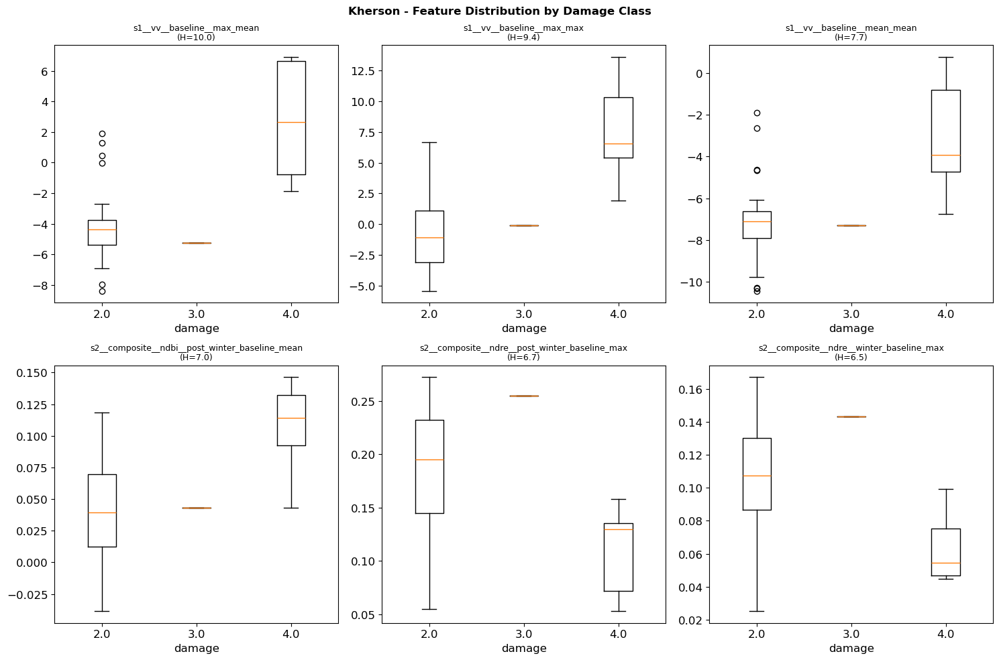

  Plot: cell07_kruskal/Kherson_damage_class_boxplots_20260421_235246.png
    CONCLUSION: Only 9% features distinguish damage grades -> binary justified

  Kramatorsk (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Kramatorsk_kruskal_wallis_20260421_235248.csv (23.8 KB)
    Kruskal-Wallis significant: 92/290 features


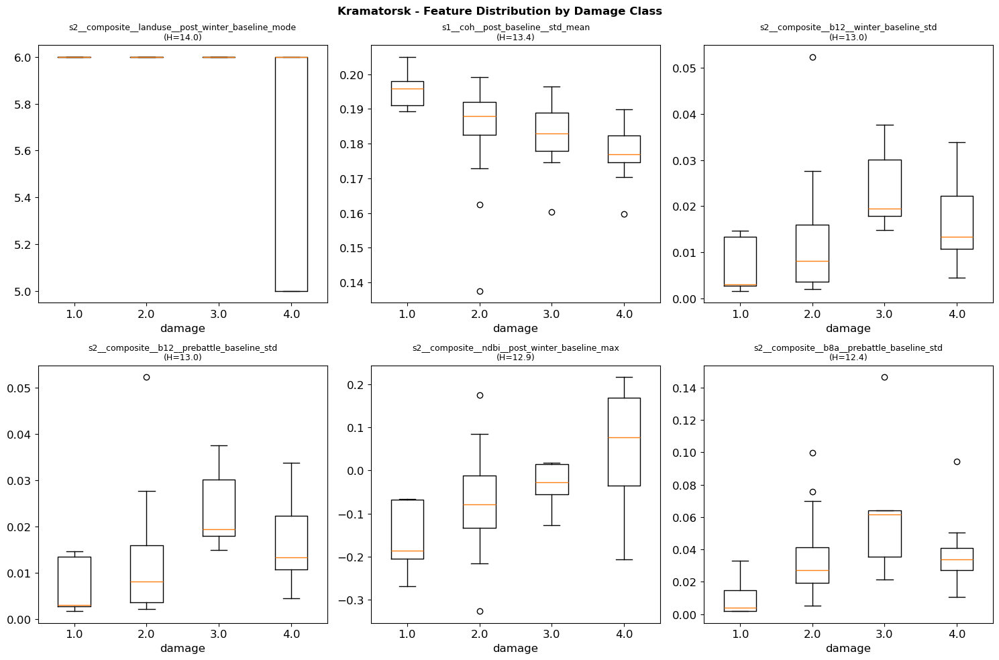

  Plot: cell07_kruskal/Kramatorsk_damage_class_boxplots_20260421_235248.png
    CONCLUSION: 32% features distinguish grades -> ordinal MAY be feasible

  Lysychansk (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Lysychansk_kruskal_wallis_20260421_235249.csv (23.0 KB)
    Kruskal-Wallis significant: 218/274 features


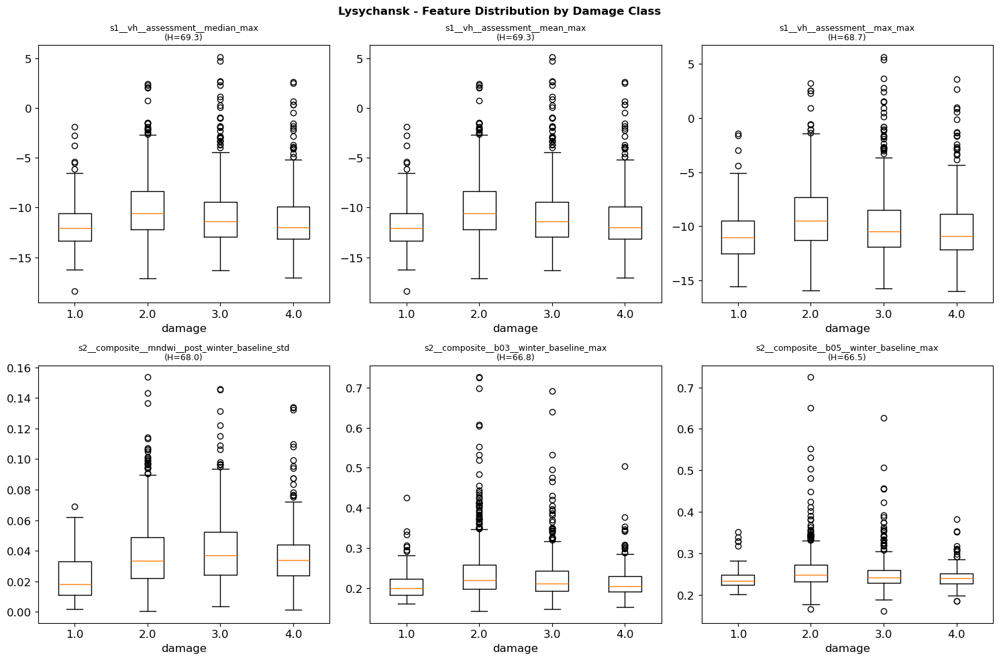

  Plot: cell07_kruskal/Lysychansk_damage_class_boxplots_20260421_235250.png
    CONCLUSION: 80% features distinguish grades -> ordinal MAY be feasible

  Makariv (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Makariv_kruskal_wallis_20260421_235251.csv (16.6 KB)
    Kruskal-Wallis significant: 34/205 features


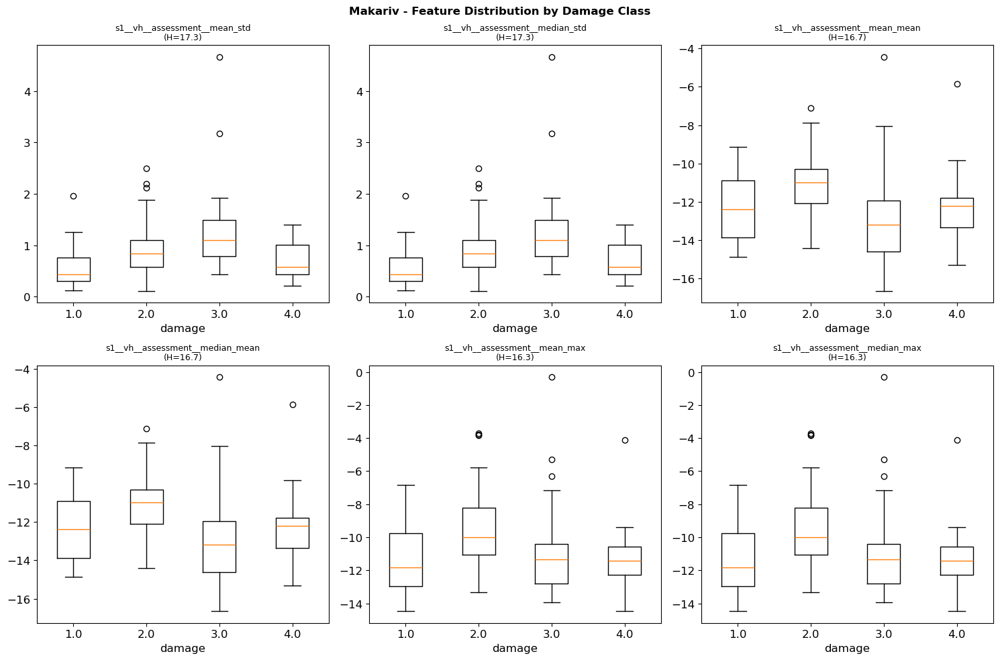

  Plot: cell07_kruskal/Makariv_damage_class_boxplots_20260421_235251.png
    CONCLUSION: Only 17% features distinguish damage grades -> binary justified

  Mariupol (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(6.0), np.float64(7.0)]
  Saved: cell07_kruskal/Mariupol_kruskal_wallis_20260421_235254.csv (26.0 KB)
    Kruskal-Wallis significant: 255/314 features


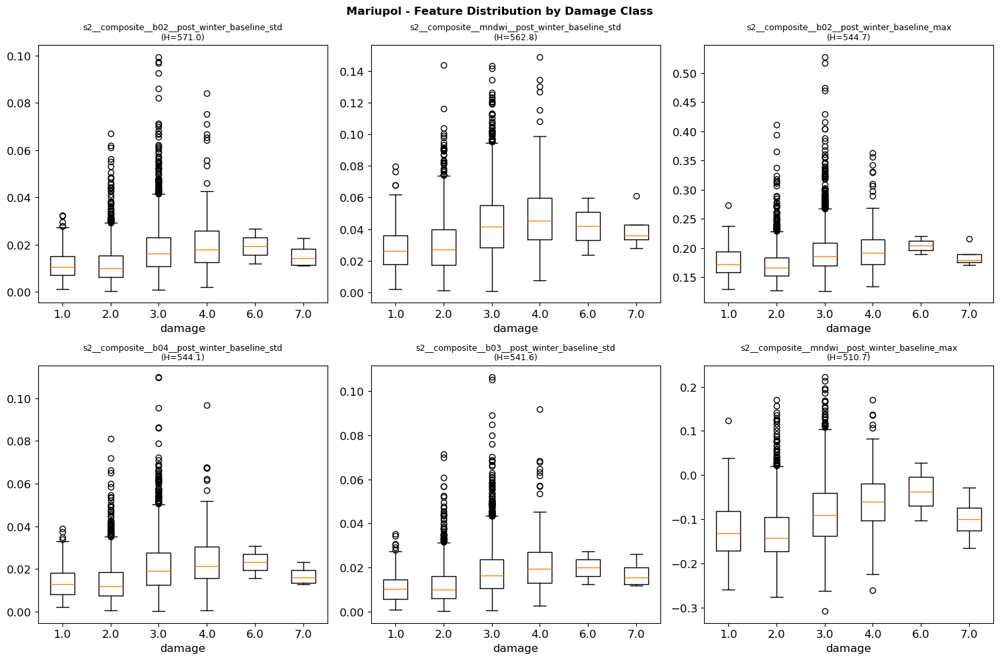

  Plot: cell07_kruskal/Mariupol_damage_class_boxplots_20260421_235254.png
    CONCLUSION: 81% features distinguish grades -> ordinal MAY be feasible

  Moschun (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Moschun_kruskal_wallis_20260421_235255.csv (22.6 KB)
    Kruskal-Wallis significant: 39/279 features


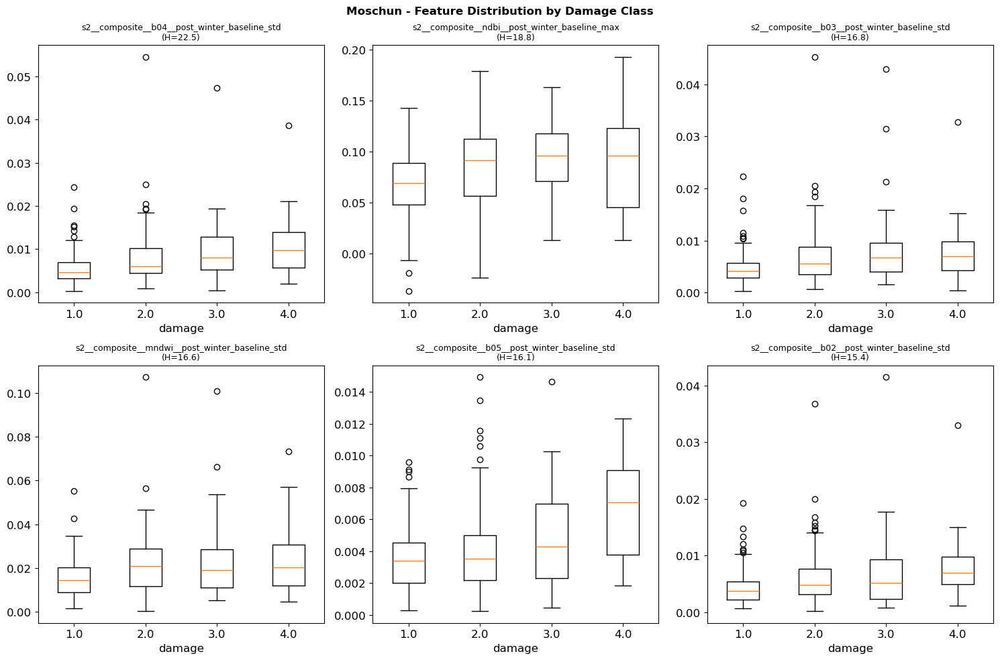

  Plot: cell07_kruskal/Moschun_damage_class_boxplots_20260421_235256.png
    CONCLUSION: Only 14% features distinguish damage grades -> binary justified

  Mykolaiv (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Mykolaiv_kruskal_wallis_20260421_235257.csv (3.0 KB)
    Kruskal-Wallis significant: 24/40 features


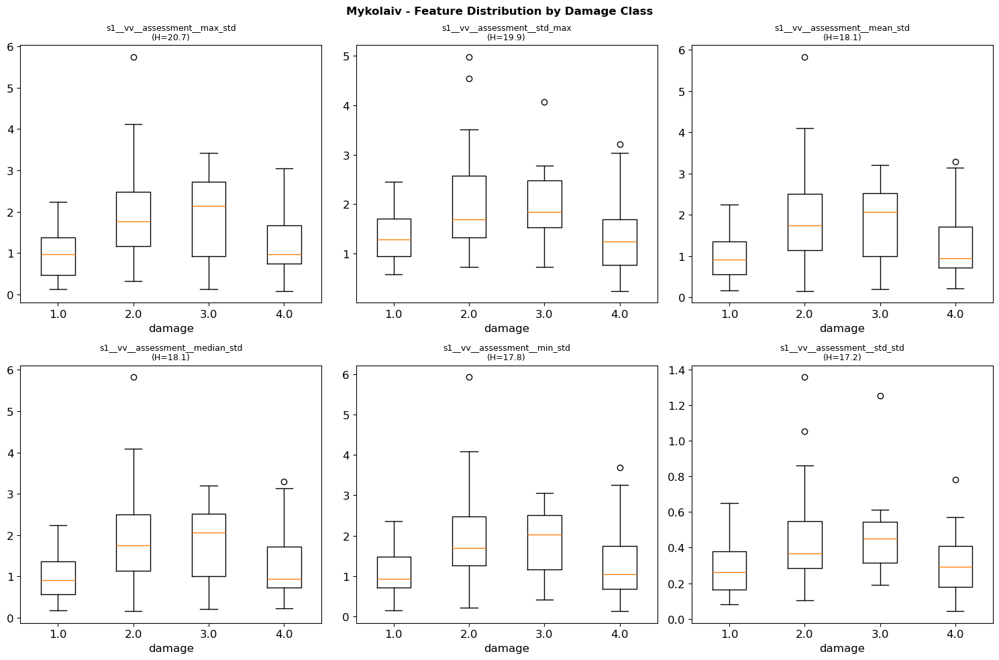

  Plot: cell07_kruskal/Mykolaiv_damage_class_boxplots_20260421_235258.png
    CONCLUSION: 60% features distinguish grades -> ordinal MAY be feasible

  Okhtyrka (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Okhtyrka_kruskal_wallis_20260421_235259.csv (22.9 KB)
    Kruskal-Wallis significant: 59/282 features


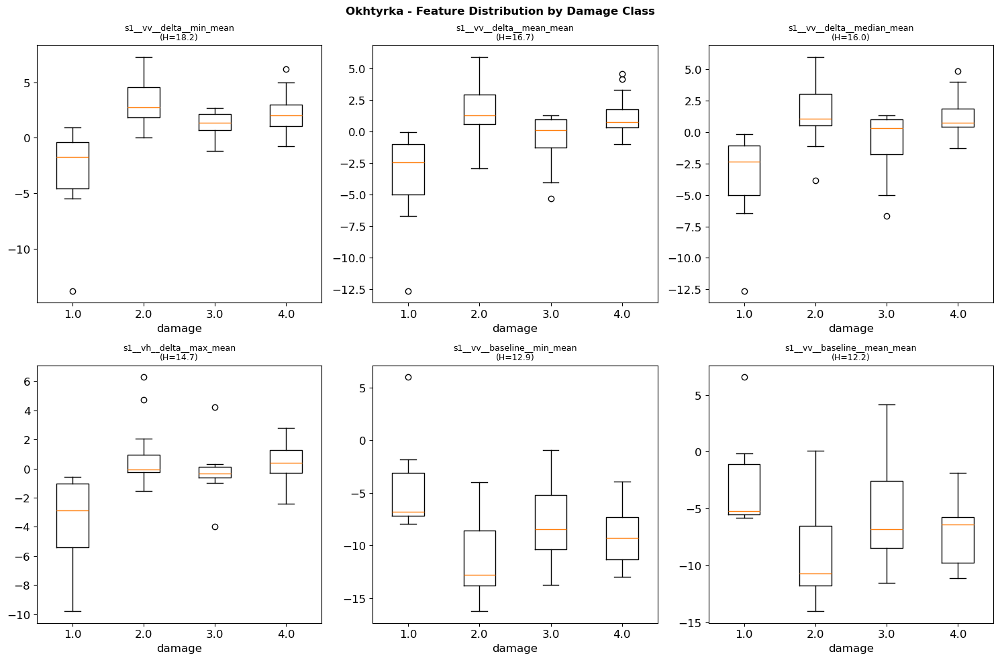

  Plot: cell07_kruskal/Okhtyrka_damage_class_boxplots_20260421_235300.png
    CONCLUSION: Only 21% features distinguish damage grades -> binary justified

  Rubizhne (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Rubizhne_kruskal_wallis_20260421_235301.csv (23.0 KB)
    Kruskal-Wallis significant: 221/276 features


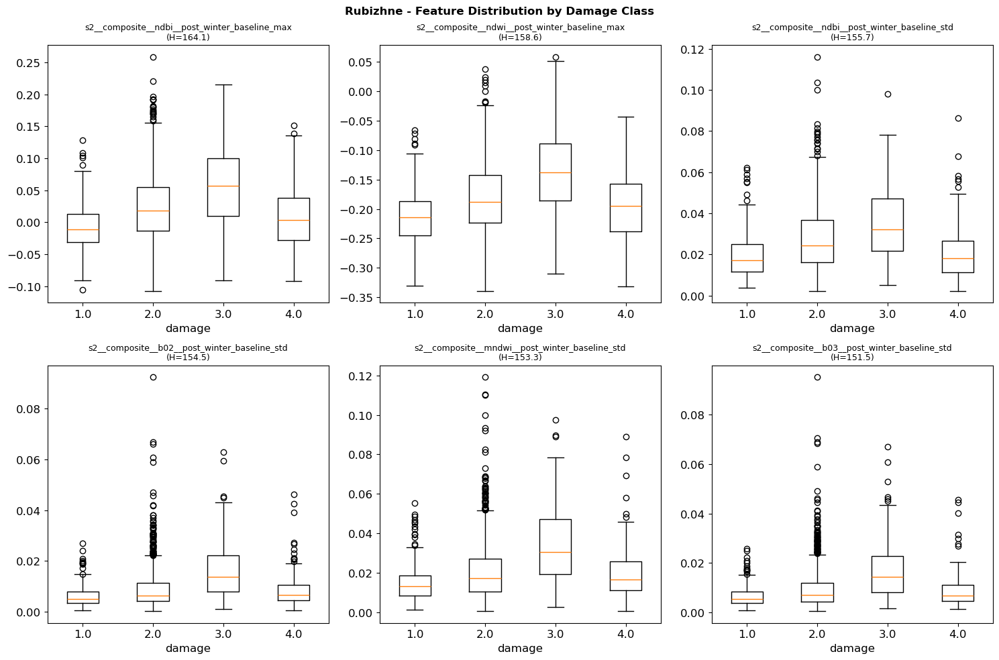

  Plot: cell07_kruskal/Rubizhne_damage_class_boxplots_20260421_235302.png
    CONCLUSION: 80% features distinguish grades -> ordinal MAY be feasible

  Sievierodonetsk (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Sievierodonetsk_kruskal_wallis_20260421_235303.csv (23.4 KB)
    Kruskal-Wallis significant: 228/281 features


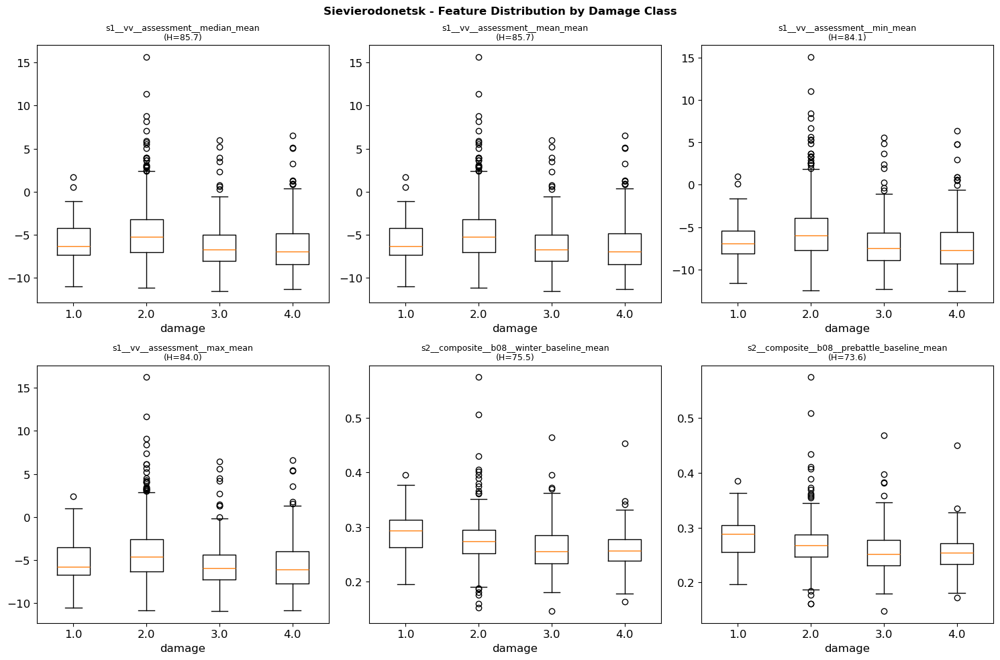

  Plot: cell07_kruskal/Sievierodonetsk_damage_class_boxplots_20260421_235303.png
    CONCLUSION: 81% features distinguish grades -> ordinal MAY be feasible

  Trostianets (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Trostianets_kruskal_wallis_20260421_235305.csv (20.4 KB)
    Kruskal-Wallis significant: 12/248 features


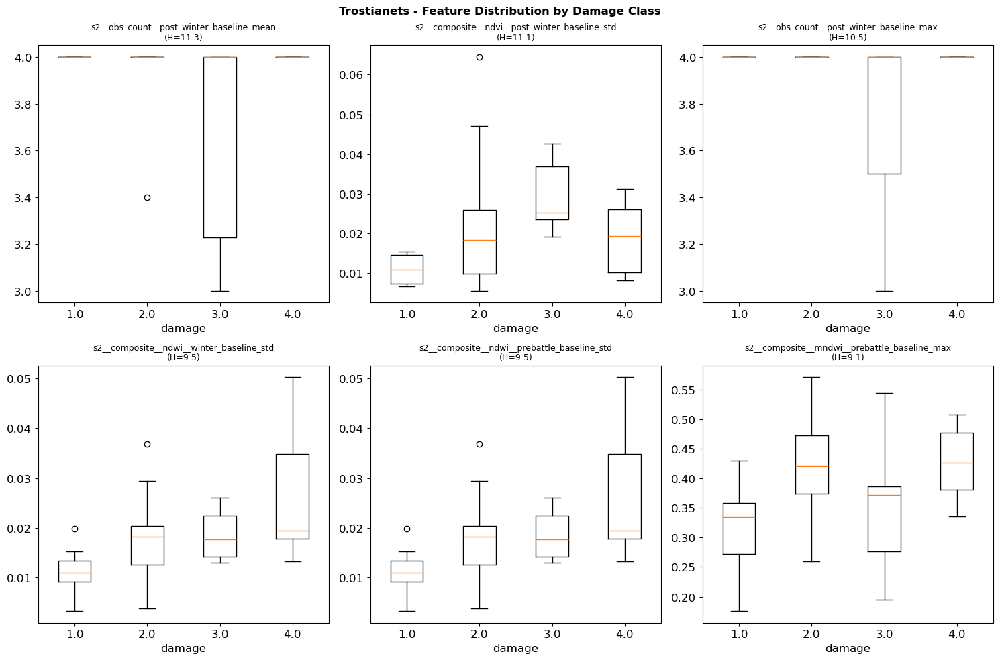

  Plot: cell07_kruskal/Trostianets_damage_class_boxplots_20260421_235305.png
    CONCLUSION: Only 5% features distinguish damage grades -> binary justified

  Volnovakha (using damage)
    Damage classes: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
  Saved: cell07_kruskal/Volnovakha_kruskal_wallis_20260421_235305.csv (23.9 KB)
    Kruskal-Wallis significant: 167/291 features


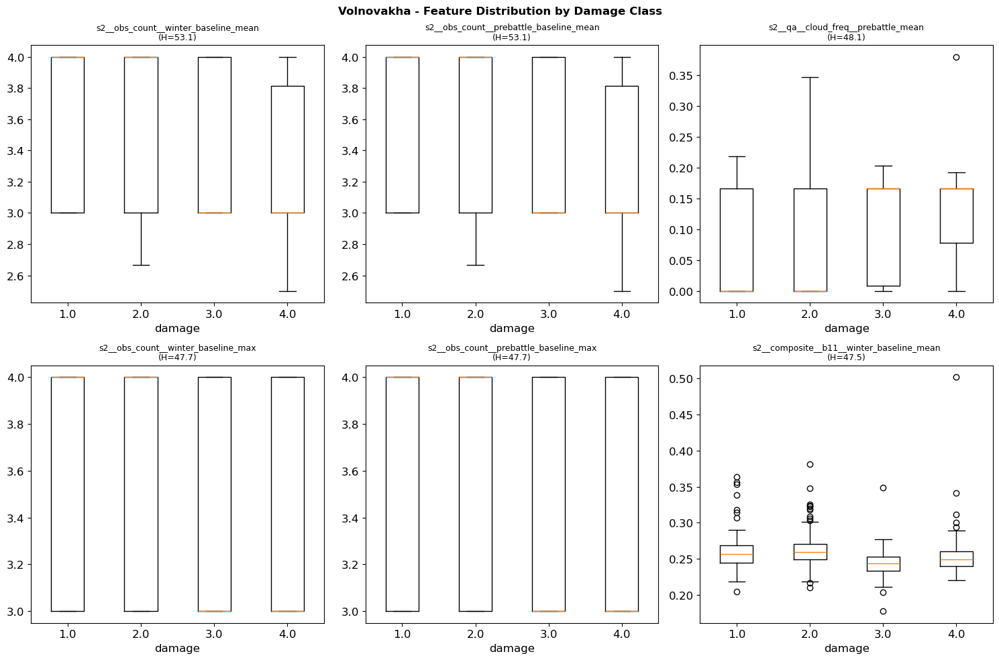

  Plot: cell07_kruskal/Volnovakha_damage_class_boxplots_20260421_235306.png
    CONCLUSION: 57% features distinguish grades -> ordinal MAY be feasible


In [9]:
# @title CELL 7: PER-DAMAGE-CLASS ANALYSIS (Kruskal-Wallis)
USE_BALANCED = False  # compares groups independently
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats as scipy_stats

print("=" * 70)
print("CELL 7: PER-DAMAGE-CLASS ANALYSIS")
print("=" * 70)

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue

    damage_col = None
    for candidate in ['damage', 'ems98_grade', 'damage_label', 'damage_class']:
        if candidate in city_df.columns and city_df[candidate].nunique() > 2:
            damage_col = candidate
            break

    if damage_col is None:
        print(f"\n  {CITY}: only binary labels available, skipping ordinal analysis")
        print(f"    -> Binary classification justified (no ordinal grades in data)")
        continue

    print(f"\n  {CITY} (using {damage_col})")
    classes = sorted(city_df[damage_col].dropna().unique())
    print(f"    Damage classes: {classes}")

    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * MIN_FEATURE_COVERAGE]

    kw_results = []
    for feat in feature_cols:
        grps = [city_df.loc[city_df[damage_col] == c, feat].dropna().values for c in classes]
        grps = [g for g in grps if len(g) >= 5]
        if len(grps) < 2:
            continue
        try:
            h_stat, p_val = scipy_stats.kruskal(*grps)
            kw_results.append({'feature': feat, 'H_statistic': h_stat,
                               'p_value': p_val, 'significant': p_val < 0.05,
                               'n_groups': len(grps)})
        except Exception:
            pass

    if kw_results:
        kw_df = pd.DataFrame(kw_results).sort_values('H_statistic', ascending=False)
        save_result(kw_df, f'{CITY}_kruskal_wallis', 'cell07_kruskal')

        sig_feats = kw_df[kw_df['significant']]['feature'].values
        print(f"    Kruskal-Wallis significant: {len(sig_feats)}/{len(kw_df)} features")

        top_feats = kw_df.head(6)['feature'].values
        if len(top_feats) > 0:
            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            axes = axes.flatten()
            for i, feat in enumerate(top_feats):
                data_by_class = [city_df.loc[city_df[damage_col] == c, feat].dropna().values for c in classes]
                axes[i].boxplot(data_by_class, labels=[str(c) for c in classes])
                axes[i].set_title(f"{feat}\n(H={kw_df.loc[kw_df['feature']==feat, 'H_statistic'].values[0]:.1f})", fontsize=9)
                axes[i].set_xlabel(damage_col)
            for j in range(len(top_feats), 6):
                axes[j].set_visible(False)
            fig.suptitle(f"{CITY} - Feature Distribution by Damage Class", fontsize=12, fontweight='bold')
            plt.tight_layout()
            save_fig(fig, f'{CITY}_damage_class_boxplots', 'cell07_kruskal')
            

        n_sig = len([r for r in kw_results if r['significant']])
        n_total = len(kw_results)
        pct_sig = n_sig / n_total * 100 if n_total > 0 else 0
        if pct_sig < 30:
            print(f"    CONCLUSION: Only {pct_sig:.0f}% features distinguish damage grades -> binary justified")
        else:
            print(f"    CONCLUSION: {pct_sig:.0f}% features distinguish grades -> ordinal MAY be feasible")


# CELL 8: DISTRIBUTION ANALYSIS

Shapiro-Wilk normality test (sampled at n=5000 — for large samples, even minor
deviations from normality cause rejection; interpret with caution).
Skewness, kurtosis per feature. QQ plots for visual check.
Most satellite features are NON-normal — this justifies non-parametric tests
(Mann-Whitney, Kruskal-Wallis) used throughout NB06.

CELL 8: DISTRIBUTION ANALYSIS
  Saved: cell08_distributions/distributions_20260421_235320.csv (1103.9 KB)

    Chernihiv/s2__composite__b02__post_winter_baseline_mean: 55% NaN
    Chernihiv/s2__composite__b02__post_winter_baseline_std: 55% NaN
    Chernihiv/s2__composite__b02__post_winter_baseline_max: 55% NaN
    Chernihiv/s2__composite__b03__post_winter_baseline_mean: 55% NaN
    Chernihiv/s2__composite__b03__post_winter_baseline_std: 55% NaN
    Chernihiv/s2__composite__b03__post_winter_baseline_max: 55% NaN
    Chernihiv/s2__composite__b04__post_winter_baseline_mean: 55% NaN
    Chernihiv/s2__composite__b04__post_winter_baseline_std: 55% NaN
    Chernihiv/s2__composite__b04__post_winter_baseline_max: 55% NaN
    Chernihiv/s2__composite__b05__post_winter_baseline_mean: 55% NaN

  Non-normal features (Shapiro p<0.05): 5467/6028
  NOTE: For large n, Shapiro-Wilk rejects even approximately normal data.
        Non-parametric tests used throughout NB06 are robust to non-normality.

QQ-P

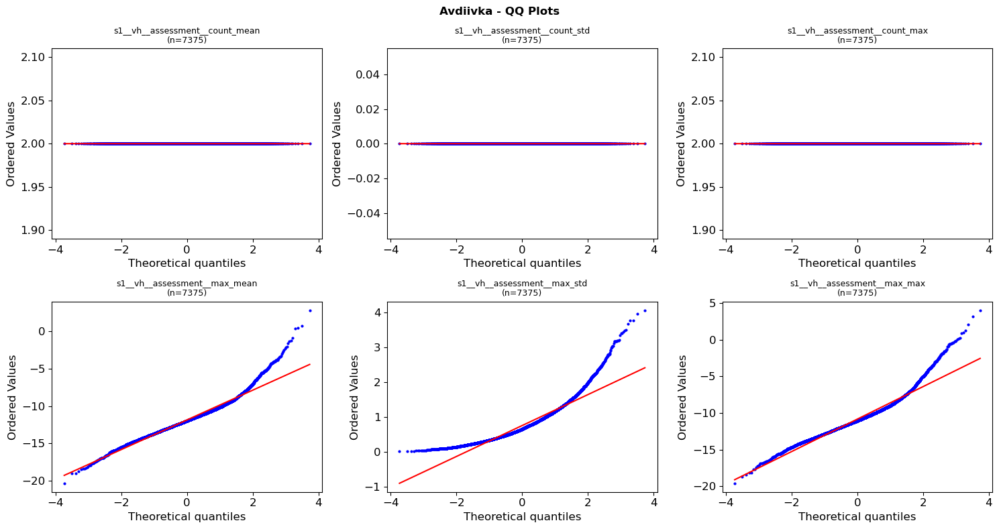

  Plot: cell08_distributions/Avdiivka_qq_plots_20260421_235321.png


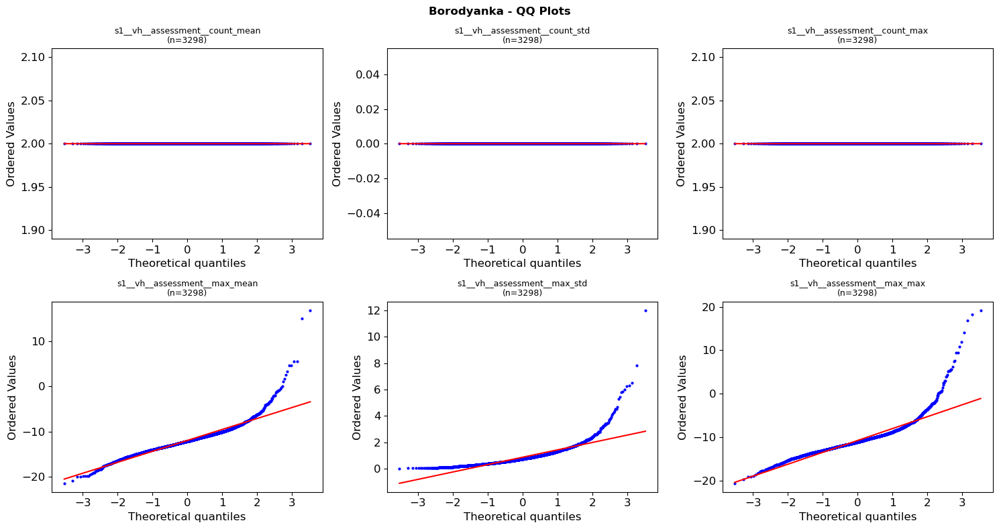

  Plot: cell08_distributions/Borodyanka_qq_plots_20260421_235322.png


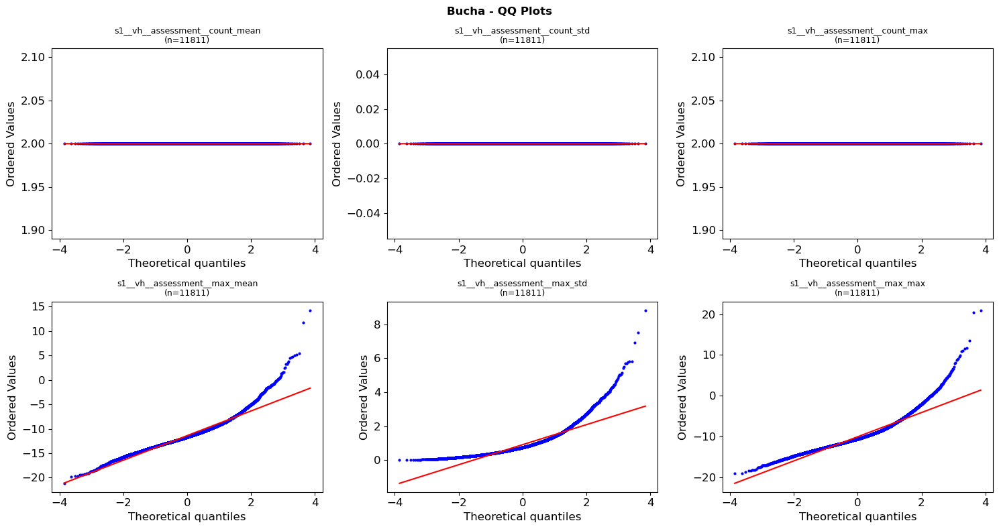

  Plot: cell08_distributions/Bucha_qq_plots_20260421_235323.png


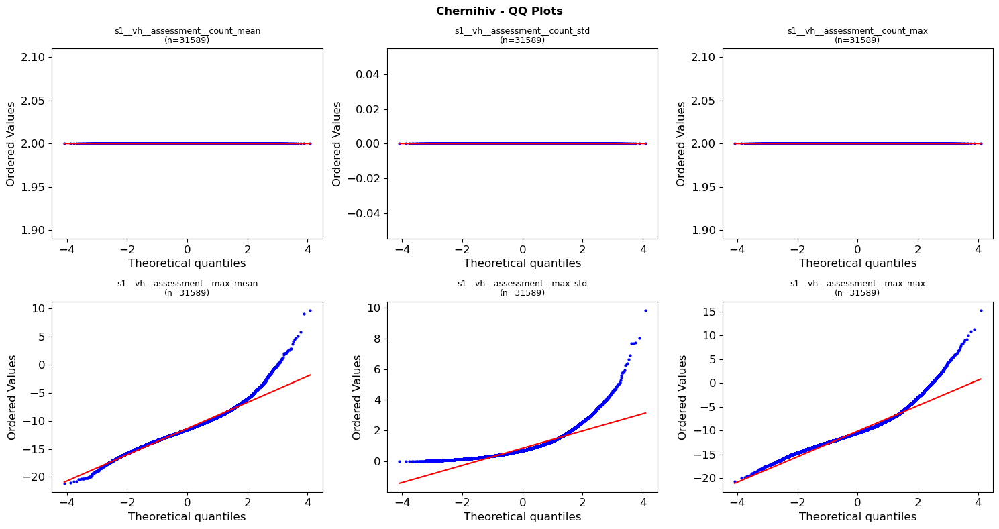

  Plot: cell08_distributions/Chernihiv_qq_plots_20260421_235325.png


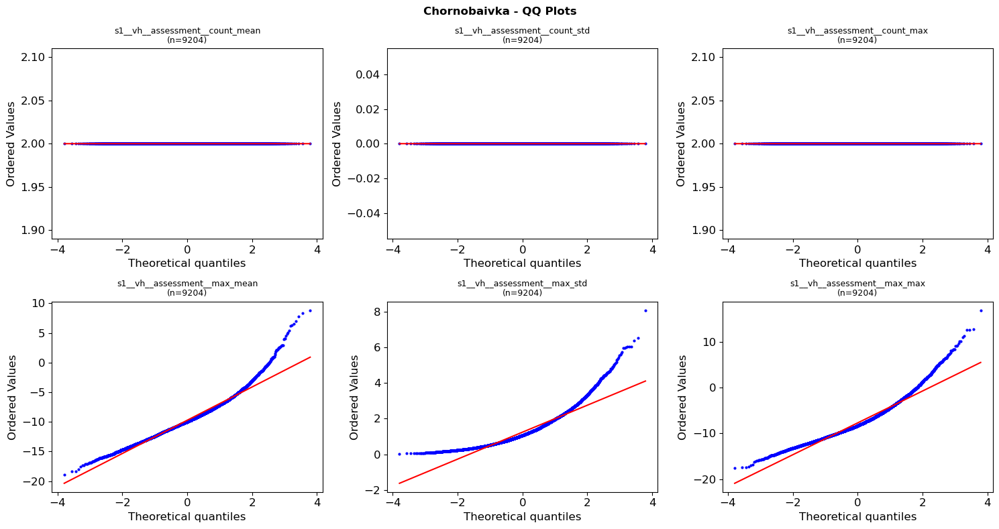

  Plot: cell08_distributions/Chornobaivka_qq_plots_20260421_235326.png


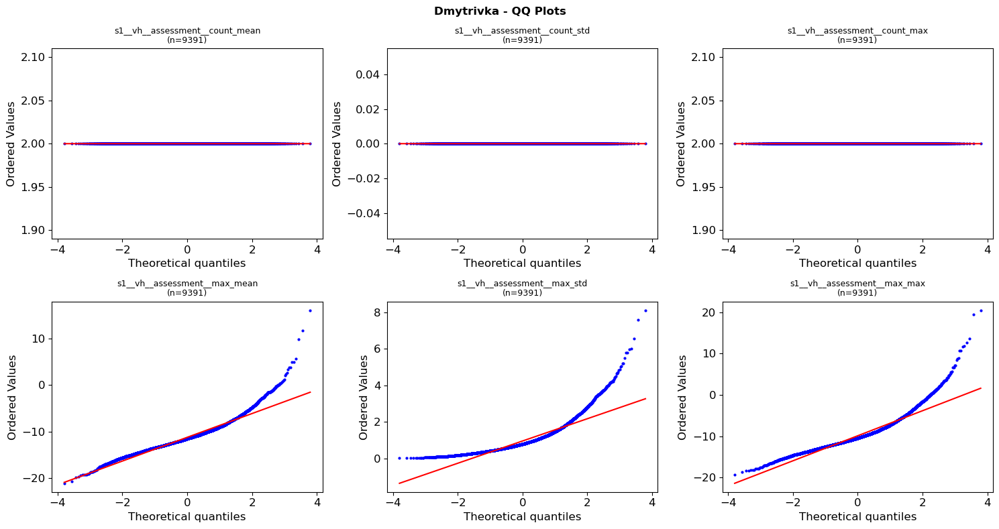

  Plot: cell08_distributions/Dmytrivka_qq_plots_20260421_235327.png


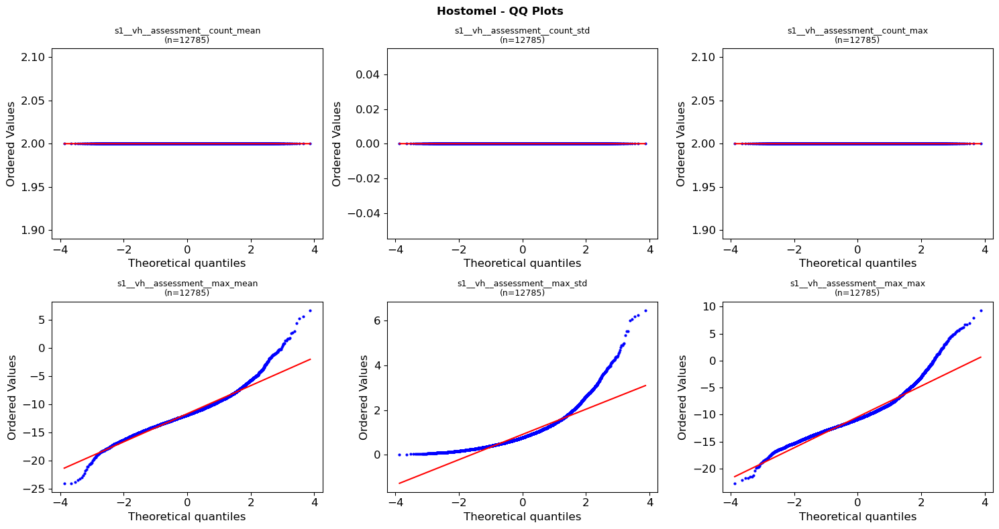

  Plot: cell08_distributions/Hostomel_qq_plots_20260421_235328.png


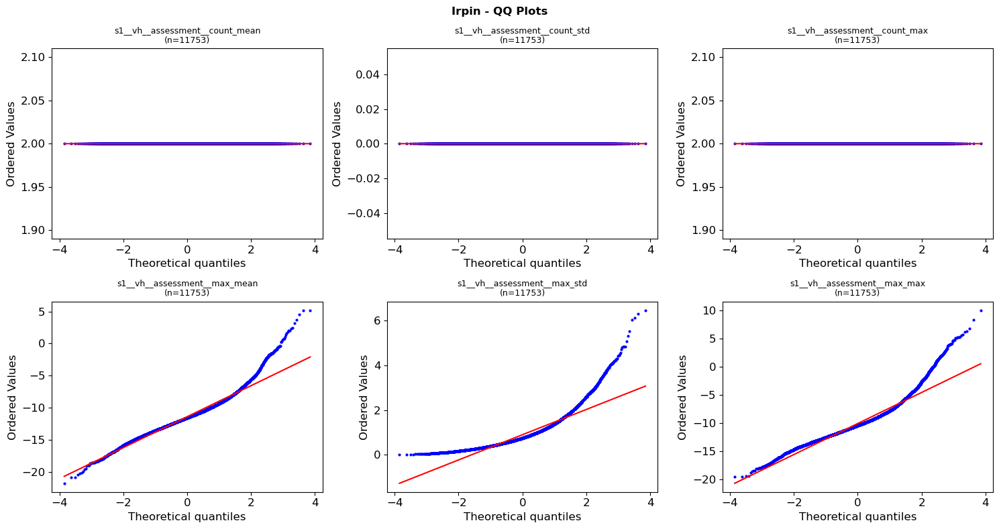

  Plot: cell08_distributions/Irpin_qq_plots_20260421_235329.png


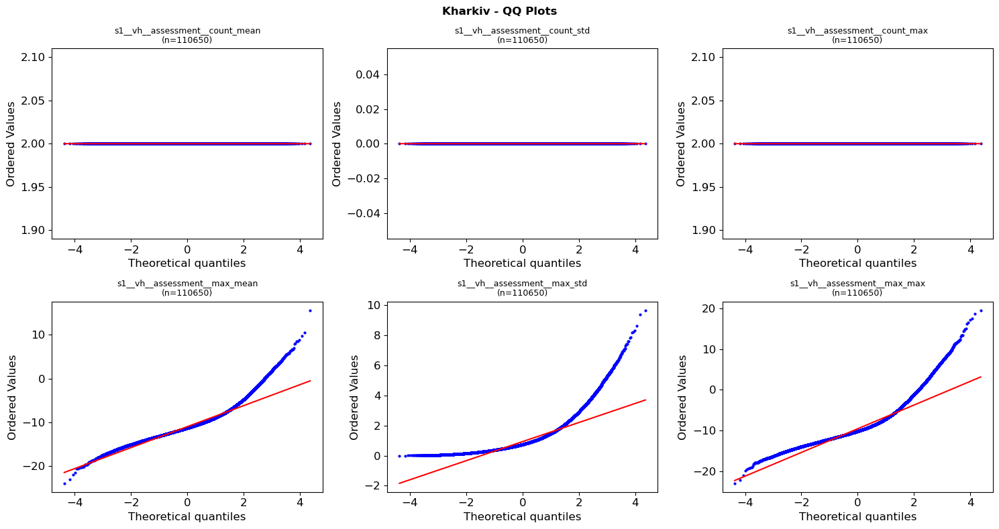

  Plot: cell08_distributions/Kharkiv_qq_plots_20260421_235331.png


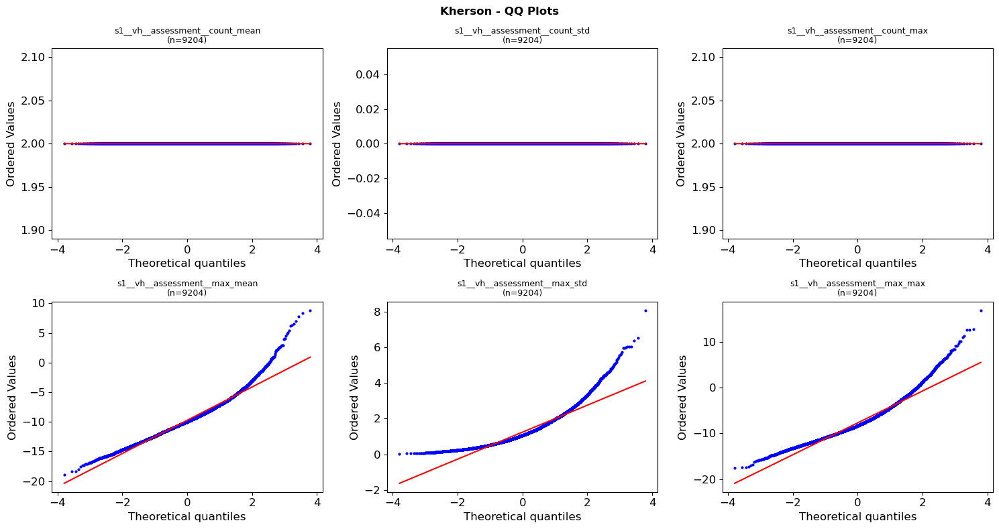

  Plot: cell08_distributions/Kherson_qq_plots_20260421_235333.png


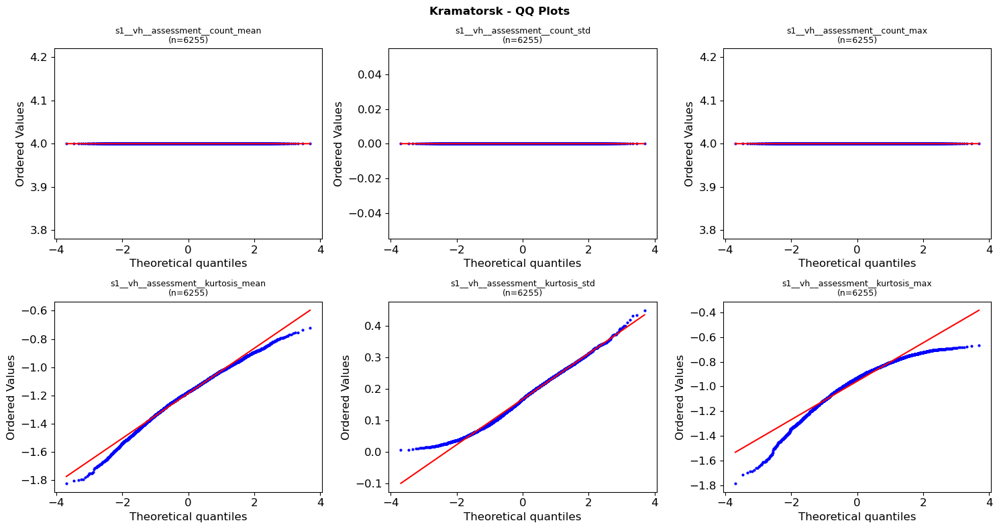

  Plot: cell08_distributions/Kramatorsk_qq_plots_20260421_235334.png


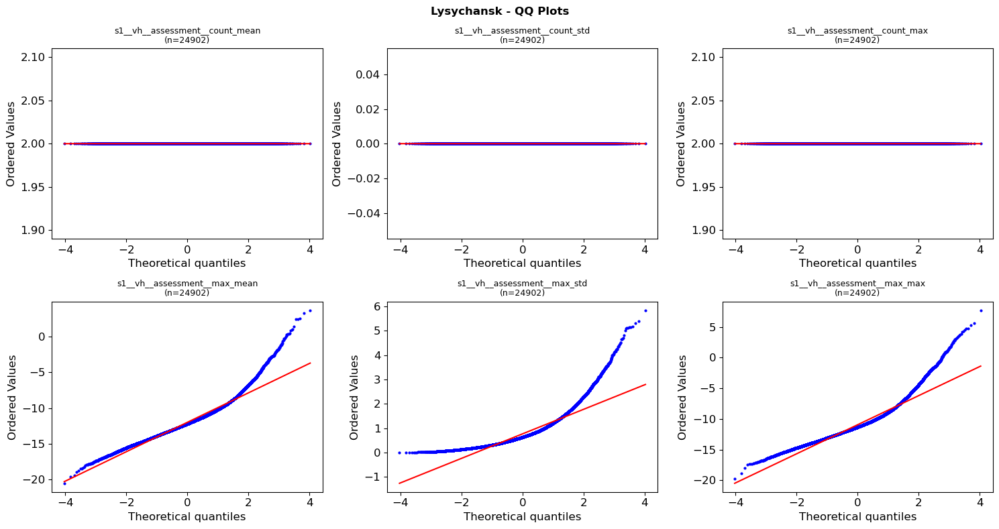

  Plot: cell08_distributions/Lysychansk_qq_plots_20260421_235335.png


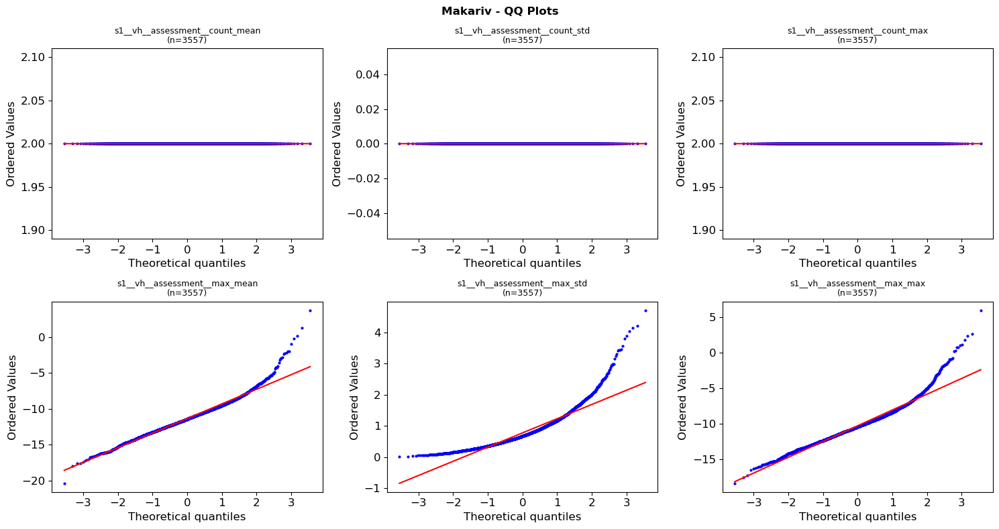

  Plot: cell08_distributions/Makariv_qq_plots_20260421_235336.png


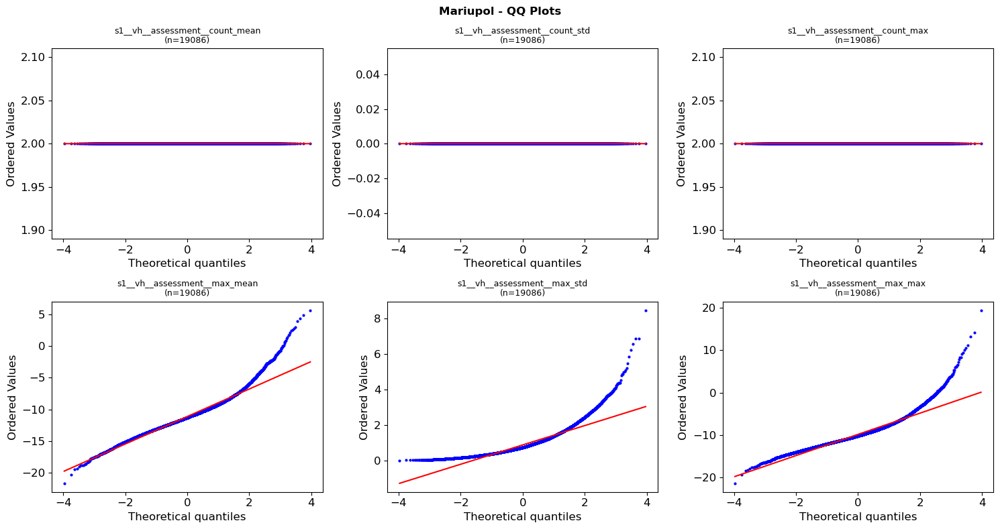

  Plot: cell08_distributions/Mariupol_qq_plots_20260421_235337.png


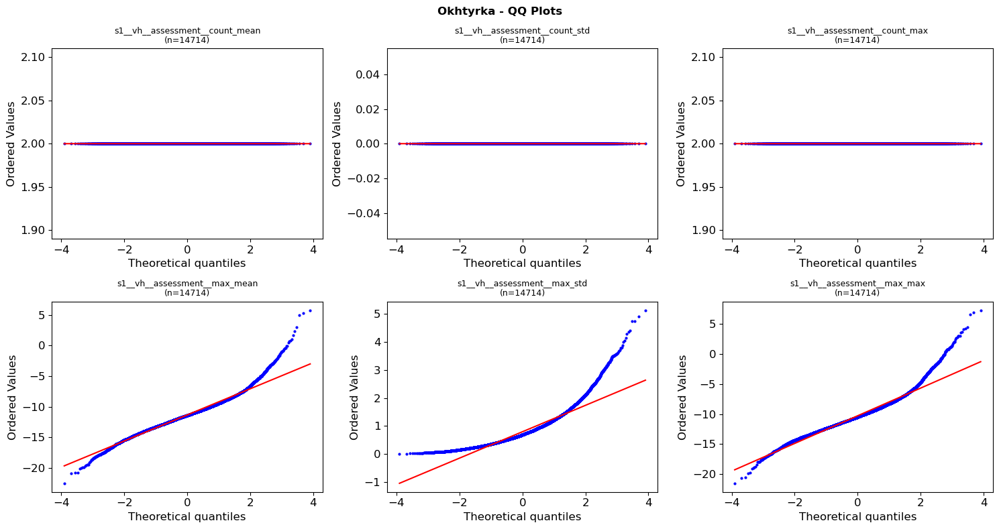

  Plot: cell08_distributions/Okhtyrka_qq_plots_20260421_235338.png


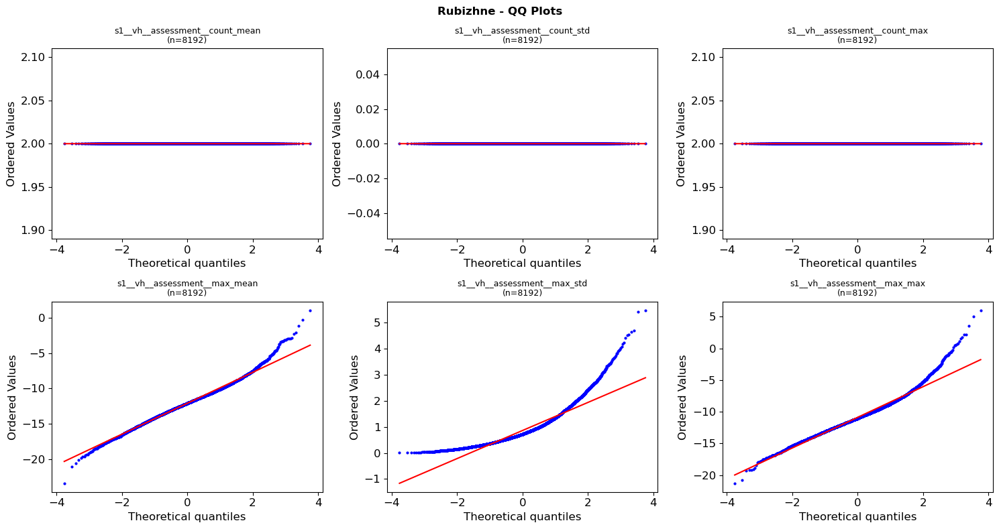

  Plot: cell08_distributions/Rubizhne_qq_plots_20260421_235340.png


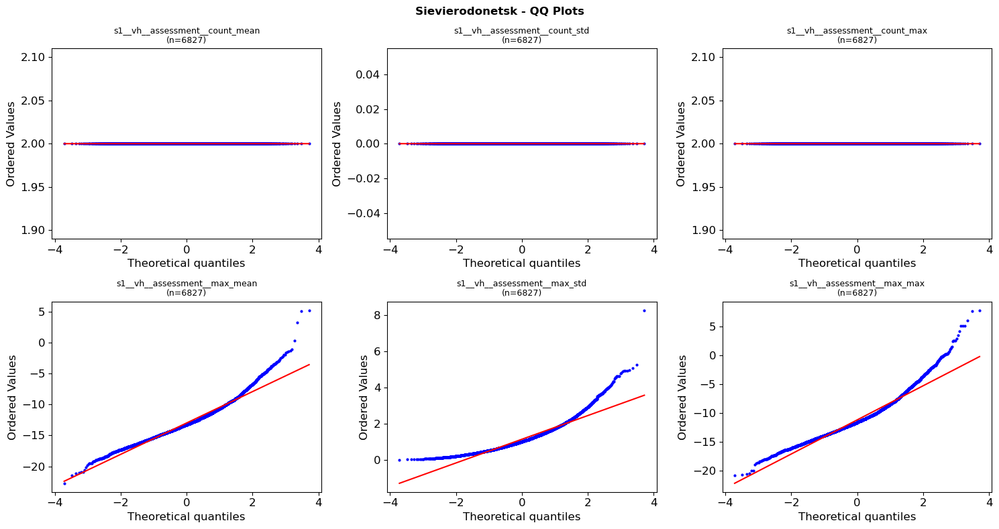

  Plot: cell08_distributions/Sievierodonetsk_qq_plots_20260421_235341.png


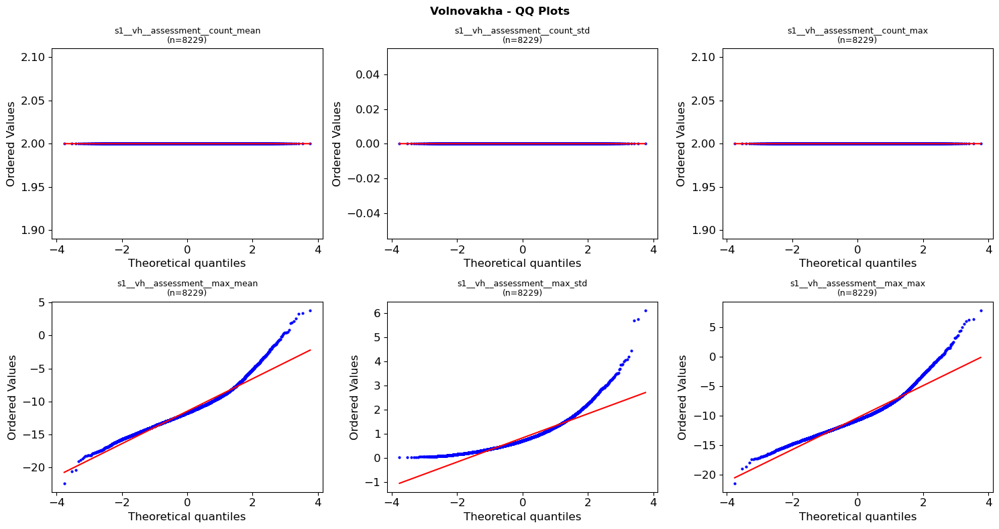

  Plot: cell08_distributions/Volnovakha_qq_plots_20260421_235342.png


In [10]:
# @title CELL 8: DISTRIBUTION ANALYSIS + QQ PLOTS
USE_BALANCED = False  # characterizes full population distributions
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats as scipy_stats

print("=" * 70)
print("CELL 8: DISTRIBUTION ANALYSIS")
print("=" * 70)

dist_rows = []

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue

    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * MIN_FEATURE_COVERAGE]

    for col in feature_cols:
        vals = city_df[col].dropna().values
        if len(vals) < MIN_SAMPLES:
            continue

        skew = scipy_stats.skew(vals, nan_policy='omit')
        kurt = scipy_stats.kurtosis(vals, nan_policy='omit')

        # Shapiro-Wilk (sample if n > 5000; note: rejects almost always for large n)
        sample = vals[:5000] if len(vals) > 5000 else vals
        try:
            sw_stat, sw_p = scipy_stats.shapiro(sample)
        except Exception:
            sw_stat, sw_p = np.nan, np.nan

        dist_rows.append({
            'city': CITY, 'feature': col, 'n': len(vals),
            'mean': np.mean(vals), 'std': np.std(vals, ddof=1),
            'skewness': skew, 'kurtosis': kurt,
            'shapiro_stat': sw_stat, 'shapiro_p': sw_p,
            'is_normal_005': sw_p > 0.05 if not np.isnan(sw_p) else False,
            'pct_nan': 1 - len(vals) / len(city_df),
        })

dist_df = pd.DataFrame(dist_rows)
save_result(dist_df, 'distributions', 'cell08_distributions')

high_nan = dist_df[dist_df['pct_nan'] > 0.5]
if len(high_nan) > 0:
    print(f"\n  WARNING: {len(high_nan)} feature-city combos with >50% NaN:")
    for _, row in high_nan.head(10).iterrows():
        print(f"    {row['city']}/{row['feature']}: {row['pct_nan']*100:.0f}% NaN")

print(f"\n  Non-normal features (Shapiro p<0.05): {(dist_df['is_normal_005'] == False).sum()}/{len(dist_df)}")
print(f"  NOTE: For large n, Shapiro-Wilk rejects even approximately normal data.")
print(f"        Non-parametric tests used throughout NB06 are robust to non-normality.")


# QQ plots
print(f"\n{'='*70}")
print("QQ-PLOTS (TOP FEATURES)")
print(f"{'='*70}")

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * 0.5]
    if len(feature_cols) < 1:
        continue

    top_feats = sorted(feature_cols, key=lambda c: city_df[c].notna().sum(), reverse=True)[:6]
    n_feats = len(top_feats)
    ncols = min(3, n_feats)
    nrows = (n_feats + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
    if nrows * ncols == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    for i, feat in enumerate(top_feats):
        vals = city_df[feat].dropna().values
        scipy_stats.probplot(vals, dist="norm", plot=axes[i])
        axes[i].set_title(f"{feat}\n(n={len(vals)})", fontsize=9)
        axes[i].get_lines()[0].set_markersize(2)

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    fig.suptitle(f"{CITY} - QQ Plots", fontsize=12, fontweight='bold')
    plt.tight_layout()
    save_fig(fig, f'{CITY}_qq_plots', 'cell08_distributions')
    


# CELL 9: MULTICOLLINEARITY (VIF + SPEARMAN)

Three scientifically distinct analyses:

**A. Redundancy detection**: prebattle_baseline vs winter_baseline are identical
for short battles (T0/T1) — rho=1.0 is tautological, not an insight.
QA features (visibility, cloud_freq, obs_count) are observation metadata,
not damage indicators — excluded from ML-focused analysis.

**B. Cross-period correlation (PRE vs POST)**: for matched band x stat pairs,
Spearman rho measures temporal stability. Low rho = change across battle
= potential damage signal. High rho = stable = less useful for BDA.
This is the scientifically meaningful test for a change-detection pipeline.

**C. Within-period VIF + Spearman (POST features only)**: multicollinearity
among post-battle features matters for ML feature selection.
Deduplicated (no prebattle/winter dupes, no QA features).
VIF > 10 = severe multicollinearity.
Spearman chosen over Pearson because features are non-normal (Cell 8).


CELL 9: VIF + SPEARMAN CORRELATION

PART A: REDUNDANCY DETECTION

  Avdiivka: 330 features
    PRE: 92  POST: 64  DELTA: 18  QA: 54
    Prebattle-Winter duplicates (rho>0.99): 46
      s2__composite__b02__prebattle_baseline_mean <-> s2__composite__b02__winter_baseline_mean: rho=1.0000
      s2__composite__b02__prebattle_baseline_std <-> s2__composite__b02__winter_baseline_std: rho=1.0000
      s2__composite__b02__prebattle_baseline_max <-> s2__composite__b02__winter_baseline_max: rho=1.0000
      s2__composite__b03__prebattle_baseline_mean <-> s2__composite__b03__winter_baseline_mean: rho=1.0000
      s2__composite__b03__prebattle_baseline_std <-> s2__composite__b03__winter_baseline_std: rho=1.0000
    QA features excluded from ML analysis: ['s2__qa__cloud_freq__crossbattle_mean', 's2__qa__cloud_freq__crossbattle_std', 's2__qa__cloud_freq__crossbattle_max', 's2__visibility__clear__freq__crossbattle_mean', 's2__visibility__clear__freq__crossbattle_std']

  Borodyanka: 138 features
    P

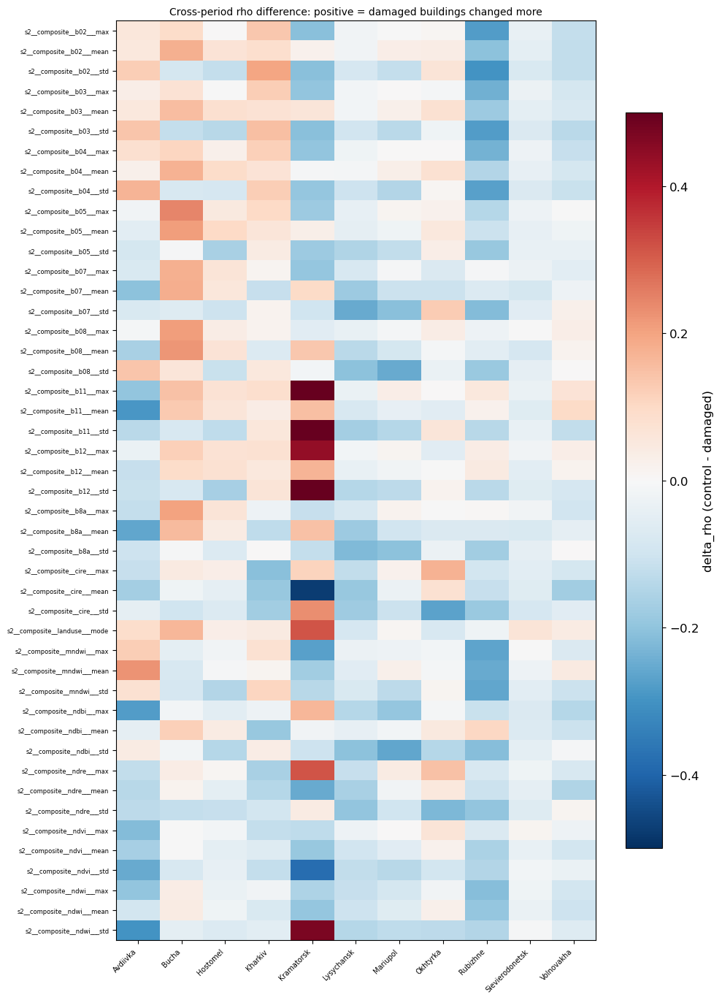

  Plot: cell09_vif_corr/cross_period_delta_rho_heatmap_20260421_235400.png

PART C: WITHIN-POST VIF + SPEARMAN (deduplicated, ML-relevant)
  Saved: cell09_vif_corr/Avdiivka_vif_dedup_20260421_235401.csv (3.1 KB)

  Avdiivka: 50 features (deduplicated, no QA)
    VIF > 10: 36
      [post ] s2__composite__b05__post_winter_baseline_max       VIF=435.7
      [post ] s2__composite__b8a__post_winter_baseline_max       VIF=416.2
      [post ] s2__composite__b04__post_winter_baseline_max       VIF=325.2
      [post ] s2__composite__b03__post_winter_baseline_max       VIF=301.0
      [post ] s2__composite__b07__post_winter_baseline_max       VIF=230.3
      [pre  ] s2__composite__mndwi__prebattle_baseline_mean      VIF=181.6
      [pre  ] s2__composite__b08__prebattle_baseline_mean        VIF=164.7
      [pre  ] s2__composite__ndwi__prebattle_baseline_mean       VIF=149.5
      [post ] s2__composite__b08__post_winter_baseline_max       VIF=144.4
      [post ] s2__composite__b02__post_winter_bas

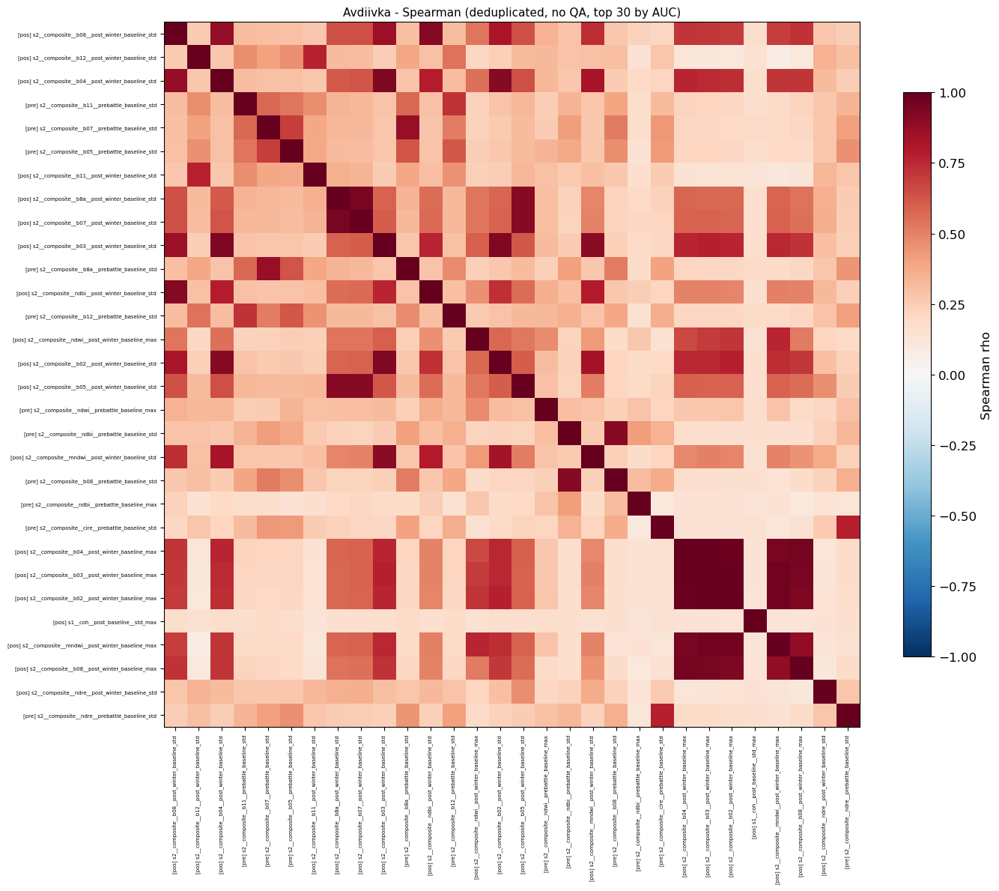

  Plot: cell09_vif_corr/Avdiivka_correlation_heatmap_dedup_20260421_235401.png
    Non-trivial |rho| > 0.9 pairs: 18
      s2__composite__b08__post_winter_baseline_std <-> s2__composite__ndbi__post_winter_baseline_std: rho=0.918
      s2__composite__b04__post_winter_baseline_std <-> s2__composite__b03__post_winter_baseline_std: rho=0.931
      s2__composite__b04__post_winter_baseline_std <-> s2__composite__b02__post_winter_baseline_std: rho=0.912
      s2__composite__b8a__post_winter_baseline_std <-> s2__composite__b07__post_winter_baseline_std: rho=0.951
      s2__composite__b8a__post_winter_baseline_std <-> s2__composite__b05__post_winter_baseline_std: rho=0.912
  Saved: cell09_vif_corr/Borodyanka_vif_dedup_20260421_235402.csv (1.6 KB)

  Borodyanka: 36 features (deduplicated, no QA)
    VIF > 10: 29
      [post ] s1__coh__post_baseline__mean_mean                  VIF=166799986198907.2
      [delta] s1____delta__mean_mean                             VIF=55599995399635.8
      [post ]

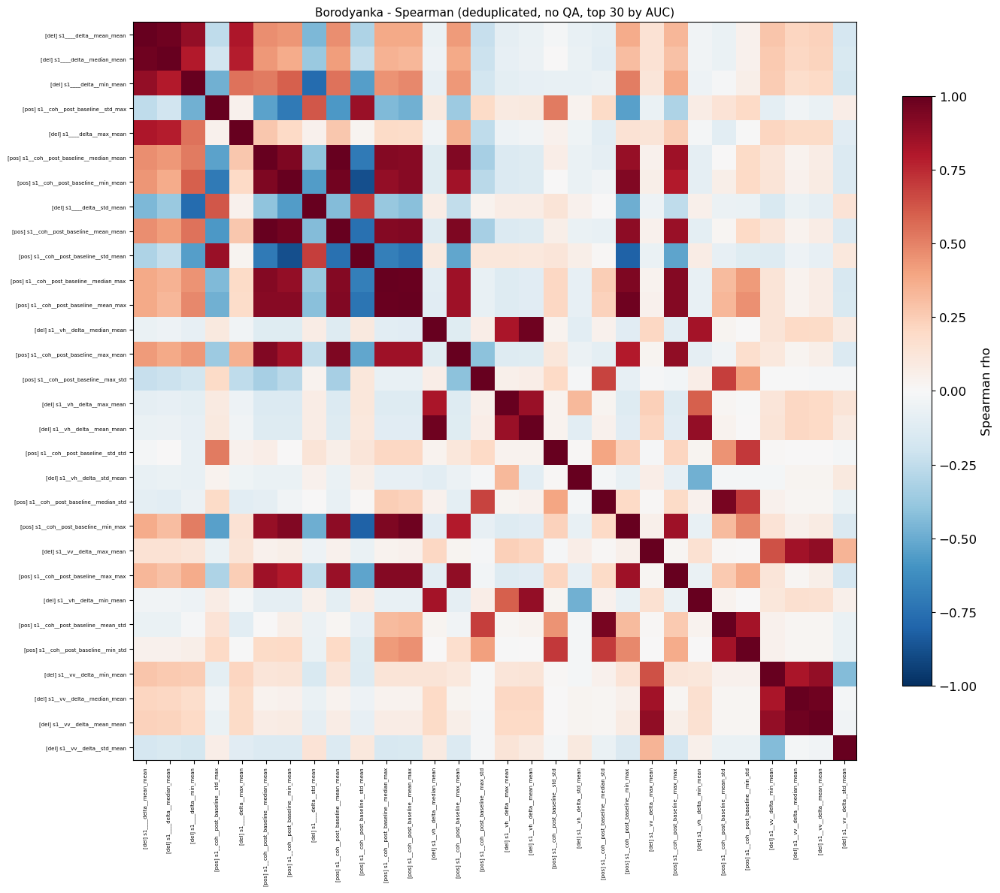

  Plot: cell09_vif_corr/Borodyanka_correlation_heatmap_dedup_20260421_235402.png
    Non-trivial |rho| > 0.9 pairs: 20
      s1____delta__mean_mean <-> s1____delta__median_mean: rho=0.975
      s1__coh__post_baseline__median_mean <-> s1__coh__post_baseline__min_mean: rho=0.934
      s1__coh__post_baseline__median_mean <-> s1__coh__post_baseline__mean_mean: rho=0.992
      s1__coh__post_baseline__median_mean <-> s1__coh__post_baseline__median_max: rho=0.917
      s1__coh__post_baseline__median_mean <-> s1__coh__post_baseline__mean_max: rho=0.910
  Saved: cell09_vif_corr/Bucha_vif_dedup_20260421_235404.csv (3.0 KB)

  Bucha: 50 features (deduplicated, no QA)
    VIF > 10: 39
      [post ] s2__composite__b03__post_winter_baseline_max       VIF=255.6
      [post ] s2__composite__b04__post_winter_baseline_max       VIF=175.6
      [post ] s2__composite__b02__post_winter_baseline_max       VIF=152.4
      [post ] s2__composite__ndre__post_winter_baseline_mean     VIF=114.8
      [post ] s2__

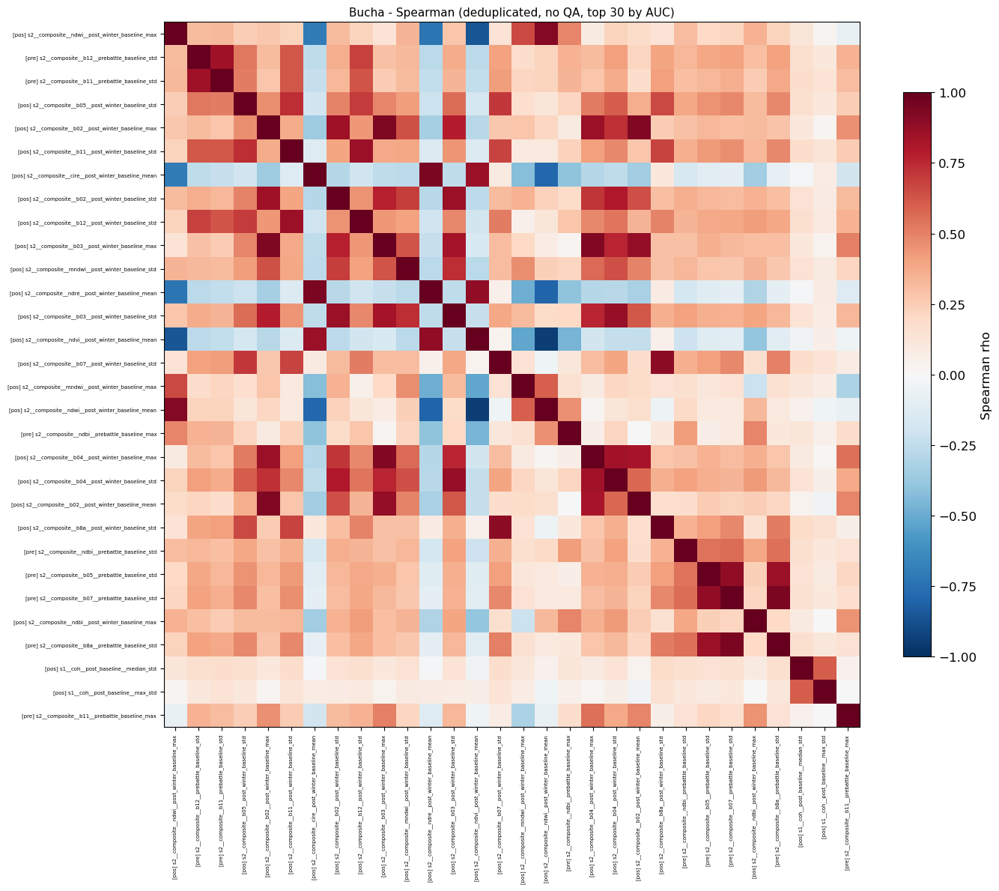

  Plot: cell09_vif_corr/Bucha_correlation_heatmap_dedup_20260421_235404.png
    Non-trivial |rho| > 0.9 pairs: 7
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__post_winter_baseline_mean: rho=0.915
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b03__post_winter_baseline_max: rho=0.932
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b02__post_winter_baseline_mean: rho=0.929
      s2__composite__cire__post_winter_baseline_mean <-> s2__composite__ndre__post_winter_baseline_mean: rho=0.941
      s2__composite__b03__post_winter_baseline_max <-> s2__composite__b04__post_winter_baseline_max: rho=0.924
  Saved: cell09_vif_corr/Chernihiv_vif_dedup_20260421_235407.csv (2.9 KB)

  Chernihiv: 50 features (deduplicated, no QA)
    VIF > 10: 46
      [pre  ] s2__composite__mndwi__prebattle_baseline_mean      VIF=5438.1
      [pre  ] s2__composite__ndwi__prebattle_baseline_mean       VIF=5409.3
      [delta] s1__vh__delta__mean

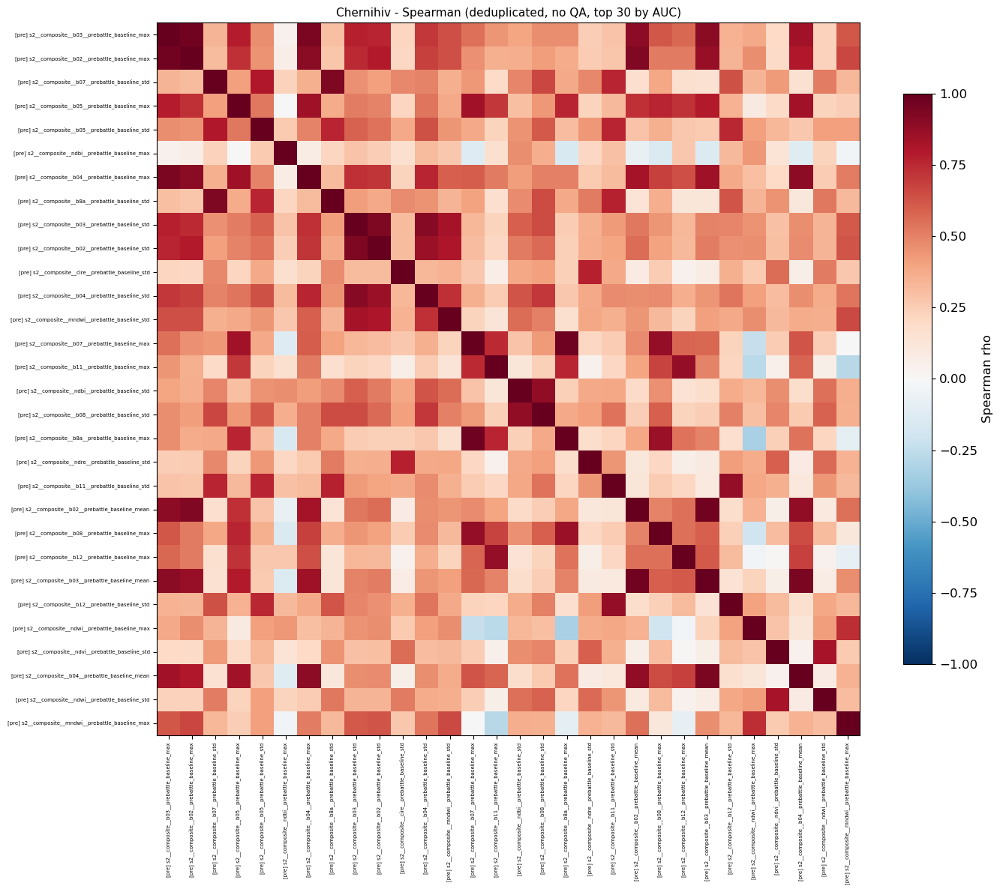

  Plot: cell09_vif_corr/Chernihiv_correlation_heatmap_dedup_20260421_235407.png
    Non-trivial |rho| > 0.9 pairs: 10
      s2__composite__b03__prebattle_baseline_max <-> s2__composite__b02__prebattle_baseline_max: rho=0.967
      s2__composite__b03__prebattle_baseline_max <-> s2__composite__b04__prebattle_baseline_max: rho=0.938
      s2__composite__b03__prebattle_baseline_max <-> s2__composite__b03__prebattle_baseline_mean: rho=0.902
      s2__composite__b02__prebattle_baseline_max <-> s2__composite__b02__prebattle_baseline_mean: rho=0.922
      s2__composite__b07__prebattle_baseline_std <-> s2__composite__b8a__prebattle_baseline_std: rho=0.934
  Saved: cell09_vif_corr/Chornobaivka_vif_dedup_20260421_235408.csv (3.1 KB)

  Chornobaivka: 50 features (deduplicated, no QA)
    VIF > 10: 47
      [post ] s2__composite__b03__post_winter_baseline_max       VIF=185.8
      [pre  ] s2__composite__b03__prebattle_baseline_max         VIF=183.5
      [pre  ] s2__composite__b03__prebattle_baseli

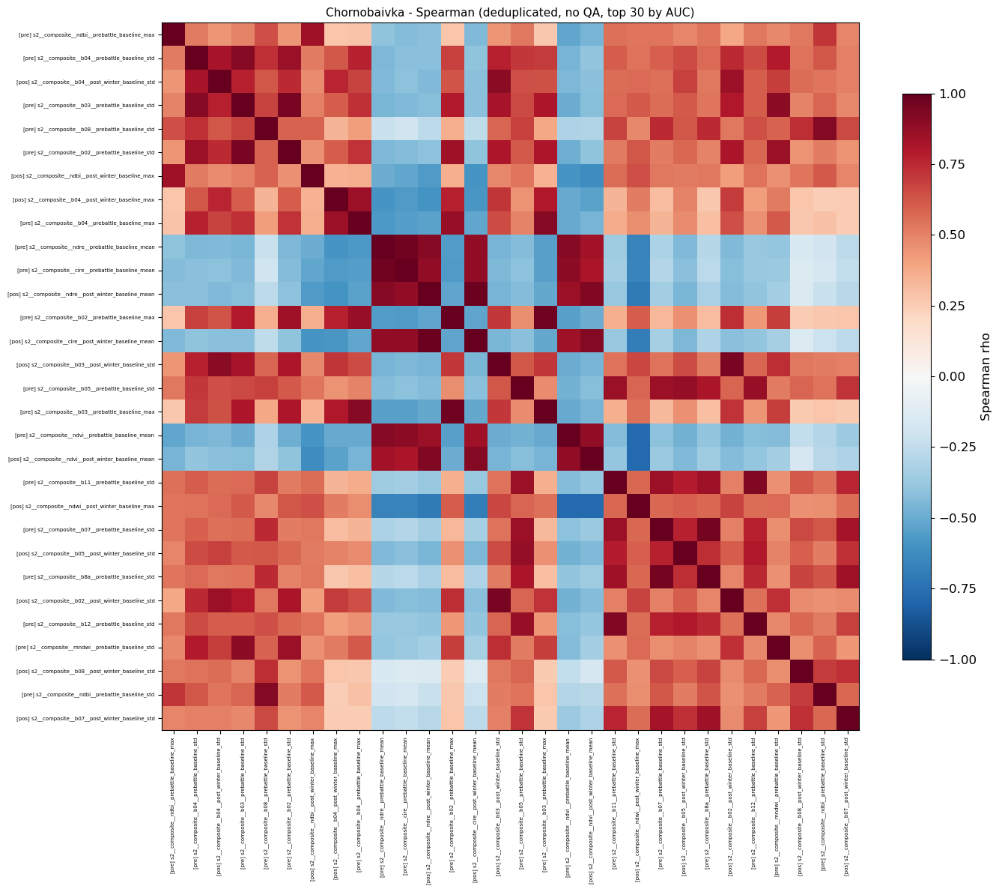

  Plot: cell09_vif_corr/Chornobaivka_correlation_heatmap_dedup_20260421_235409.png
    Non-trivial |rho| > 0.9 pairs: 15
      s2__composite__b04__prebattle_baseline_std <-> s2__composite__b03__prebattle_baseline_std: rho=0.908
      s2__composite__b04__post_winter_baseline_std <-> s2__composite__b03__post_winter_baseline_std: rho=0.901
      s2__composite__b03__prebattle_baseline_std <-> s2__composite__b02__prebattle_baseline_std: rho=0.953
      s2__composite__b08__prebattle_baseline_std <-> s2__composite__ndbi__prebattle_baseline_std: rho=0.916
      s2__composite__b04__prebattle_baseline_max <-> s2__composite__b03__prebattle_baseline_max: rho=0.908
  Saved: cell09_vif_corr/Dmytrivka_vif_dedup_20260421_235410.csv (2.7 KB)

  Dmytrivka: 50 features (deduplicated, no QA)
    VIF > 10: 44
      [post ] s1__coh__post_baseline__median_std                 VIF=inf
      [post ] s1__coh__post_baseline__mean_std                   VIF=inf
      [post ] s1__coh__post_baseline__mean_max        

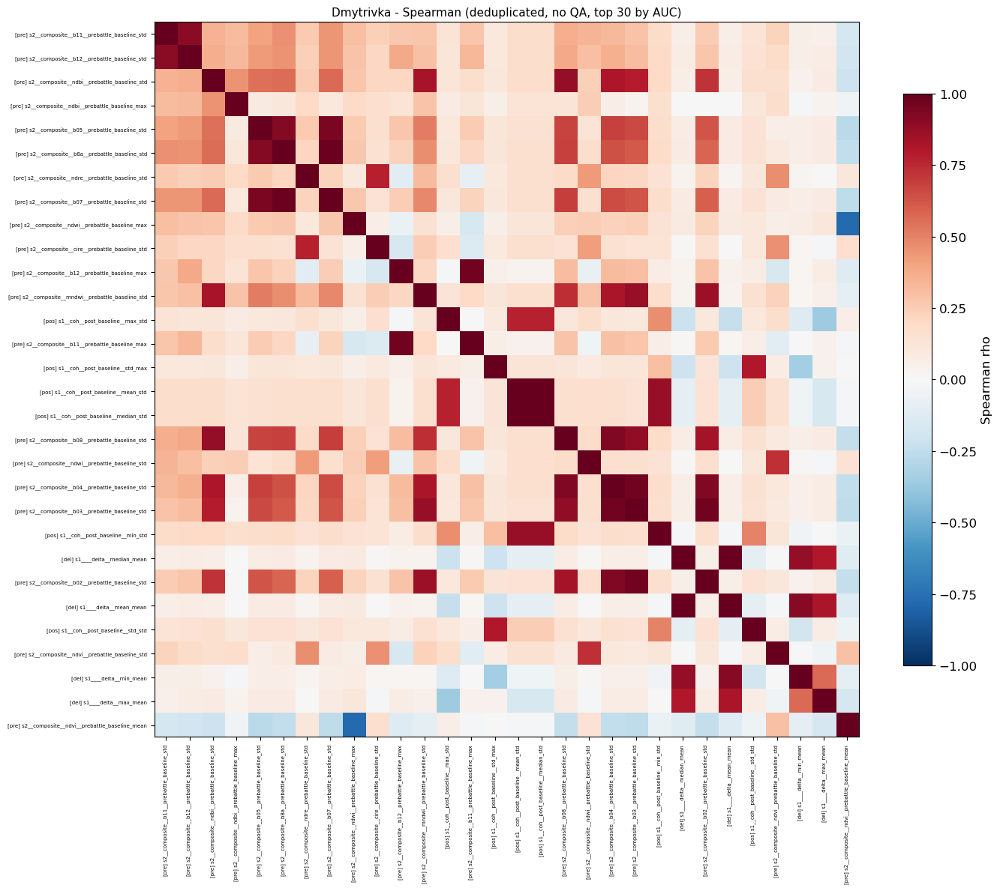

  Plot: cell09_vif_corr/Dmytrivka_correlation_heatmap_dedup_20260421_235410.png
    Non-trivial |rho| > 0.9 pairs: 12
      s2__composite__b11__prebattle_baseline_std <-> s2__composite__b12__prebattle_baseline_std: rho=0.905
      s2__composite__b05__prebattle_baseline_std <-> s2__composite__b8a__prebattle_baseline_std: rho=0.922
      s2__composite__b05__prebattle_baseline_std <-> s2__composite__b07__prebattle_baseline_std: rho=0.939
      s2__composite__b8a__prebattle_baseline_std <-> s2__composite__b07__prebattle_baseline_std: rho=0.977
      s2__composite__b12__prebattle_baseline_max <-> s2__composite__b11__prebattle_baseline_max: rho=0.962
  Saved: cell09_vif_corr/Hostomel_vif_dedup_20260421_235412.csv (3.1 KB)

  Hostomel: 50 features (deduplicated, no QA)
    VIF > 10: 45
      [pre  ] s2__composite__b03__prebattle_baseline_mean        VIF=805.3
      [pre  ] s2__composite__b04__prebattle_baseline_mean        VIF=787.2
      [pre  ] s2__composite__ndwi__prebattle_baseline_mean  

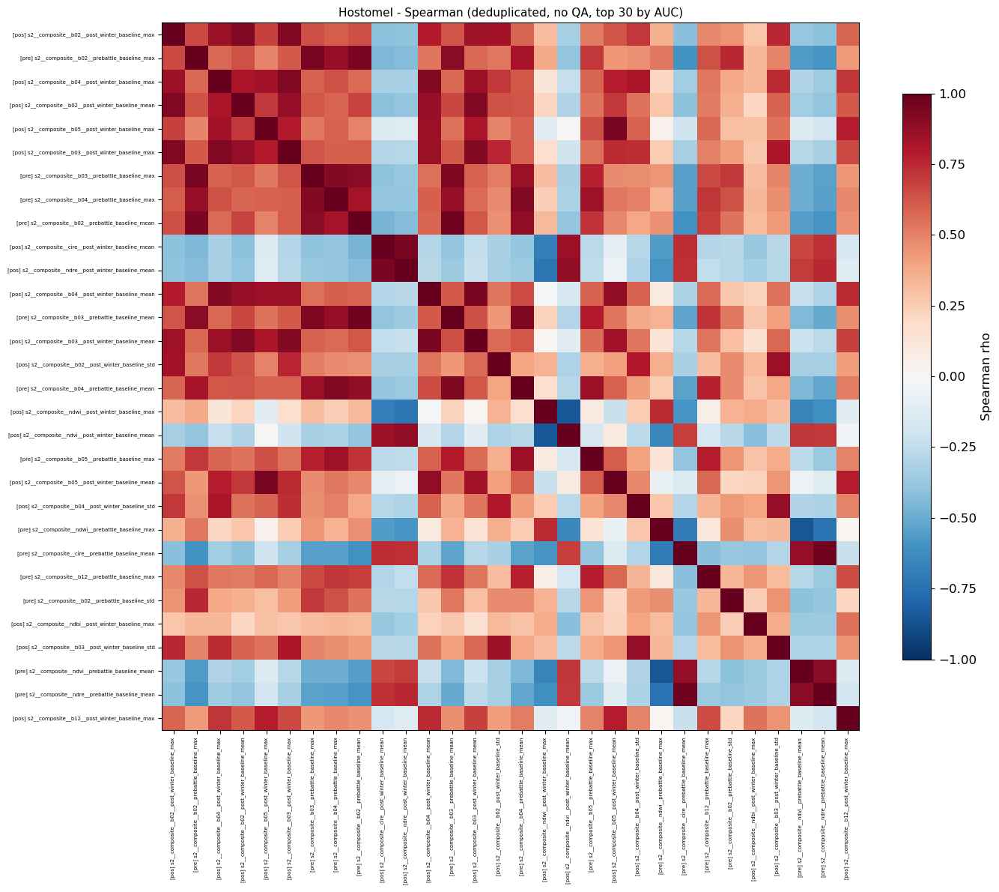

  Plot: cell09_vif_corr/Hostomel_correlation_heatmap_dedup_20260421_235413.png
    Non-trivial |rho| > 0.9 pairs: 19
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b02__post_winter_baseline_mean: rho=0.928
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b03__post_winter_baseline_max: rho=0.927
      s2__composite__b02__prebattle_baseline_max <-> s2__composite__b03__prebattle_baseline_max: rho=0.950
      s2__composite__b02__prebattle_baseline_max <-> s2__composite__b02__prebattle_baseline_mean: rho=0.941
      s2__composite__b02__prebattle_baseline_max <-> s2__composite__b03__prebattle_baseline_mean: rho=0.903
  Saved: cell09_vif_corr/Irpin_vif_dedup_20260421_235415.csv (2.9 KB)

  Irpin: 50 features (deduplicated, no QA)
    VIF > 10: 50
      [pre  ] s2__composite__b07__prebattle_baseline_mean        VIF=1369.1
      [pre  ] s2__composite__b8a__prebattle_baseline_mean        VIF=1341.8
      [pre  ] s2__composite__b07__prebattle_baseline_m

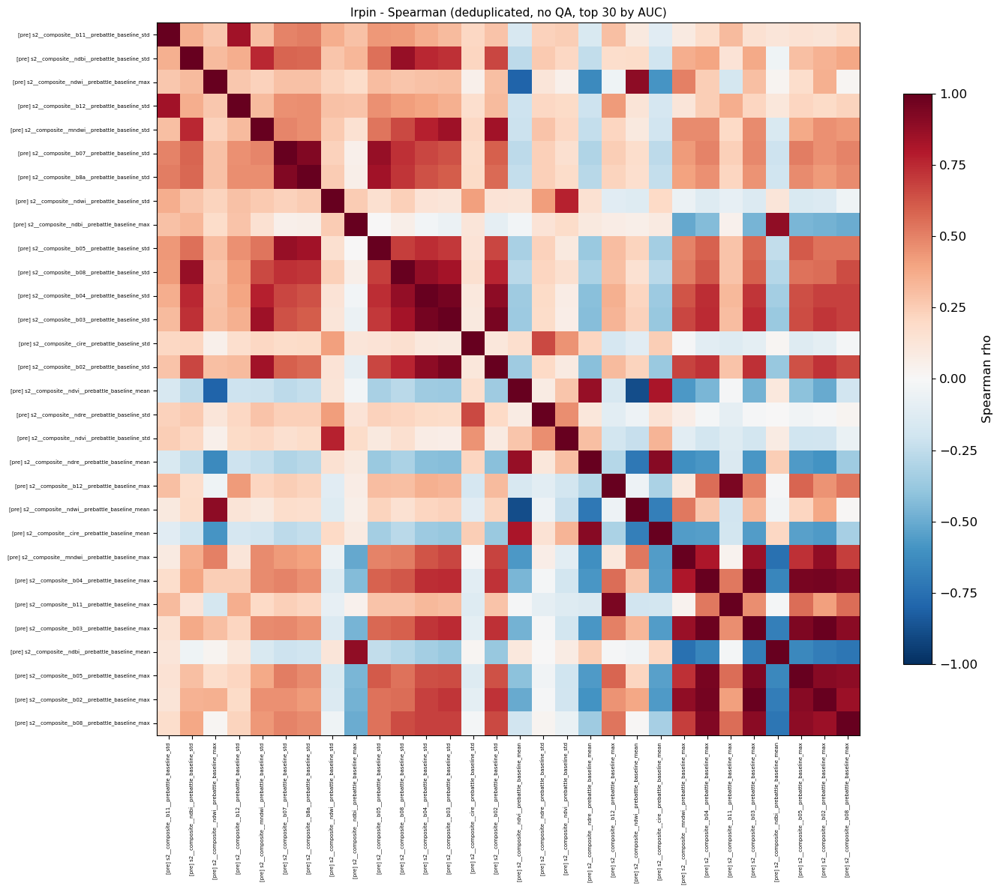

  Plot: cell09_vif_corr/Irpin_correlation_heatmap_dedup_20260421_235416.png
    Non-trivial |rho| > 0.9 pairs: 13
      s2__composite__b07__prebattle_baseline_std <-> s2__composite__b8a__prebattle_baseline_std: rho=0.929
      s2__composite__b04__prebattle_baseline_std <-> s2__composite__b03__prebattle_baseline_std: rho=0.957
      s2__composite__b03__prebattle_baseline_std <-> s2__composite__b02__prebattle_baseline_std: rho=0.947
      s2__composite__ndre__prebattle_baseline_mean <-> s2__composite__cire__prebattle_baseline_mean: rho=0.910
      s2__composite__b12__prebattle_baseline_max <-> s2__composite__b11__prebattle_baseline_max: rho=0.939
  Saved: cell09_vif_corr/Kharkiv_vif_dedup_20260421_235425.csv (3.1 KB)

  Kharkiv: 50 features (deduplicated, no QA)
    VIF > 10: 46
      [post ] s2__composite__b03__post_winter_baseline_max       VIF=382.8
      [pre  ] s2__composite__b03__prebattle_baseline_max         VIF=360.7
      [post ] s2__composite__b04__post_winter_baseline_max    

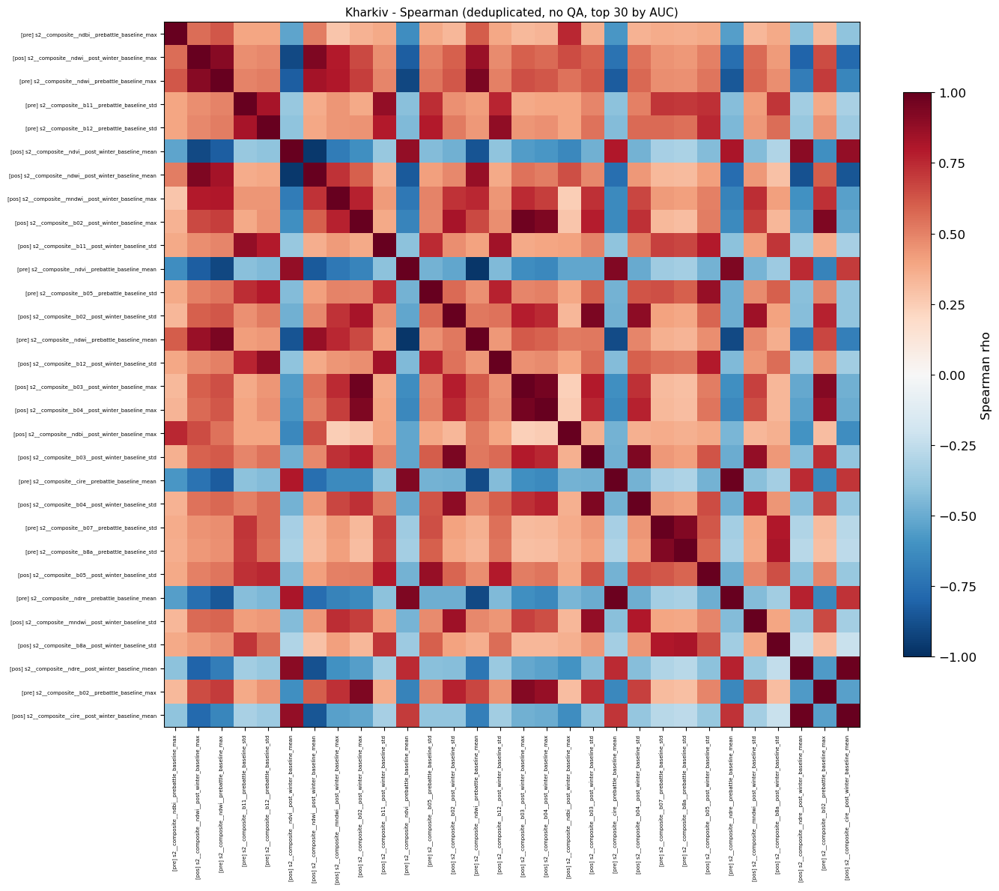

  Plot: cell09_vif_corr/Kharkiv_correlation_heatmap_dedup_20260421_235426.png
    Non-trivial |rho| > 0.9 pairs: 21
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__prebattle_baseline_max: rho=0.907
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndvi__post_winter_baseline_mean: rho=-0.903
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__post_winter_baseline_mean: rho=0.933
      s2__composite__ndwi__prebattle_baseline_max <-> s2__composite__ndvi__prebattle_baseline_mean: rho=-0.914
      s2__composite__ndwi__prebattle_baseline_max <-> s2__composite__ndwi__prebattle_baseline_mean: rho=0.944
  Saved: cell09_vif_corr/Kherson_vif_dedup_20260421_235428.csv (3.1 KB)

  Kherson: 50 features (deduplicated, no QA)
    VIF > 10: 46
      [post ] s2__composite__b03__post_winter_baseline_max       VIF=183.0
      [pre  ] s2__composite__b03__prebattle_baseline_max         VIF=153.6
      [pre  ] s2__composite__b03__preb

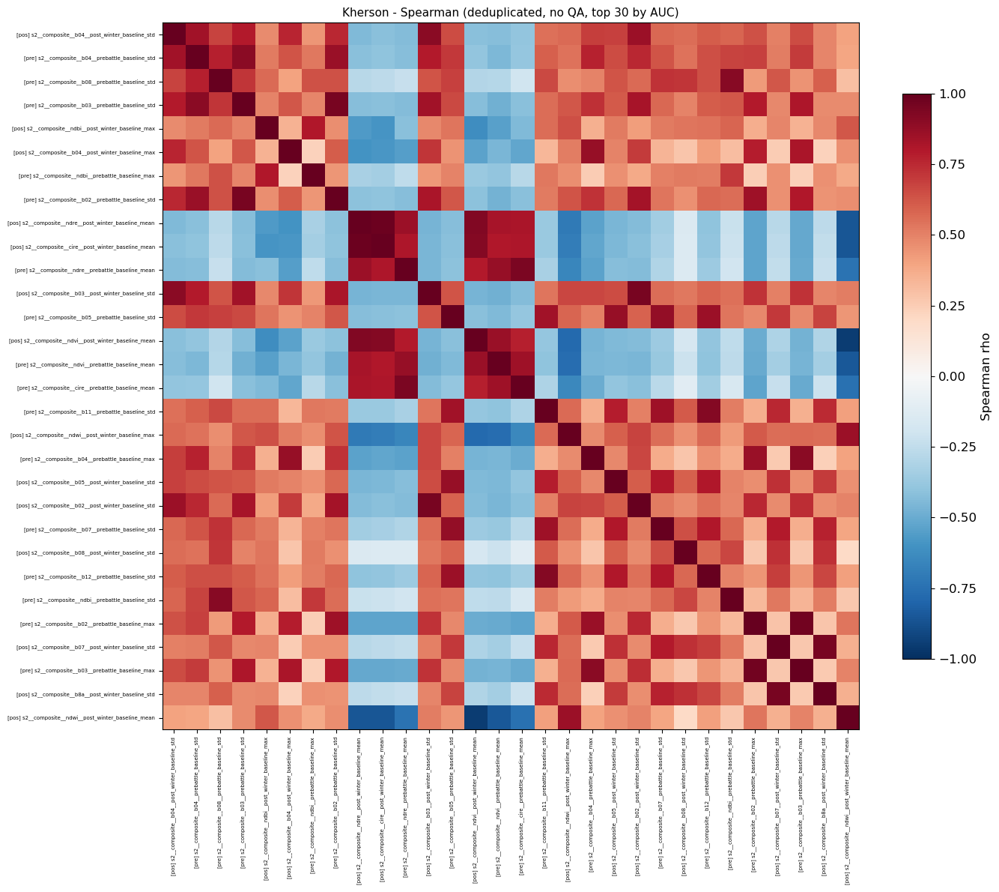

  Plot: cell09_vif_corr/Kherson_correlation_heatmap_dedup_20260421_235428.png
    Non-trivial |rho| > 0.9 pairs: 14
      s2__composite__b04__post_winter_baseline_std <-> s2__composite__b03__post_winter_baseline_std: rho=0.901
      s2__composite__b04__prebattle_baseline_std <-> s2__composite__b03__prebattle_baseline_std: rho=0.901
      s2__composite__b08__prebattle_baseline_std <-> s2__composite__ndbi__prebattle_baseline_std: rho=0.908
      s2__composite__b03__prebattle_baseline_std <-> s2__composite__b02__prebattle_baseline_std: rho=0.947
      s2__composite__ndre__post_winter_baseline_mean <-> s2__composite__cire__post_winter_baseline_mean: rho=0.981
  Saved: cell09_vif_corr/Kramatorsk_vif_dedup_20260421_235430.csv (3.0 KB)

  Kramatorsk: 50 features (deduplicated, no QA)
    VIF > 10: 38
      [post ] s1__coh__post_baseline__mean_max                   VIF=247.6
      [post ] s1__coh__post_baseline__median_max                 VIF=184.2
      [post ] s2__composite__b04__post_winter

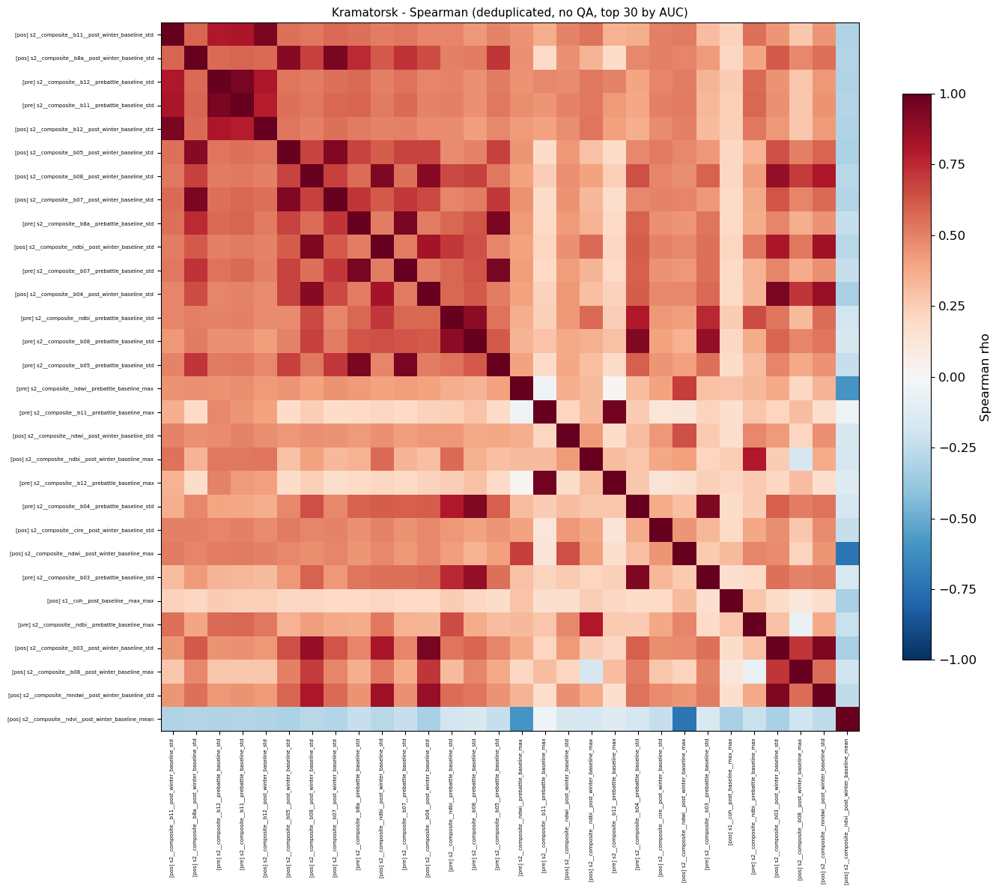

  Plot: cell09_vif_corr/Kramatorsk_correlation_heatmap_dedup_20260421_235430.png
    Non-trivial |rho| > 0.9 pairs: 15
      s2__composite__b11__post_winter_baseline_std <-> s2__composite__b12__post_winter_baseline_std: rho=0.944
      s2__composite__b8a__post_winter_baseline_std <-> s2__composite__b05__post_winter_baseline_std: rho=0.910
      s2__composite__b8a__post_winter_baseline_std <-> s2__composite__b07__post_winter_baseline_std: rho=0.942
      s2__composite__b12__prebattle_baseline_std <-> s2__composite__b11__prebattle_baseline_std: rho=0.952
      s2__composite__b05__post_winter_baseline_std <-> s2__composite__b07__post_winter_baseline_std: rho=0.926
  Saved: cell09_vif_corr/Lysychansk_vif_dedup_20260421_235433.csv (3.1 KB)

  Lysychansk: 50 features (deduplicated, no QA)
    VIF > 10: 43
      [post ] s2__composite__b03__post_winter_baseline_max       VIF=231.4
      [post ] s2__composite__ndwi__post_winter_baseline_mean     VIF=181.0
      [post ] s2__composite__b04__post_

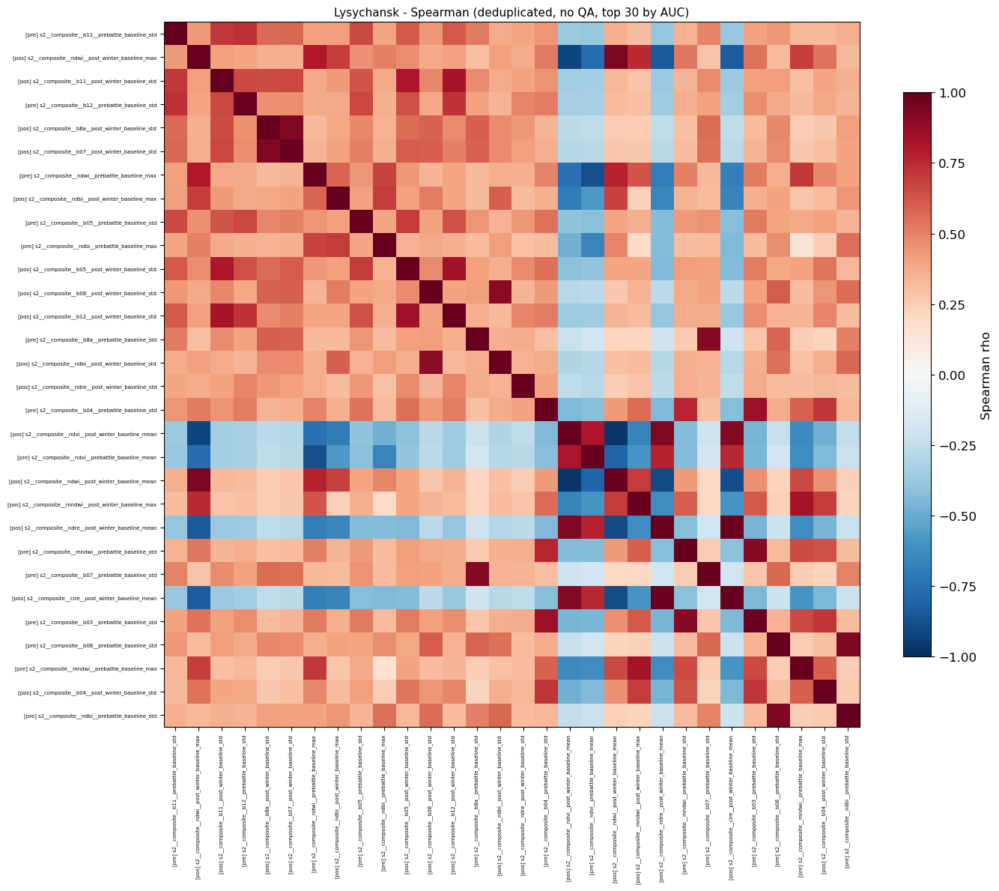

  Plot: cell09_vif_corr/Lysychansk_correlation_heatmap_dedup_20260421_235433.png
    Non-trivial |rho| > 0.9 pairs: 11
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndvi__post_winter_baseline_mean: rho=-0.916
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__post_winter_baseline_mean: rho=0.938
      s2__composite__b8a__post_winter_baseline_std <-> s2__composite__b07__post_winter_baseline_std: rho=0.927
      s2__composite__b08__post_winter_baseline_std <-> s2__composite__ndbi__post_winter_baseline_std: rho=0.901
      s2__composite__b8a__prebattle_baseline_std <-> s2__composite__b07__prebattle_baseline_std: rho=0.919
  Saved: cell09_vif_corr/Makariv_vif_dedup_20260421_235435.csv (2.9 KB)

  Makariv: 50 features (deduplicated, no QA)
    VIF > 10: 46
      [pre  ] s2__composite__mndwi__prebattle_baseline_mean      VIF=12314.6
      [pre  ] s2__composite__ndbi__prebattle_baseline_mean       VIF=8299.7
      [pre  ] s2__composite__ndwi_

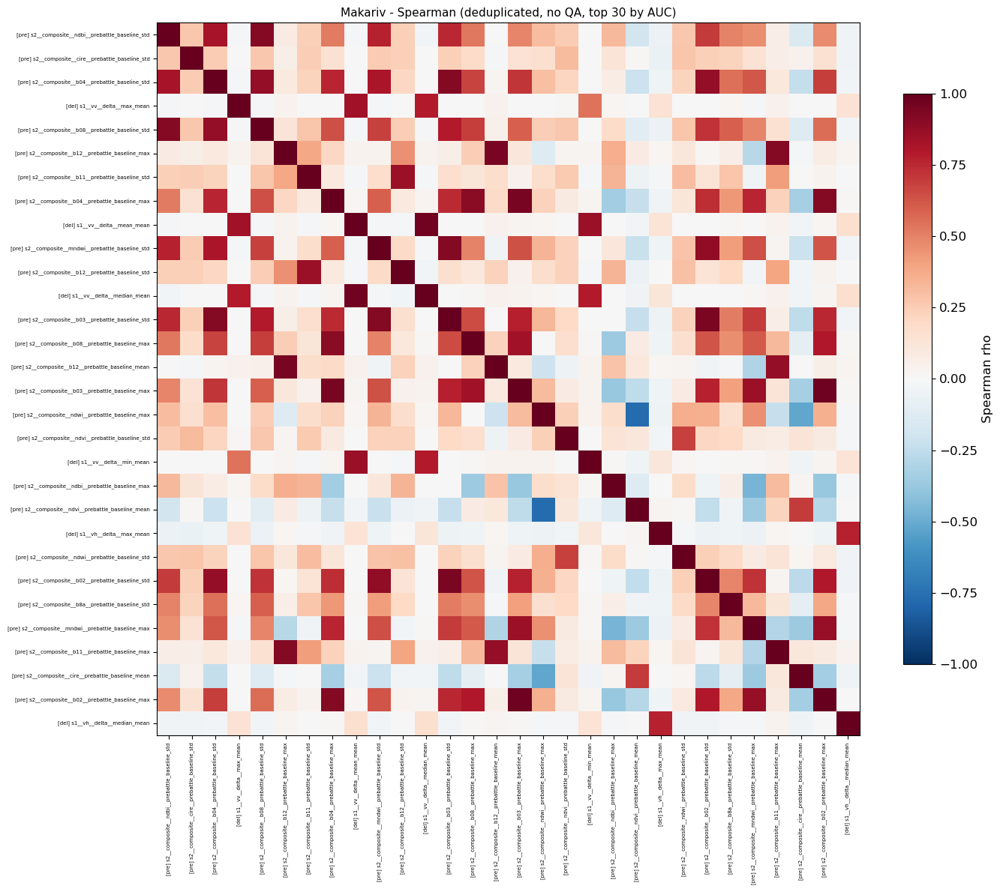

  Plot: cell09_vif_corr/Makariv_correlation_heatmap_dedup_20260421_235435.png
    Non-trivial |rho| > 0.9 pairs: 11
      s2__composite__ndbi__prebattle_baseline_std <-> s2__composite__b08__prebattle_baseline_std: rho=0.915
      s2__composite__b04__prebattle_baseline_std <-> s2__composite__b03__prebattle_baseline_std: rho=0.921
      s2__composite__b12__prebattle_baseline_max <-> s2__composite__b12__prebattle_baseline_mean: rho=0.950
      s2__composite__b12__prebattle_baseline_max <-> s2__composite__b11__prebattle_baseline_max: rho=0.914
      s2__composite__b04__prebattle_baseline_max <-> s2__composite__b08__prebattle_baseline_max: rho=0.905
  Saved: cell09_vif_corr/Mariupol_vif_dedup_20260421_235437.csv (3.1 KB)

  Mariupol: 50 features (deduplicated, no QA)
    VIF > 10: 42
      [post ] s2__composite__ndwi__post_winter_baseline_mean     VIF=117.3
      [post ] s2__composite__b03__post_winter_baseline_max       VIF=116.0
      [pre  ] s2__composite__b03__prebattle_baseline_max    

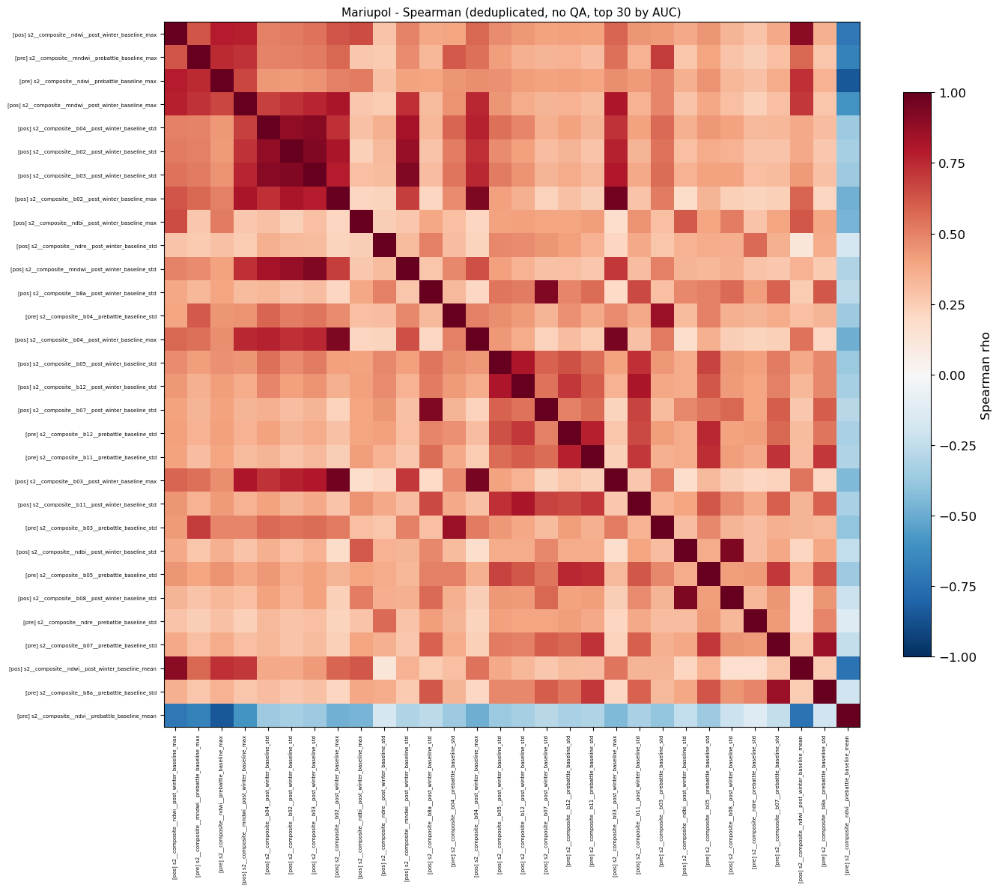

  Plot: cell09_vif_corr/Mariupol_correlation_heatmap_dedup_20260421_235437.png
    Non-trivial |rho| > 0.9 pairs: 9
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__post_winter_baseline_mean: rho=0.901
      s2__composite__b04__post_winter_baseline_std <-> s2__composite__b03__post_winter_baseline_std: rho=0.907
      s2__composite__b02__post_winter_baseline_std <-> s2__composite__b03__post_winter_baseline_std: rho=0.925
      s2__composite__b03__post_winter_baseline_std <-> s2__composite__mndwi__post_winter_baseline_std: rho=0.927
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b04__post_winter_baseline_max: rho=0.936
  Saved: cell09_vif_corr/Okhtyrka_vif_dedup_20260421_235439.csv (3.1 KB)

  Okhtyrka: 50 features (deduplicated, no QA)
    VIF > 10: 42
      [post ] s2__composite__ndvi__post_winter_baseline_mean     VIF=1719.0
      [post ] s2__composite__b04__post_winter_baseline_mean      VIF=1578.6
      [post ] s2__composite__ndwi__

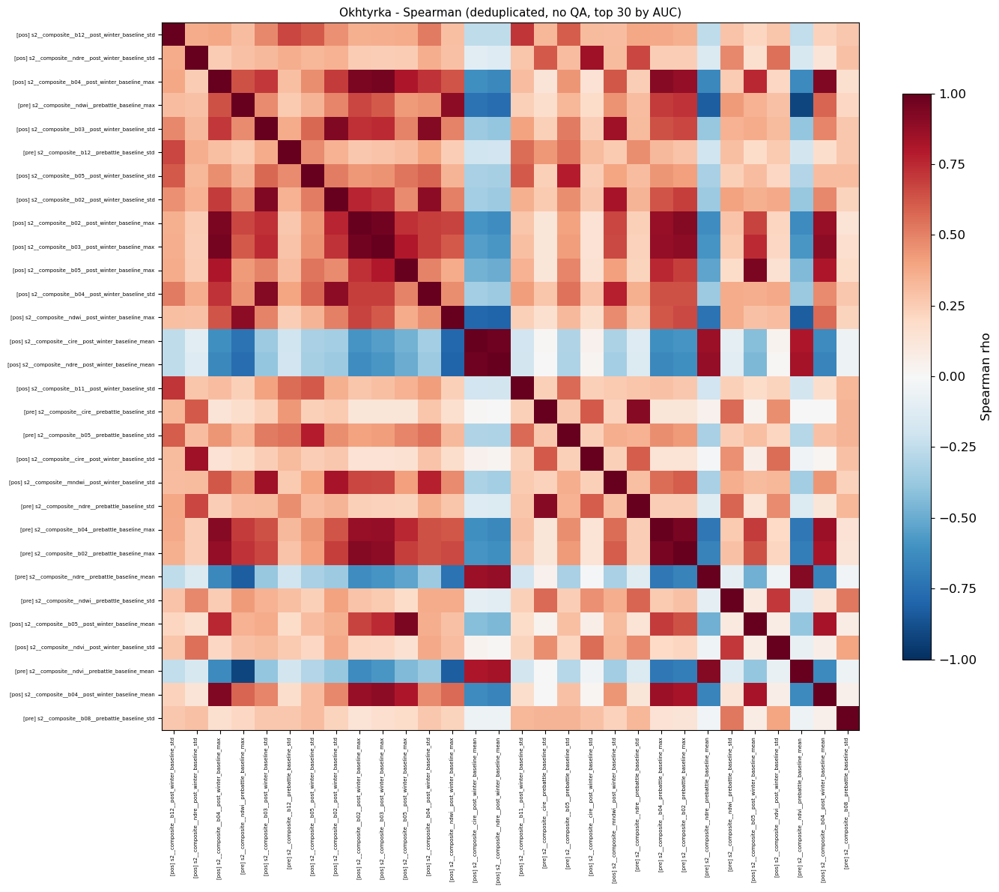

  Plot: cell09_vif_corr/Okhtyrka_correlation_heatmap_dedup_20260421_235439.png
    Non-trivial |rho| > 0.9 pairs: 14
      s2__composite__b04__post_winter_baseline_max <-> s2__composite__b02__post_winter_baseline_max: rho=0.944
      s2__composite__b04__post_winter_baseline_max <-> s2__composite__b03__post_winter_baseline_max: rho=0.959
      s2__composite__b04__post_winter_baseline_max <-> s2__composite__b04__prebattle_baseline_max: rho=0.910
      s2__composite__b04__post_winter_baseline_max <-> s2__composite__b04__post_winter_baseline_mean: rho=0.928
      s2__composite__ndwi__prebattle_baseline_max <-> s2__composite__ndvi__prebattle_baseline_mean: rho=-0.915
  Saved: cell09_vif_corr/Rubizhne_vif_dedup_20260421_235441.csv (3.1 KB)

  Rubizhne: 50 features (deduplicated, no QA)
    VIF > 10: 41
      [post ] s2__composite__ndvi__post_winter_baseline_mean     VIF=1933.7
      [post ] s2__composite__ndwi__post_winter_baseline_mean     VIF=1575.3
      [post ] s2__composite__b04__post_w

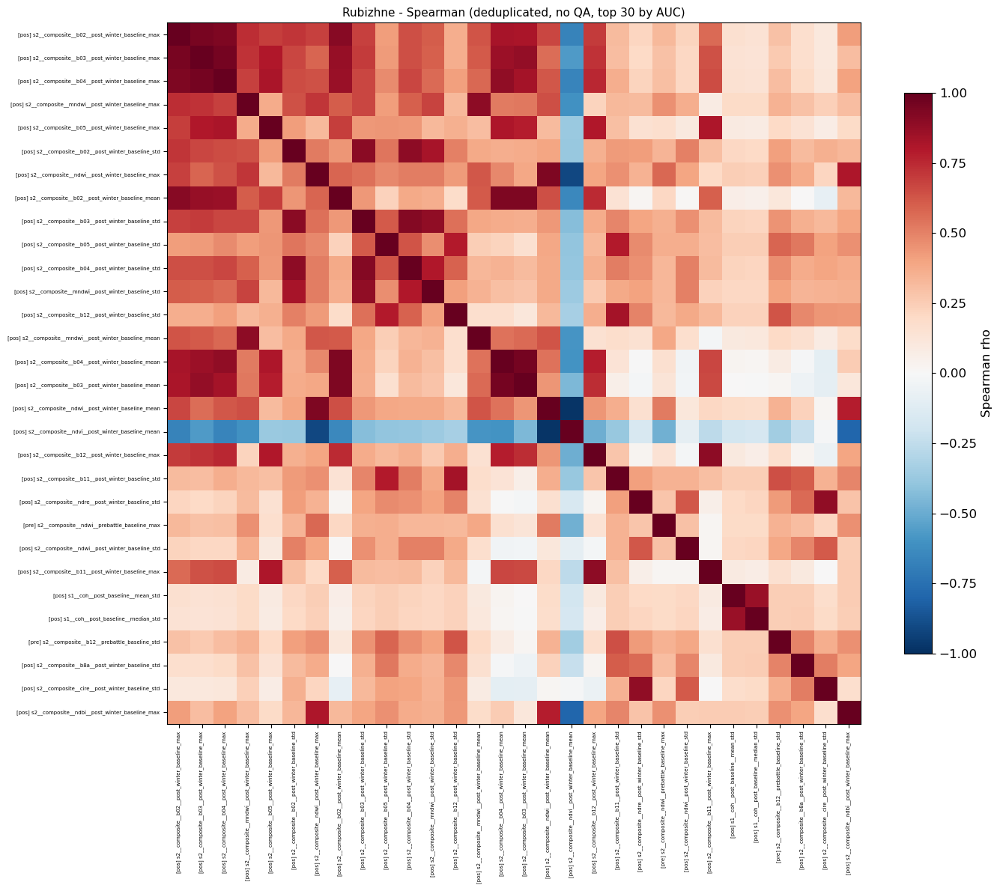

  Plot: cell09_vif_corr/Rubizhne_correlation_heatmap_dedup_20260421_235441.png
    Non-trivial |rho| > 0.9 pairs: 11
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b03__post_winter_baseline_max: rho=0.948
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b04__post_winter_baseline_max: rho=0.933
      s2__composite__b02__post_winter_baseline_max <-> s2__composite__b02__post_winter_baseline_mean: rho=0.912
      s2__composite__b03__post_winter_baseline_max <-> s2__composite__b04__post_winter_baseline_max: rho=0.957
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__post_winter_baseline_mean: rho=0.935
  Saved: cell09_vif_corr/Sievierodonetsk_vif_dedup_20260421_235442.csv (3.1 KB)

  Sievierodonetsk: 50 features (deduplicated, no QA)
    VIF > 10: 47
      [post ] s2__composite__ndwi__post_winter_baseline_mean     VIF=6407.8
      [post ] s2__composite__mndwi__post_winter_baseline_mean    VIF=3854.3
      [post ] s2__com

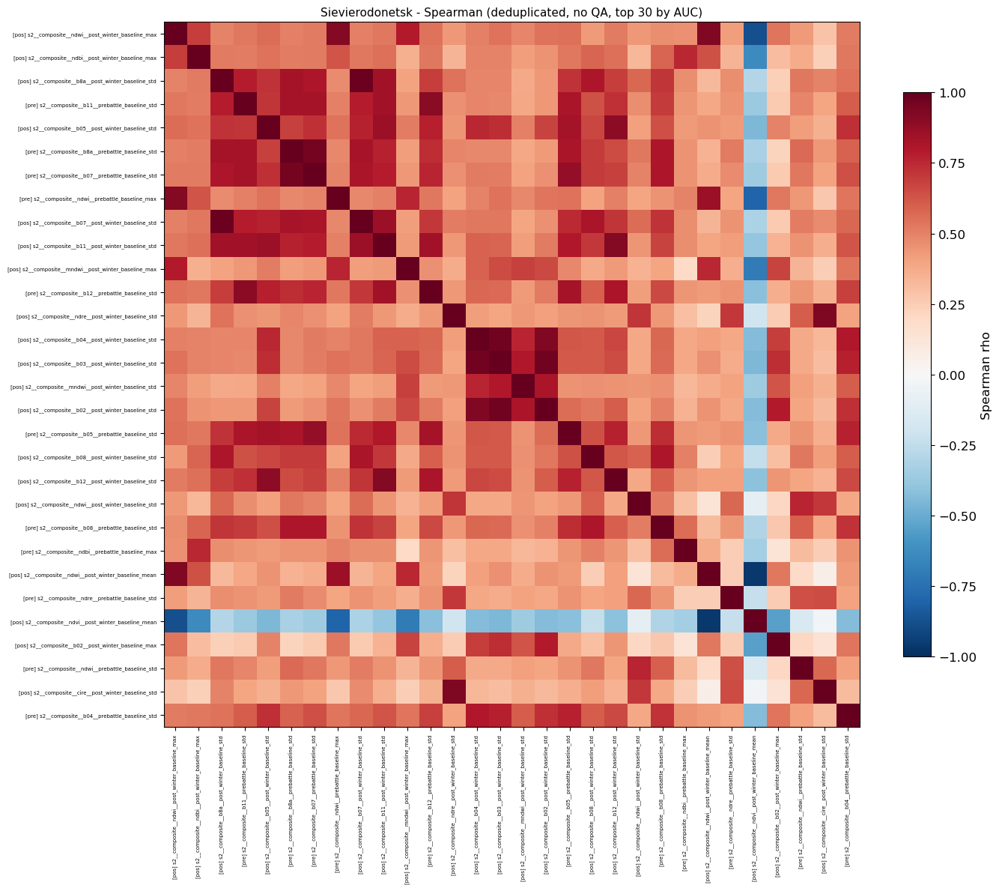

  Plot: cell09_vif_corr/Sievierodonetsk_correlation_heatmap_dedup_20260421_235442.png
    Non-trivial |rho| > 0.9 pairs: 11
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__prebattle_baseline_max: rho=0.917
      s2__composite__ndwi__post_winter_baseline_max <-> s2__composite__ndwi__post_winter_baseline_mean: rho=0.928
      s2__composite__b8a__post_winter_baseline_std <-> s2__composite__b07__post_winter_baseline_std: rho=0.980
      s2__composite__b11__prebattle_baseline_std <-> s2__composite__b12__prebattle_baseline_std: rho=0.901
      s2__composite__b8a__prebattle_baseline_std <-> s2__composite__b07__prebattle_baseline_std: rho=0.957
  Saved: cell09_vif_corr/Volnovakha_vif_dedup_20260421_235444.csv (2.8 KB)

  Volnovakha: 50 features (deduplicated, no QA)
    VIF > 10: 45
      [post ] s1__coh__post_baseline__mean_mean                  VIF=inf
      [post ] s1__coh__post_baseline__median_mean                VIF=inf
      [delta] s1____delta__mean_mean   

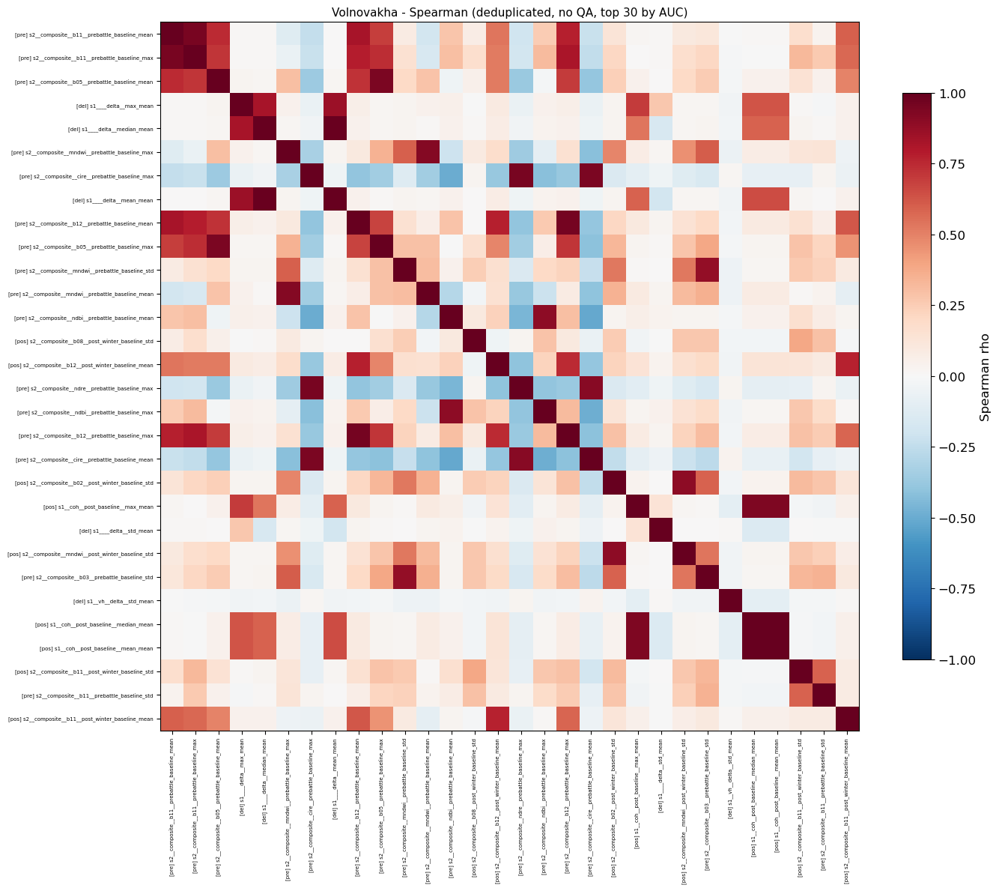

  Plot: cell09_vif_corr/Volnovakha_correlation_heatmap_dedup_20260421_235444.png
    Non-trivial |rho| > 0.9 pairs: 11
      s2__composite__b11__prebattle_baseline_mean <-> s2__composite__b11__prebattle_baseline_max: rho=0.953
      s2__composite__b05__prebattle_baseline_mean <-> s2__composite__b05__prebattle_baseline_max: rho=0.945
      s1____delta__median_mean <-> s1____delta__mean_mean: rho=0.985
      s2__composite__mndwi__prebattle_baseline_max <-> s2__composite__mndwi__prebattle_baseline_mean: rho=0.918
      s2__composite__cire__prebattle_baseline_max <-> s2__composite__ndre__prebattle_baseline_max: rho=0.948


In [11]:
# @title CELL 9: VIF + SPEARMAN CORRELATION
USE_BALANCED = False  # correlation structure of full feature space
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re

print("=" * 70)
print("CELL 9: VIF + SPEARMAN CORRELATION")
print("=" * 70)

# ---- FEATURE PERIOD CLASSIFICATION ----

# period tokens in feature names (order matters: longer matches first)
_PRE_TOKENS = ['prebattle_baseline', 'winter_baseline', 'prebattle']
_POST_TOKENS = ['post_winter_baseline', 'post_baseline', 'post_winter', 'post']
_DELTA_TOKENS = ['delta']

# QA / observation-metadata features: tautological correlations, not damage signal
_QA_PATTERNS = [
    r's2__visibility__',
    r's2__qa__',
    r's2__obs_count__',
    r's1__coh__scenes_observed',
]

# COH drop accumulator features are inherently change measurements
_DELTA_FEATURE_PATTERNS = [
    r's1__coh__running_min',
    r's1__coh__drop_count',
    r's1__coh__max_drop',
    r's1__coh__date_first_drop',
    r's1__coh__date_worst_drop',
    r's1__coh__lu_transition',
]

def classify_feature_period(fname):
    """Return ('pre', 'post', 'delta', 'qa', or 'unknown') for a feature name."""
    for pat in _QA_PATTERNS:
        if re.match(pat, fname):
            return 'qa'
    for pat in _DELTA_FEATURE_PATTERNS:
        if re.match(pat, fname):
            return 'delta'
    for tok in _DELTA_TOKENS:
        if tok in fname:
            return 'delta'
    for tok in _POST_TOKENS:
        if tok in fname:
            return 'post'
    for tok in _PRE_TOKENS:
        if tok in fname:
            return 'pre'
    return 'unknown'

def strip_period_token(fname):
    """Remove the period token from a feature name to get the base signature."""
    for tok in _POST_TOKENS + _PRE_TOKENS:
        if tok in fname:
            return fname.replace(tok, '').replace('____', '__').strip('_')
    return fname

def compute_vif(df_in, feature_cols, max_features=50):
    from numpy.linalg import lstsq
    X = df_in[feature_cols].dropna()
    if len(X) < len(feature_cols) + 10:
        return pd.DataFrame()

    if len(feature_cols) > max_features:
        feature_cols = feature_cols[:max_features]
        X = X[feature_cols]

    # standardize before VIF computation
    X = (X - X.mean()) / X.std().replace(0, 1)

    vif_data = []
    for i, col in enumerate(feature_cols):
        y = X[col].values
        others = X.drop(columns=[col]).values
        try:
            beta, _, _, _ = lstsq(others, y, rcond=None)
            y_pred = others @ beta
            ss_res = np.sum((y - y_pred)**2)
            ss_tot = np.sum((y - y.mean())**2)
            r2 = 1 - ss_res / ss_tot if ss_tot > 0 else 0
            vif = 1 / (1 - r2) if r2 < 1 else np.inf
        except Exception:
            vif = np.nan
        vif_data.append({'feature': col, 'VIF': vif})

    return pd.DataFrame(vif_data).sort_values('VIF', ascending=False)


# ================================================================
# PART A: REDUNDANCY DETECTION (prebattle vs winter, QA features)
# ================================================================
print(f"\n{'='*70}")
print("PART A: REDUNDANCY DETECTION")
print(f"{'='*70}")

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue

    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * 0.5]

    # classify all features
    period_map = {c: classify_feature_period(c) for c in feature_cols}
    pre_cols = [c for c in feature_cols if period_map[c] == 'pre']
    post_cols = [c for c in feature_cols if period_map[c] == 'post']
    delta_cols = [c for c in feature_cols if period_map[c] == 'delta']
    qa_cols = [c for c in feature_cols if period_map[c] == 'qa']

    # detect prebattle vs winter duplicates
    pre_by_base = {}
    for c in pre_cols:
        base = strip_period_token(c)
        pre_by_base.setdefault(base, []).append(c)

    n_dupes = 0
    dupe_pairs = []
    for base, cols in pre_by_base.items():
        if len(cols) == 2:
            valid = city_df[cols].dropna()
            if len(valid) > 20:
                rho = valid[cols[0]].corr(valid[cols[1]], method='spearman')
                if abs(rho) > 0.99:
                    n_dupes += 1
                    dupe_pairs.append((cols[0], cols[1], rho))

    print(f"\n  {CITY}: {len(feature_cols)} features")
    print(f"    PRE: {len(pre_cols)}  POST: {len(post_cols)}  DELTA: {len(delta_cols)}  QA: {len(qa_cols)}")
    if n_dupes > 0:
        print(f"    Prebattle-Winter duplicates (rho>0.99): {n_dupes}")
        for a, b, rho in dupe_pairs[:5]:
            print(f"      {a} <-> {b}: rho={rho:.4f}")
    if qa_cols:
        print(f"    QA features excluded from ML analysis: {qa_cols[:5]}")


# ================================================================
# PART B: CROSS-PERIOD CORRELATION (PRE vs POST)
# The scientifically important test: did the feature change?
# Low rho = change across battle = potential BDA signal
# ================================================================
print(f"\n{'='*70}")
print("PART B: CROSS-PERIOD CORRELATION (PRE vs POST)")
print(f"{'='*70}")
print("  Low rho = feature changed across battle = useful for BDA")
print("  High rho = stable feature = less discriminative")

cross_period_rows = []

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue

    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * 0.5]

    period_map = {c: classify_feature_period(c) for c in feature_cols}
    pre_cols = [c for c in feature_cols if period_map[c] == 'pre']
    post_cols = [c for c in feature_cols if period_map[c] == 'post']

    # match pre->post by base signature
    # for pre: prefer prebattle over winter (avoid double-counting)
    pre_by_base = {}
    for c in pre_cols:
        base = strip_period_token(c)
        if base not in pre_by_base or 'prebattle' in c:
            pre_by_base[base] = c
    post_bases = {strip_period_token(c): c for c in post_cols}

    matched = []
    for base in sorted(set(pre_by_base.keys()) & set(post_bases.keys())):
        matched.append((pre_by_base[base], post_bases[base], base))

    if not matched:
        print(f"\n  {CITY}: no matched pre-post pairs")
        continue

    print(f"\n  {CITY}: {len(matched)} matched pre-post pairs")
    print(f"    {'Base signature':50s} {'rho':>6s}  {'rho_dmg':>8s}  {'rho_ctrl':>8s}  {'delta_rho':>9s}")

    for pre_col, post_col, base in matched:
        valid = city_df[[pre_col, post_col, TARGET_COL]].dropna()
        if len(valid) < 20:
            continue

        rho_all = valid[pre_col].corr(valid[post_col], method='spearman')

        dmg = valid[valid[TARGET_COL] == 1]
        ctrl = valid[valid[TARGET_COL] == 0]
        rho_dmg = dmg[pre_col].corr(dmg[post_col], method='spearman') if len(dmg) > 10 else np.nan
        rho_ctrl = ctrl[pre_col].corr(ctrl[post_col], method='spearman') if len(ctrl) > 10 else np.nan
        delta_rho = rho_ctrl - rho_dmg if not (np.isnan(rho_dmg) or np.isnan(rho_ctrl)) else np.nan

        cross_period_rows.append({
            'city': CITY, 'base': base,
            'pre_col': pre_col, 'post_col': post_col,
            'rho_all': rho_all, 'rho_damaged': rho_dmg,
            'rho_control': rho_ctrl, 'delta_rho': delta_rho,
        })

    # print sorted by delta_rho (biggest difference = most discriminative)
    city_cross = sorted([r for r in cross_period_rows if r['city'] == CITY],
                        key=lambda x: abs(x.get('delta_rho', 0) or 0), reverse=True)
    for r in city_cross[:10]:
        print(f"    {r['base']:50s} {r['rho_all']:+.3f}  {r['rho_damaged']:+8.3f}  {r['rho_control']:+8.3f}  {r['delta_rho']:+9.3f}")

if cross_period_rows:
    cross_df = pd.DataFrame(cross_period_rows)
    save_result(cross_df, 'cross_period_correlation', 'cell09_vif_corr')

    # heatmap: cities x features, colored by delta_rho
    pivot = cross_df.pivot_table(index='base', columns='city', values='delta_rho')
    if len(pivot) > 3 and len(pivot.columns) > 1:
        fig, ax = plt.subplots(figsize=(max(10, len(pivot.columns) * 0.8), max(8, len(pivot) * 0.3)))
        im = ax.imshow(pivot.values, cmap='RdBu_r', vmin=-0.5, vmax=0.5, aspect='auto')
        ax.set_xticks(range(len(pivot.columns)))
        ax.set_yticks(range(len(pivot)))
        ax.set_xticklabels(pivot.columns, rotation=45, ha='right', fontsize=7)
        ax.set_yticklabels(pivot.index, fontsize=6)
        plt.colorbar(im, ax=ax, label='delta_rho (control - damaged)', shrink=0.8)
        ax.set_title('Cross-period rho difference: positive = damaged buildings changed more', fontsize=10)
        plt.tight_layout()
        save_fig(fig, 'cross_period_delta_rho_heatmap', 'cell09_vif_corr')
    else:
        print("  Not enough data for cross-period heatmap")


# ================================================================
# PART C: WITHIN-POST VIF + SPEARMAN (deduplicated, no QA)
# ML-relevant multicollinearity among post-battle features
# ================================================================
print(f"\n{'='*70}")
print("PART C: WITHIN-POST VIF + SPEARMAN (deduplicated, ML-relevant)")
print(f"{'='*70}")

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue

    # post features only, exclude QA
    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * 0.5]
    period_map = {c: classify_feature_period(c) for c in feature_cols}
    post_cols = [c for c in feature_cols if period_map[c] == 'post']
    delta_cols = [c for c in feature_cols if period_map[c] == 'delta']

    # for pre: keep only one of prebattle/winter (prefer prebattle)
    pre_cols_raw = [c for c in feature_cols if period_map[c] == 'pre']
    pre_by_base = {}
    for c in pre_cols_raw:
        base = strip_period_token(c)
        pre_by_base.setdefault(base, []).append(c)
    pre_cols_dedup = []
    for base, cols in pre_by_base.items():
        # prefer prebattle over winter
        pb = [c for c in cols if 'prebattle' in c]
        pre_cols_dedup.append(pb[0] if pb else cols[0])

    ml_cols = post_cols + delta_cols + pre_cols_dedup

    # rank by AUC if available
    if len(auc_df) > 0 and 'city' in auc_df.columns:
        city_auc = auc_df[auc_df['city'] == CITY].sort_values('auc_best', ascending=False)
        ranked = city_auc['feature'].tolist()
        ml_cols = [c for c in ranked if c in ml_cols] + [c for c in ml_cols if c not in ranked]

    ml_cols = ml_cols[:50]

    if len(ml_cols) < 3:
        continue

    # VIF
    vif_result = compute_vif(city_df, ml_cols)
    if len(vif_result) == 0:
        continue

    save_result(vif_result, f'{CITY}_vif_dedup', 'cell09_vif_corr')

    print(f"\n  {CITY}: {len(vif_result)} features (deduplicated, no QA)")
    high_vif = vif_result[vif_result['VIF'] > 10]
    print(f"    VIF > 10: {len(high_vif)}")
    for _, row in vif_result.head(10).iterrows():
        tag = classify_feature_period(row['feature'])
        print(f"      [{tag:5s}] {row['feature']:50s} VIF={row['VIF']:.1f}")

    # Spearman heatmap (top 30 by AUC)
    top_cols = ml_cols[:30]
    if len(top_cols) < 3:
        continue

    corr = city_df[top_cols].corr(method='spearman')

    fig, ax = plt.subplots(figsize=(14, 12))
    im = ax.imshow(corr.values, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
    ax.set_xticks(range(len(top_cols)))
    ax.set_yticks(range(len(top_cols)))
    # label with period tag
    labels = [f"[{classify_feature_period(c)[:3]}] {c}" for c in top_cols]
    ax.set_xticklabels(labels, rotation=90, fontsize=5)
    ax.set_yticklabels(labels, fontsize=5)
    plt.colorbar(im, ax=ax, label='Spearman rho', shrink=0.8)
    ax.set_title(f"{CITY} - Spearman (deduplicated, no QA, top {len(top_cols)} by AUC)", fontsize=11)
    plt.tight_layout()
    save_fig(fig, f'{CITY}_correlation_heatmap_dedup', 'cell09_vif_corr')

    high_corr = []
    for i in range(len(top_cols)):
        for j in range(i+1, len(top_cols)):
            r = corr.iloc[i, j]
            if abs(r) > 0.9:
                # skip pre-pre same-base pairs (already flagged in Part A)
                pi = classify_feature_period(top_cols[i])
                pj = classify_feature_period(top_cols[j])
                if pi == 'pre' and pj == 'pre' and strip_period_token(top_cols[i]) == strip_period_token(top_cols[j]):
                    continue
                high_corr.append((top_cols[i], top_cols[j], r))
    print(f"    Non-trivial |rho| > 0.9 pairs: {len(high_corr)}")
    for a, b, r in high_corr[:5]:
        print(f"      {a} <-> {b}: rho={r:.3f}")


# CELL 10: PCA

Limitation: PCA requires complete data — rows with ANY NaN are dropped.
With SAR NaN structure, this can lose significant data. Results should be
interpreted with this caveat. Consider per-modality PCA if data loss > 50%.

In [12]:
# @title CELL 10: PCA (PER-MODALITY)
USE_BALANCED = True
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

print("=" * 70)
print("CELL 10: PCA (PER-MODALITY)")
print("=" * 70)

MODALITY_GROUPS = {
    'COH': (cat.get_features_by_group('coh', PP_CAT) if cat else []),
    'SAR_backscatter': (cat.get_features_by_group('card', PP_CAT) if cat else []),
    'MS_bands': (cat.get_features_by_group('ms_bands', PP_CAT) if cat else []),
    'MS_indices': (cat.get_features_by_group('ms_indices', PP_CAT) if cat else []),
    'ALL_features': FEATURE_COLS,
}
MODALITY_GROUPS = {k: [c for c in v if c in df.columns] for k, v in MODALITY_GROUPS.items()}
MODALITY_GROUPS = {k: v for k, v in MODALITY_GROUPS.items() if len(v) >= 3}

for mod_name, mod_cols in MODALITY_GROUPS.items():
    print(f"\n{'='*50}")
    print(f"  MODALITY: {mod_name} ({len(mod_cols)} features)")
    print(f"{'='*50}")

    for CITY in CITIES_TO_PROCESS:
        city_df = _df[_df['city'] == CITY]
        if len(city_df) < MIN_SAMPLES:
            continue

        avail_cols = [c for c in mod_cols if city_df[c].notna().sum() > len(city_df) * 0.5]
        if len(avail_cols) < 3:
            continue

        X = city_df[avail_cols].dropna()
        if len(X) < 20:
            continue

        pct_retained = len(X) / len(city_df) * 100

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        n_comp = min(20, len(avail_cols), len(X) - 1)
        pca = PCA(n_components=n_comp)
        pca.fit(X_scaled)

        cum_var = np.cumsum(pca.explained_variance_ratio_)
        n_95 = int(np.searchsorted(cum_var, 0.95)) + 1

        print(f"\n    {CITY}: {len(avail_cols)} features, {len(X)}/{len(city_df)} rows ({pct_retained:.0f}%)")
        print(f"      {n_95} PCs for 95% variance")
        top3 = pca.explained_variance_ratio_[:3] * 100
        print(f"      PC1: {top3[0]:.1f}%  PC2: {top3[1]:.1f}%  PC3: {top3[2]:.1f}%")

        loadings = pd.Series(pca.components_[0], index=avail_cols)
        top_pos = loadings.nlargest(3)
        top_neg = loadings.nsmallest(3)
        print(f"      PC1 top+: {', '.join(f'{k}({v:.2f})' for k, v in top_pos.items())}") 
        print(f"      PC1 top-: {', '.join(f'{k}({v:.2f})' for k, v in top_neg.items())}") 

        if pct_retained < 50:
            print(f"      WARNING: >50% data lost to NaN dropout")


CELL 10: PCA (PER-MODALITY)

  MODALITY: ALL_features (346 features)

    Avdiivka: 330 features, 7375/12523 rows (59%)
      21 PCs for 95% variance
      PC1: 15.4%  PC2: 11.5%  PC3: 8.8%
      PC1 top+: s2__composite__ndwi__winter_baseline_max(0.11), s2__composite__ndwi__prebattle_baseline_max(0.11), s2__composite__ndwi__prebattle_baseline_mean(0.11)
      PC1 top-: s2__composite__ndre__prebattle_baseline_mean(-0.11), s2__composite__ndre__winter_baseline_mean(-0.11), s2__composite__ndvi__prebattle_baseline_mean(-0.10)

    Borodyanka: 138 features, 3298/5240 rows (63%)
      21 PCs for 95% variance
      PC1: 29.7%  PC2: 9.9%  PC3: 8.2%
      PC1 top+: s1__vv__baseline__median_max(0.15), s1__vv__baseline__mean_max(0.15), s1__vv__assessment__min_max(0.15)
      PC1 top-: s1__coh__post_baseline__std_mean(-0.10), s1__coh__baseline__std_mean(-0.07), s1__coh__post_baseline__std_max(-0.06)

    Bucha: 330 features, 11811/17215 rows (69%)
      21 PCs for 95% variance
      PC1: 16.3%  PC2

# CELL 11: FEATURE SEPARABILITY (J-M + BHATTACHARYYA + CHI-SQUARE)


In [13]:
# @title CELL 11: FEATURE SEPARABILITY (J-M + BHATTACHARYYA + CHI-SQUARE)
USE_BALANCED = False
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
from scipy import stats as scipy_stats

print("=" * 70)
print("CELL 11: FEATURE SEPARABILITY (J-M + BHATTACHARYYA + CHI-SQUARE)")
print("=" * 70)
print("  Bhattacharyya/J-M: continuous features (Gaussian assumption)")
print("  Chi-square + Cramer V: categorical features (landuse mode, fire binary)")

def bhattacharyya_distance(mu1, mu2, var1, var2):
    if var1 <= 0 or var2 <= 0:
        return np.nan
    term1 = 0.25 * np.log(0.25 * (var1 / var2 + var2 / var1 + 2))
    term2 = 0.25 * ((mu1 - mu2)**2) / (var1 + var2)
    return term1 + term2

def jm_distance(bd):
    if np.isnan(bd):
        return np.nan
    return 2 * (1 - np.exp(-bd))

def cramers_v(contingency_table):
    chi2 = scipy_stats.chi2_contingency(contingency_table)[0]
    n = contingency_table.sum().sum()
    k = min(contingency_table.shape) - 1
    if k == 0 or n == 0:
        return 0.0
    return np.sqrt(chi2 / (n * k))

# identify categorical features from catalog
categorical_measurements = {'landuse'}
cat_features = set()
for m in categorical_measurements:
    cat_features.update(cat.get_features_by_measurement(m, PP_CAT) if cat else [c for c in FEATURE_COLS if m in c.lower()])
# also flag any feature with <= 10 unique values as categorical
for c in FEATURE_COLS:
    if c in _df.columns and _df[c].dropna().nunique() <= 10:
        cat_features.add(c)

sep_rows = []

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES or TARGET_COL not in city_df.columns:
        continue

    feature_cols = [c for c in city_df.columns
                    if c in FEATURE_COLS
                    and city_df[c].notna().sum() > len(city_df) * MIN_FEATURE_COVERAGE]

    for col in feature_cols:
        d = city_df.loc[city_df[TARGET_COL] == 1, col].dropna()
        c = city_df.loc[city_df[TARGET_COL] == 0, col].dropna()
        if len(d) < 10 or len(c) < 10:
            continue

        if col in cat_features:
            # categorical: chi-square + Cramer V
            try:
                combined = pd.DataFrame({'val': pd.concat([d, c]),
                                         'dmg': [1]*len(d) + [0]*len(c)})
                ct = pd.crosstab(combined['val'], combined['dmg'])
                if ct.shape[0] < 2 or ct.shape[1] < 2:
                    continue
                chi2, p_val, dof, _ = scipy_stats.chi2_contingency(ct)
                cv = cramers_v(ct)
                sep_rows.append({
                    'city': CITY, 'feature': col,
                    'method': 'chi_square',
                    'bhattacharyya': np.nan, 'jm_distance': np.nan,
                    'chi2': chi2, 'chi2_p': p_val, 'cramers_v': cv,
                    'separability': 'excellent' if cv > 0.5 else 'good' if cv > 0.3 else 'moderate' if cv > 0.15 else 'poor',
                })
            except Exception:
                continue
        else:
            # continuous: Bhattacharyya + J-M
            bd = bhattacharyya_distance(d.mean(), c.mean(), d.var(), c.var())
            jm = jm_distance(bd)
            sep_rows.append({
                'city': CITY, 'feature': col,
                'method': 'bhattacharyya',
                'bhattacharyya': bd, 'jm_distance': jm,
                'chi2': np.nan, 'chi2_p': np.nan, 'cramers_v': np.nan,
                'separability': 'excellent' if jm > 1.9 else 'good' if jm > 1.5 else 'moderate' if jm > 1.0 else 'poor',
            })

sep_df = pd.DataFrame(sep_rows).sort_values(['city', 'separability', 'feature'], ascending=[True, True, True])
save_result(sep_df, 'separability', 'cell11_separability')

# registry
_cont = sep_df[sep_df['method'] == 'bhattacharyya']
_top_jm = _cont.groupby('feature')['jm_distance'].mean().nlargest(10) if len(_cont) > 0 else pd.Series(dtype=float)
registry.log_statistics(
    cell_id='cell11_separability',
    analysis_name='feature_separability_jm_bhattacharyya',
    parquet_name='bda_product_prepost',
    tier_selection=_tiers,
    cities=CITIES_TO_PROCESS,
    n_buildings=len(_df),
    n_features_tested=sep_df['feature'].nunique(),
    summary_metrics={
        'mean_jm': float(_cont['jm_distance'].mean()) if len(_cont) > 0 else None,
        'n_excellent': int((sep_df['separability'] == 'excellent').sum()),
        'n_good': int((sep_df['separability'] == 'good').sum()),
        'n_poor': int((sep_df['separability'] == 'poor').sum()),
    },
    top_features=[{'feature': f, 'mean_jm': float(v)} for f, v in _top_jm.items()],
    note='J-M + Bhattacharyya + Chi-square separability (Cell 11)',
    tags=['separability', 'jm_distance', 'bhattacharyya'],
)

for CITY in CITIES_TO_PROCESS:
    city_sep = sep_df[sep_df['city'] == CITY]
    if len(city_sep) == 0:
        continue

    # continuous features by J-M
    cont = city_sep[city_sep['method'] == 'bhattacharyya'].sort_values('jm_distance', ascending=False)
    if len(cont) > 0:
        print(f"\n  {CITY}: top 10 continuous by J-M distance")
        for _, row in cont.head(10).iterrows():
            print(f"    {row['feature']:50s} JM={row['jm_distance']:.3f} BD={row['bhattacharyya']:.3f} [{row['separability']}]")

    # categorical features by Cramer V
    catg = city_sep[city_sep['method'] == 'chi_square'].sort_values('cramers_v', ascending=False)
    if len(catg) > 0:
        print(f"\n  {CITY}: categorical features by Cramer V")
        for _, row in catg.iterrows():
            sig = '*' if row['chi2_p'] < 0.05 else ' '
            print(f"    {row['feature']:50s} V={row['cramers_v']:.3f} chi2={row['chi2']:.1f} p={row['chi2_p']:.1e} {sig} [{row['separability']}]")




CELL 11: FEATURE SEPARABILITY (J-M + BHATTACHARYYA + CHI-SQUARE)
  Bhattacharyya/J-M: continuous features (Gaussian assumption)
  Chi-square + Cramer V: categorical features (landuse mode, fire binary)
  Saved: cell11_separability/separability_20260421_235511.csv (538.7 KB)
  STAT: feature_separability_jm_bhattacharyya         mean_jm=0.0872 feat=332 cities=21 [NB06/cell11_separability]

  Avdiivka: top 10 continuous by J-M distance
    s2__visibility__fire__freq__prebattle_mean         JM=1.154 BD=0.860 [moderate]
    s2__visibility__fire__freq__crossbattle_mean       JM=0.997 BD=0.690 [poor]
    s2__visibility__fire__freq__postbattle_max         JM=0.917 BD=0.613 [poor]
    s2__visibility__fire__freq__crossbattle_max        JM=0.902 BD=0.600 [poor]
    s2__qa__cloud_freq__crossbattle_max                JM=0.827 BD=0.534 [poor]
    s2__qa__cloud_freq__crossbattle_std                JM=0.786 BD=0.499 [poor]
    s2__qa__cloud_freq__crossbattle_mean               JM=0.680 BD=0.416 [poor]

# CELL 12: LANDUSE TRANSITION MATRIX

Pixel-level analysis (NOT per-building). Reads full rasters from data_stack.
Compares pre-battle vs post-battle landuse classification to detect
urban->bare_soil (strong damage) and urban->vegetation (damage+time).

In [14]:
# @title CELL 12: LANDUSE TRANSITION MATRIX
import numpy as np
import rasterio
from pathlib import Path
import re
from datetime import datetime

print("=" * 70)
print("CELL 12: LANDUSE TRANSITION MATRIX")
print("=" * 70)

CLASS_NAMES = {0: 'nodata', 1: 'snow', 2: 'water', 3: 'vegetation', 4: 'sparse_veg', 5: 'urban', 6: 'bare_soil'}

def find_landuse_prepost_flat(flat_dir, battle_start_str, battle_stop_str=None):
    """Find closest pre-battle and post-battle lulc__class from landuse/flat/.

    Period derivation (runtime, no folder structure):
      date < battle_start                    -> prebattle
      battle_start <= date <= battle_stop     -> crossbattle
      date > battle_stop                      -> postbattle
      battle_stop is None (ongoing)           -> no postbattle exists

    Returns (pre_path, post_path, post_is_crossbattle):
      pre_path:  closest lulc BEFORE battle_start
      post_path: closest lulc AFTER battle_stop (true post-battle)
                 OR closest lulc AFTER battle_start if ongoing (crossbattle fallback)
      post_is_crossbattle: True if post_path is from crossbattle period
    """
    if not flat_dir.is_dir():
        return None, None, False
    bs = datetime.strptime(battle_start_str, "%Y-%m-%d")
    be = None
    if battle_stop_str and str(battle_stop_str).lower() not in ('', 'none', 'ongoing', 'nat'):
        be = datetime.strptime(str(battle_stop_str)[:10], "%Y-%m-%d")

    lulc_files = sorted(flat_dir.glob("lulc__class__*.tif"))
    if not lulc_files:
        lulc_files = sorted(flat_dir.glob("s2__landuse__*.tif"))
    if not lulc_files:
        lulc_files = sorted([f for f in flat_dir.glob("*landuse*__????????.tif")])
    if not lulc_files:
        return None, None, False

    pre_files, cross_files, post_files = [], [], []
    for f in lulc_files:
        m = re.search(r'__(\d{8})\.tif$', f.name)
        if not m:
            continue
        fdate = datetime.strptime(m.group(1), "%Y%m%d")
        if fdate < bs:
            pre_files.append((fdate, f))
        elif be and fdate > be:
            post_files.append((fdate, f))
        else:
            cross_files.append((fdate, f))

    pre_path = max(pre_files, key=lambda x: x[0])[1] if pre_files else None

    # prefer true post-battle; fallback to latest crossbattle for ongoing conflicts
    post_is_cross = False
    if post_files:
        post_path = min(post_files, key=lambda x: x[0])[1]
    elif cross_files:
        post_path = max(cross_files, key=lambda x: x[0])[1]
        post_is_cross = True
    else:
        post_path = None

    return pre_path, post_path, post_is_cross

for CITY in CITIES_TO_PROCESS:
    print(f"\n  {CITY}")
    flat_dir = STACK_ROOT / CITY / "landuse" / "flat"
    if not flat_dir.exists():
        print(f"    No landuse/flat/ directory, skipping")
        continue

    bdate = (cat.get_battle_date(CITY) if cat else BATTLE_DATES.get(CITY, {}).get('battle_start', '')) or ''
    if not bdate:
        print(f"    No battle date in catalog, skipping")
        continue
    bstop = BATTLE_DATES.get(CITY, {}).get('battle_stop', None)

    pre_path, post_path, post_is_cross = find_landuse_prepost_flat(flat_dir, bdate, bstop)

    if pre_path is None or post_path is None:
        print(f"    Missing pre ({pre_path}) or post ({post_path}) landuse, skipping")
        continue

    if post_is_cross:
        print(f"    Pre:  {pre_path.name}")
        print(f"    Post: {post_path.name}  (CROSSBATTLE fallback - ongoing conflict, no true post-battle)")
    else:
        print(f"    Pre:  {pre_path.name}")
        print(f"    Post: {post_path.name}")

    try:
        with rasterio.open(pre_path) as src:
            pre = src.read(1)
        with rasterio.open(post_path) as src:
            post = src.read(1)
    except Exception as e:
        print(f"    ERROR reading landuse rasters: {e}")
        continue

    if pre.shape != post.shape:
        print(f"    Shape mismatch: pre={pre.shape} post={post.shape}, skipping")
        continue

    valid = (pre > 0) & (post > 0) & np.isfinite(pre) & np.isfinite(post)
    pre_v = pre[valid].astype(int)
    post_v = post[valid].astype(int)

    n_classes = 7
    matrix = np.zeros((n_classes, n_classes), dtype=int)
    for p, q in zip(pre_v, post_v):
        if 0 <= p < n_classes and 0 <= q < n_classes:
            matrix[p, q] += 1

    total = matrix[1:, 1:].sum()
    if total == 0:
        print(f"    No valid transition pixels")
        continue

    print(f"    Total valid pixels: {total:,}")
    print(f"    {'':>12s}", end="")
    for j in range(1, n_classes):
        print(f" {CLASS_NAMES[j]:>10s}", end="")
    print()
    for i in range(1, n_classes):
        print(f"    {CLASS_NAMES[i]:>12s}", end="")
        for j in range(1, n_classes):
            pct = matrix[i, j] / total * 100
            print(f" {pct:10.1f}%", end="")
        print()

    urban_pre = pre_v == 5
    urban_to_bare = urban_pre & (post_v == 6)
    if urban_pre.sum() > 0:
        pct_urban_destroyed = urban_to_bare.sum() / urban_pre.sum() * 100
        print(f"\n    Urban -> bare_soil: {pct_urban_destroyed:.1f}% of pre-battle urban pixels")
    veg_pre = pre_v == 3
    veg_to_bare = veg_pre & (post_v == 6)
    if veg_pre.sum() > 0:
        pct_veg_cleared = veg_to_bare.sum() / veg_pre.sum() * 100
        print(f"    Vegetation -> bare_soil: {pct_veg_cleared:.1f}% of pre-battle vegetation pixels")


CELL 12: LANDUSE TRANSITION MATRIX

  Avdiivka
    Pre:  s2__landuse__20220108.tif
    Post: s2__landuse__20240227.tif
    Total valid pixels: 1,048,560
                       snow      water vegetation sparse_veg      urban  bare_soil
            snow        0.0%        0.0%        0.0%        0.2%        1.6%        1.2%
           water        0.0%        0.0%        0.0%        0.0%        0.0%        0.0%
      vegetation        0.0%        0.0%        0.0%        0.0%        0.2%        0.0%
      sparse_veg        0.0%        0.0%        0.0%        2.7%        2.3%        0.0%
           urban        0.0%        0.0%        0.0%        4.2%       46.9%        0.1%
       bare_soil        0.0%        0.0%        0.0%        8.4%       31.5%        0.7%

    Urban -> bare_soil: 0.2% of pre-battle urban pixels
    Vegetation -> bare_soil: 0.2% of pre-battle vegetation pixels

  Borodyanka
    Missing pre (None) or post (None) landuse, skipping

  Bucha
    Pre:  s2__landuse__20220

# CELL 13: SPATIAL STATISTICS

Moran's I (global): spatial autocorrelation of damage. KNN k=8 (standard).
LISA (local Moran): identifies HH/LL/LH/HL clusters.
Semi-variogram: spatial structure of key features (gstools, spherical model).
RF residual Moran's I: tests if model captures spatial structure.

Note: coordinates are lon/lat (WGS84). For small-area cities this is
acceptable; semi-variogram converts to meters for proper distance.

CELL 13: SPATIAL STATISTICS

  Avdiivka (12523 buildings)
    Moran's I (damage): I=0.0388, E[I]=-0.0001, p=0.0010, z=9.11
    Significant spatial clustering

    LISA significant: 608/12523
      HH: 16
      LL: 0
      LH: 527
      HL: 65


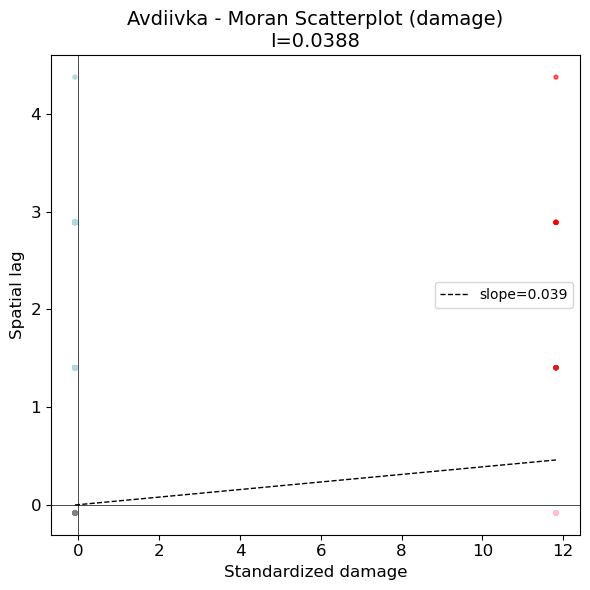

  Plot: cell13_spatial/Avdiivka_moran_scatterplot_20260421_235550.png

    RF residual Moran I: 0.0287 (p=0.0010)
    Spatial structure: 0.0388 -> 0.0287 (reduction)

    Semi-variograms:
      damage_binary                           : range=1611m, nugget_ratio=0.46 [Moderate]

  Borodyanka (5240 buildings)
    Moran's I (damage): I=0.1028, E[I]=-0.0002, p=0.0010, z=16.22
    Significant spatial clustering

    LISA significant: 138/5240
      HH: 19
      LL: 0
      LH: 119
      HL: 0


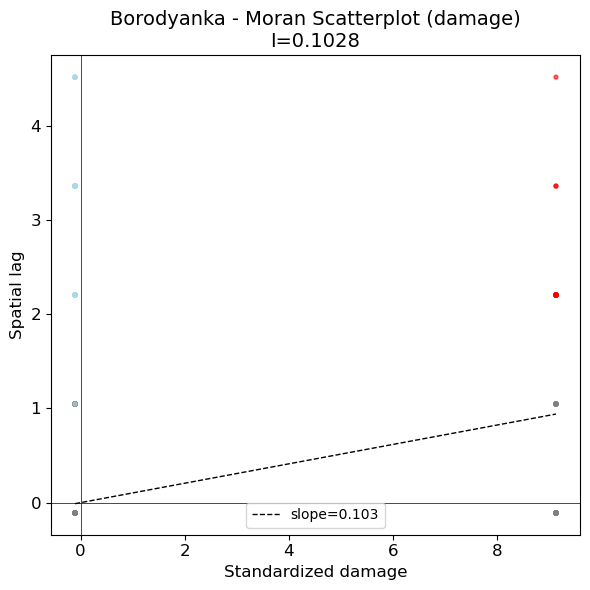

  Plot: cell13_spatial/Borodyanka_moran_scatterplot_20260421_235553.png

    RF residual Moran I: 0.0643 (p=0.0010)
    Spatial structure: 0.1028 -> 0.0643 (reduction)

    Semi-variograms:
      damage_binary                           : range=138m, nugget_ratio=0.54 [Moderate]

  Bucha (17215 buildings)
    Moran's I (damage): I=0.0422, E[I]=-0.0001, p=0.0010, z=11.36
    Significant spatial clustering

    LISA significant: 568/17215
      HH: 25
      LL: 0
      LH: 429
      HL: 114


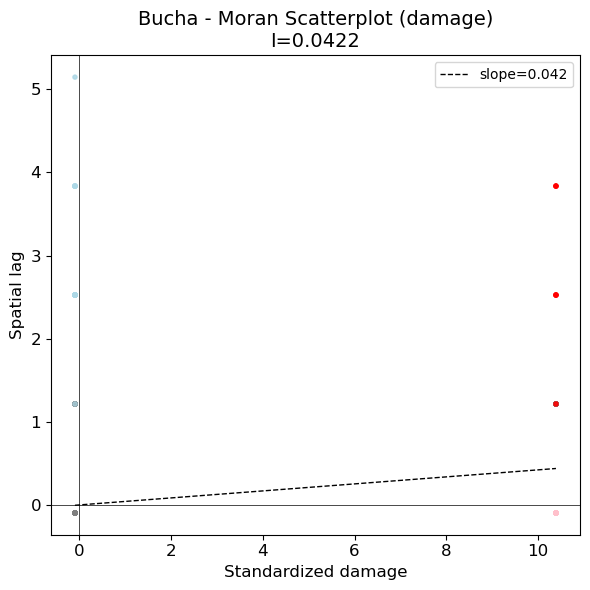

  Plot: cell13_spatial/Bucha_moran_scatterplot_20260421_235557.png

    RF residual Moran I: 0.0442 (p=0.0010)
    Spatial structure: 0.0422 -> 0.0442 (reduction)

    Semi-variograms:
      damage_binary                           : range=1167m, nugget_ratio=0.43 [Moderate]

  Chernihiv (51375 buildings)
    Moran's I (damage): I=0.0596, E[I]=-0.0000, p=0.0010, z=27.73
    Significant spatial clustering

    LISA significant: 14652/51375
      HH: 69
      LL: 13724
      LH: 640
      HL: 219


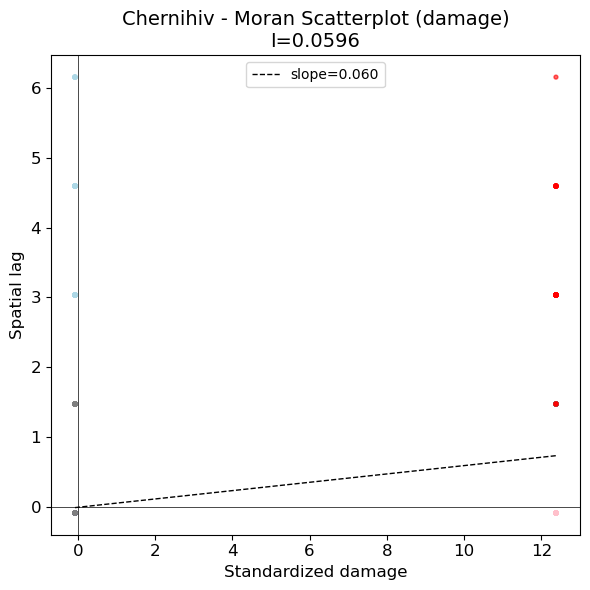

  Plot: cell13_spatial/Chernihiv_moran_scatterplot_20260421_235609.png

    RF residual Moran I: 0.0538 (p=0.0010)
    Spatial structure: 0.0596 -> 0.0538 (reduction)

    Semi-variograms:
      damage_binary                           : range=996349m, nugget_ratio=1.00 [Weak]

  Chornobaivka (9909 buildings)
    Moran's I (damage): I=-0.0004, E[I]=-0.0001, p=0.0330, z=-0.10
    Significant spatial clustering

    LISA significant: 9909/9909
      HH: 0
      LL: 9868
      LH: 35
      HL: 6


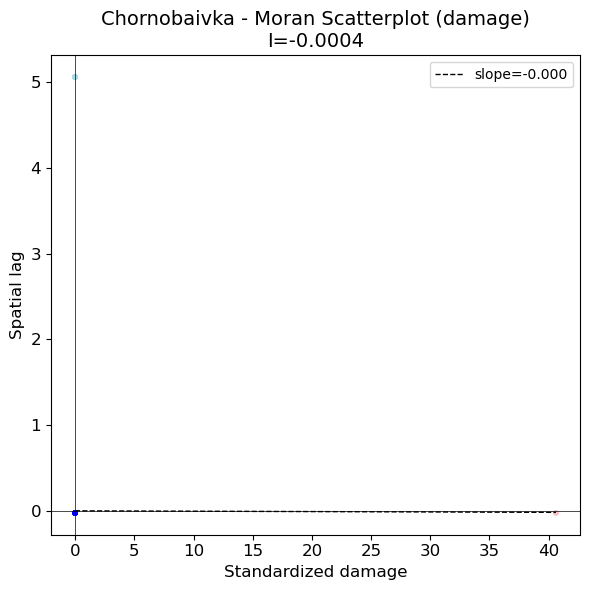

  Plot: cell13_spatial/Chornobaivka_moran_scatterplot_20260421_235617.png

    RF residual Moran I: 0.0022 (p=0.0240)
    Spatial structure: -0.0004 -> 0.0022 (reduction)

    Semi-variograms:
      damage_binary                           : range=571984m, nugget_ratio=0.01 [Strong]

  Dmytrivka (13649 buildings)
    Moran's I (damage): I=0.0346, E[I]=-0.0001, p=0.0010, z=8.56
    Significant spatial clustering

    LISA significant: 125/13649
      HH: 20
      LL: 0
      LH: 105
      HL: 0


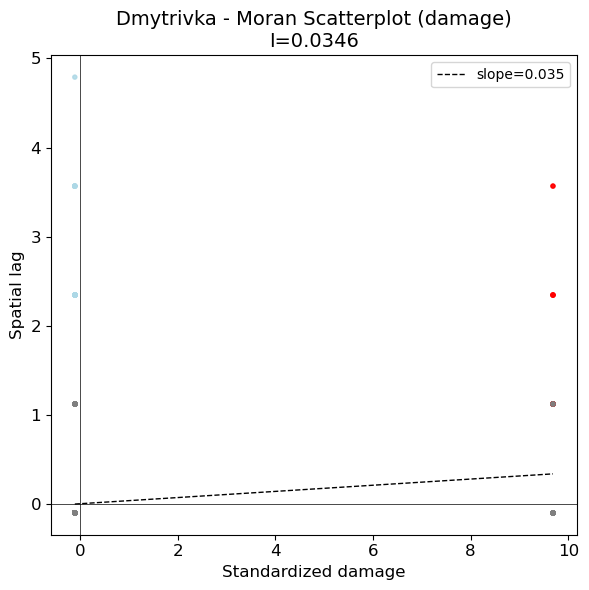

  Plot: cell13_spatial/Dmytrivka_moran_scatterplot_20260421_235620.png

    RF residual Moran I: 0.0334 (p=0.0010)
    Spatial structure: 0.0346 -> 0.0334 (reduction)

    Semi-variograms:
      damage_binary                           : range=1372m, nugget_ratio=0.78 [Weak]

  Hostomel (19145 buildings)
    Moran's I (damage): I=0.1110, E[I]=-0.0001, p=0.0010, z=32.42
    Significant spatial clustering

    LISA significant: 18735/19145
      HH: 262
      LL: 16236
      LH: 2035
      HL: 202


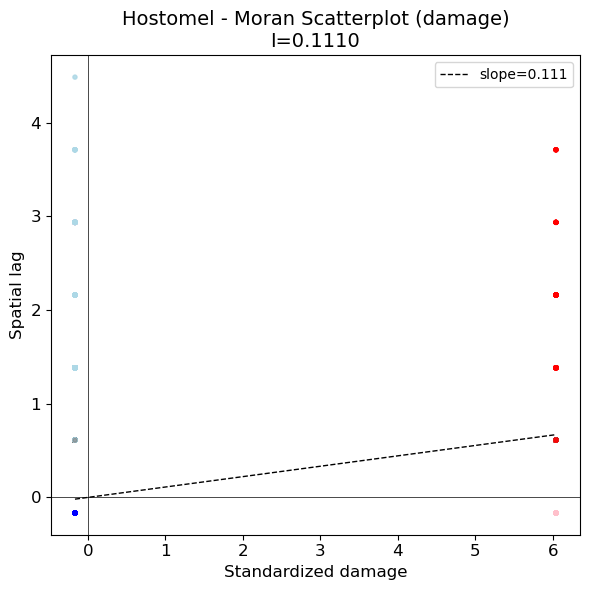

  Plot: cell13_spatial/Hostomel_moran_scatterplot_20260421_235625.png

    RF residual Moran I: 0.0912 (p=0.0010)
    Spatial structure: 0.1110 -> 0.0912 (reduction)

    Semi-variograms:
      damage_binary                           : range=296579m, nugget_ratio=0.02 [Strong]

  Irpin (17365 buildings)
    Moran's I (damage): I=0.0395, E[I]=-0.0001, p=0.0010, z=11.55
    Significant spatial clustering

    LISA significant: 1688/17365
      HH: 80
      LL: 0
      LH: 1439
      HL: 169


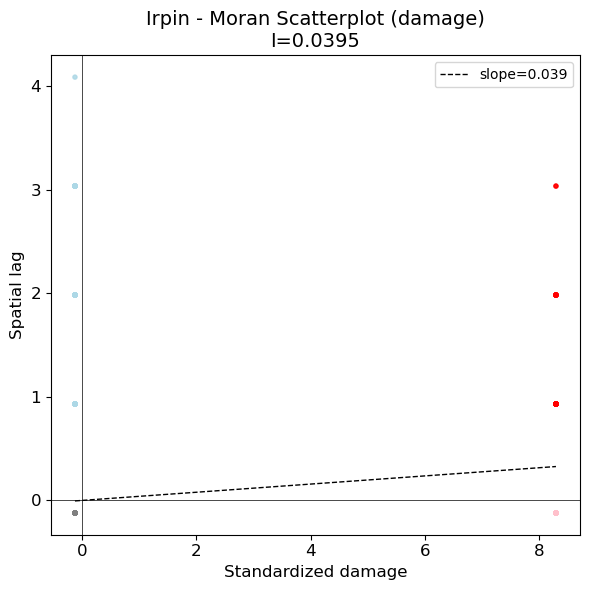

  Plot: cell13_spatial/Irpin_moran_scatterplot_20260421_235631.png

    RF residual Moran I: 0.0403 (p=0.0010)
    Spatial structure: 0.0395 -> 0.0403 (reduction)

    Semi-variograms:
      damage_binary                           : range=4078m, nugget_ratio=0.82 [Weak]

  Kharkiv (170104 buildings)
    Moran's I (damage): I=0.0818, E[I]=-0.0000, p=0.0010, z=70.91
    Significant spatial clustering

    LISA significant: 170104/170104
      HH: 101
      LL: 168557
      LH: 1309
      HL: 137


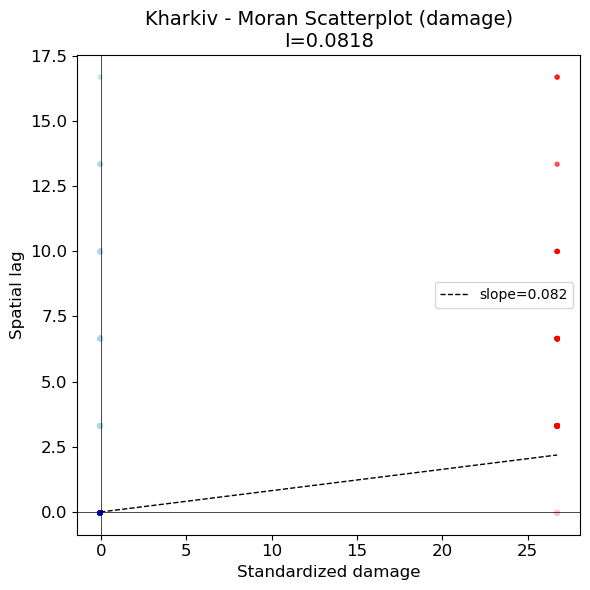

  Plot: cell13_spatial/Kharkiv_moran_scatterplot_20260421_235732.png

    RF residual Moran I: 0.0992 (p=0.0010)
    Spatial structure: 0.0818 -> 0.0992 (reduction)

    Semi-variograms:
      damage_binary                           : range=163840026m, nugget_ratio=0.48 [Moderate]

  Kherson (9909 buildings)
    Moran's I (damage): I=-0.0004, E[I]=-0.0001, p=0.0310, z=-0.08
    Significant spatial clustering

    LISA significant: 9909/9909
      HH: 0
      LL: 9868
      LH: 35
      HL: 6


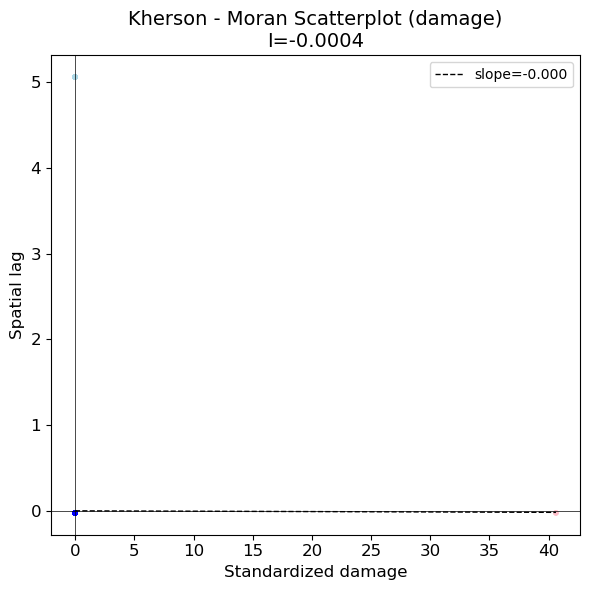

  Plot: cell13_spatial/Kherson_moran_scatterplot_20260421_235756.png

    RF residual Moran I: 0.0029 (p=0.0170)
    Spatial structure: -0.0004 -> 0.0029 (reduction)

    Semi-variograms:
      damage_binary                           : range=571984m, nugget_ratio=0.01 [Strong]

  Kramatorsk (10414 buildings)
    Moran's I (damage): I=0.1234, E[I]=-0.0001, p=0.0010, z=27.44
    Significant spatial clustering

    LISA significant: 10414/10414
      HH: 11
      LL: 10299
      LH: 96
      HL: 8


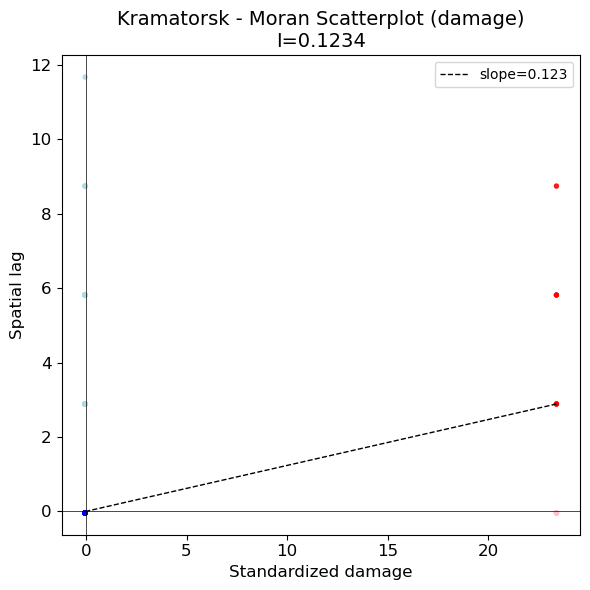

  Plot: cell13_spatial/Kramatorsk_moran_scatterplot_20260421_235800.png

    RF residual Moran I: 0.0988 (p=0.0010)
    Spatial structure: 0.1234 -> 0.0988 (reduction)

    Semi-variograms:
      damage_binary                           : range=2550928m, nugget_ratio=0.00 [Strong]

  Lysychansk (41600 buildings)
    Moran's I (damage): I=0.0634, E[I]=-0.0000, p=0.0010, z=27.30
    Significant spatial clustering

    LISA significant: 6704/41600
      HH: 408
      LL: 0
      LH: 5702
      HL: 594


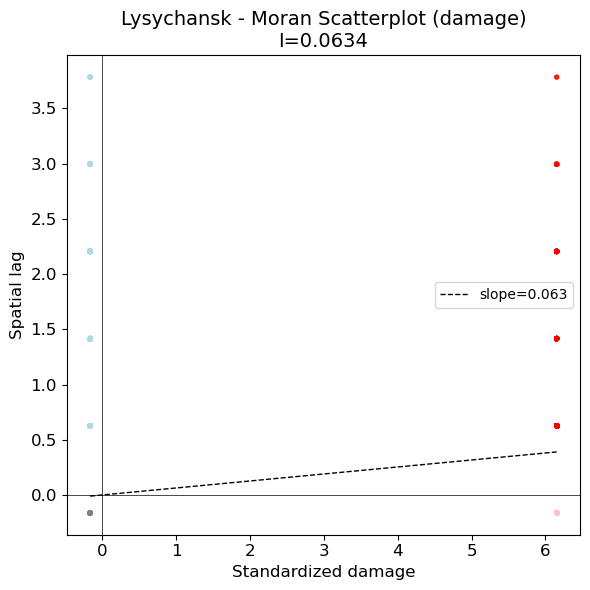

  Plot: cell13_spatial/Lysychansk_moran_scatterplot_20260421_235809.png

    RF residual Moran I: 0.0455 (p=0.0010)
    Spatial structure: 0.0634 -> 0.0455 (reduction)

    Semi-variograms:
      damage_binary                           : range=5890944m, nugget_ratio=0.00 [Strong]

  Makariv (5554 buildings)
    Moran's I (damage): I=0.0143, E[I]=-0.0002, p=0.0250, z=2.22
    Significant spatial clustering

    LISA significant: 424/5554
      HH: 7
      LL: 0
      LH: 372
      HL: 45


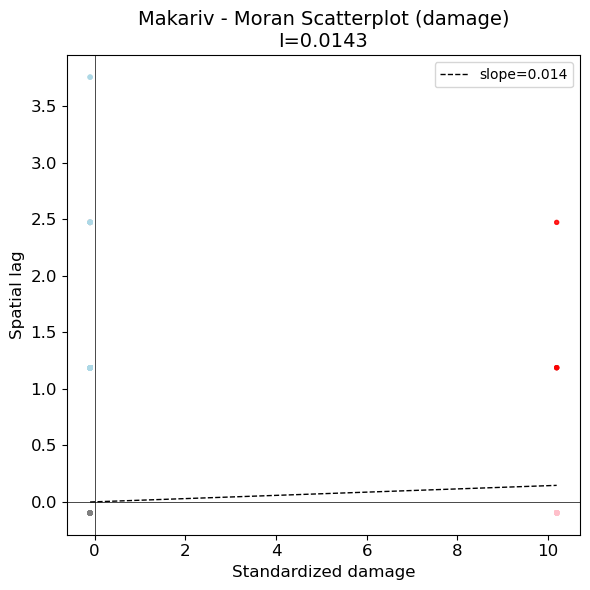

  Plot: cell13_spatial/Makariv_moran_scatterplot_20260421_235815.png

    RF residual Moran I: 0.0014 (p=0.3980)
    Spatial structure: 0.0143 -> 0.0014 (reduction)

    Semi-variograms:
      damage_binary                           : range=85m, nugget_ratio=0.57 [Moderate]

  Mariupol (28973 buildings)
    Moran's I (damage): I=0.1532, E[I]=-0.0000, p=0.0010, z=53.55
    Significant spatial clustering

    LISA significant: 21622/28973
      HH: 897
      LL: 16010
      LH: 3994
      HL: 721


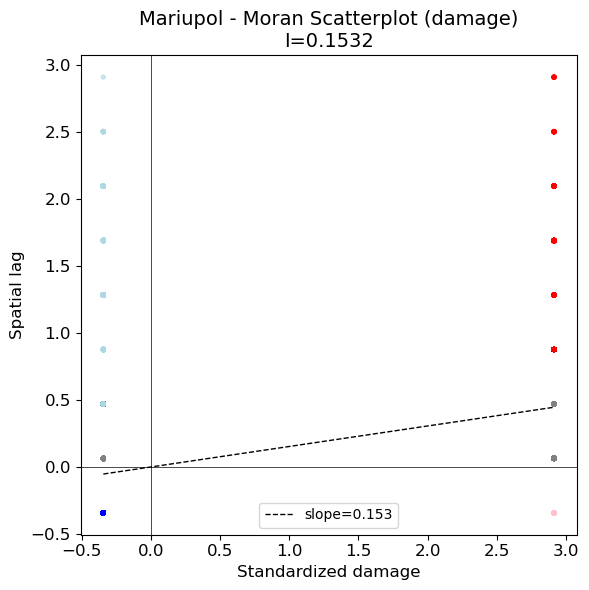

  Plot: cell13_spatial/Mariupol_moran_scatterplot_20260421_235820.png

    RF residual Moran I: 0.1404 (p=0.0010)
    Spatial structure: 0.1532 -> 0.1404 (reduction)

    Semi-variograms:
      damage_binary                           : range=3775m, nugget_ratio=0.72 [Moderate]

  Moschun (1248 buildings)
    Moran's I (damage): I=0.0521, E[I]=-0.0008, p=0.0020, z=3.92
    Significant spatial clustering

    LISA significant: 905/1248
      HH: 9
      LL: 794
      LH: 67
      HL: 35


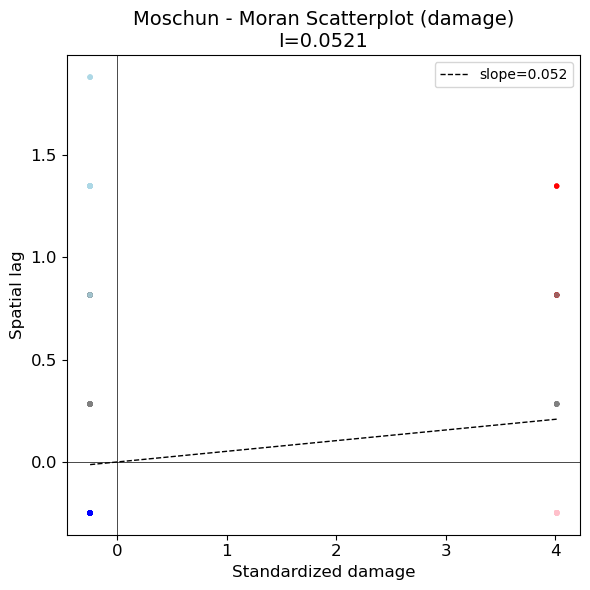

  Plot: cell13_spatial/Moschun_moran_scatterplot_20260421_235825.png

    Semi-variograms:
      damage_binary                           : range=30m, nugget_ratio=0.53 [Moderate]

  Mykolaiv (113042 buildings)
    Moran's I (damage): I=0.0440, E[I]=-0.0000, p=0.0010, z=32.33
    Significant spatial clustering

    LISA significant: 113042/113042
      HH: 25
      LL: 112432
      LH: 526
      HL: 59


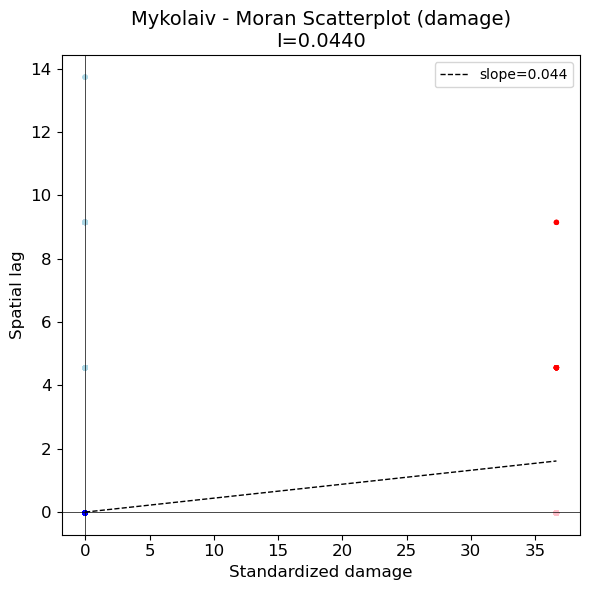

  Plot: cell13_spatial/Mykolaiv_moran_scatterplot_20260421_235857.png

    Semi-variograms:
      damage_binary                           : range=163840026m, nugget_ratio=0.48 [Moderate]

  Okhtyrka (26456 buildings)
    Moran's I (damage): I=0.0310, E[I]=-0.0000, p=0.0010, z=10.77
    Significant spatial clustering

    LISA significant: 26456/26456
      HH: 7
      LL: 26206
      LH: 215
      HL: 28


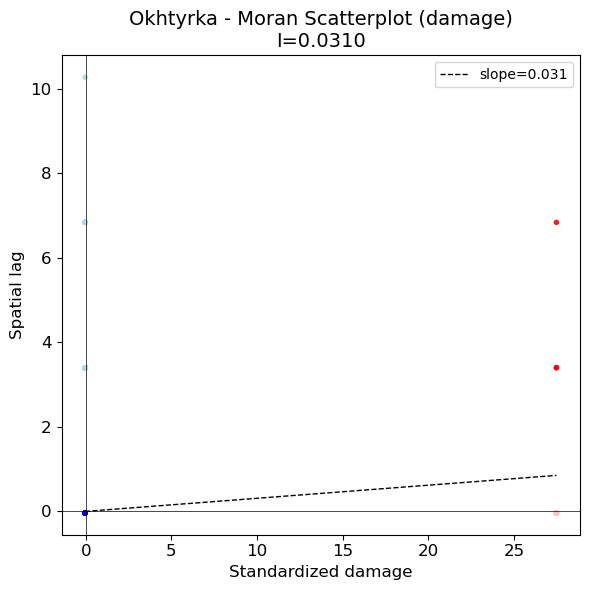

  Plot: cell13_spatial/Okhtyrka_moran_scatterplot_20260421_235905.png

    RF residual Moran I: 0.0280 (p=0.0010)
    Spatial structure: 0.0310 -> 0.0280 (reduction)

    Semi-variograms:
      damage_binary                           : range=19m, nugget_ratio=1.00 [Weak]

  Rubizhne (13609 buildings)
    Moran's I (damage): I=0.0361, E[I]=-0.0001, p=0.0010, z=8.78
    Significant spatial clustering

    LISA significant: 13609/13609
      HH: 172
      LL: 10693
      LH: 2485
      HL: 259


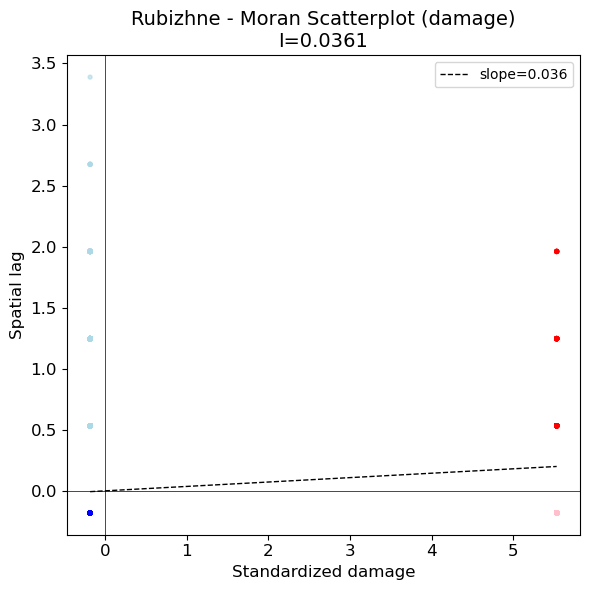

  Plot: cell13_spatial/Rubizhne_moran_scatterplot_20260421_235910.png

    RF residual Moran I: 0.0327 (p=0.0010)
    Spatial structure: 0.0361 -> 0.0327 (reduction)

    Semi-variograms:
      damage_binary                           : range=842m, nugget_ratio=0.75 [Moderate]

  Sievierodonetsk (9065 buildings)
    Moran's I (damage): I=0.0636, E[I]=-0.0001, p=0.0010, z=13.45
    Significant spatial clustering

    LISA significant: 6885/9065
      HH: 103
      LL: 6032
      LH: 750
      HL: 0


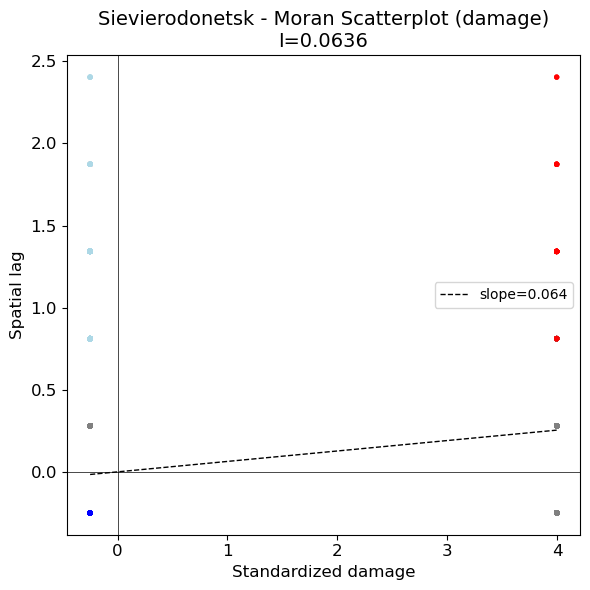

  Plot: cell13_spatial/Sievierodonetsk_moran_scatterplot_20260421_235914.png

    RF residual Moran I: 0.0567 (p=0.0010)
    Spatial structure: 0.0636 -> 0.0567 (reduction)

    Semi-variograms:
      damage_binary                           : range=1055m, nugget_ratio=0.66 [Moderate]

  Trostianets (8737 buildings)
    Moran's I (damage): I=0.0260, E[I]=-0.0001, p=0.0040, z=5.26
    Significant spatial clustering

    LISA significant: 8737/8737
      HH: 4
      LL: 8606
      LH: 113
      HL: 14


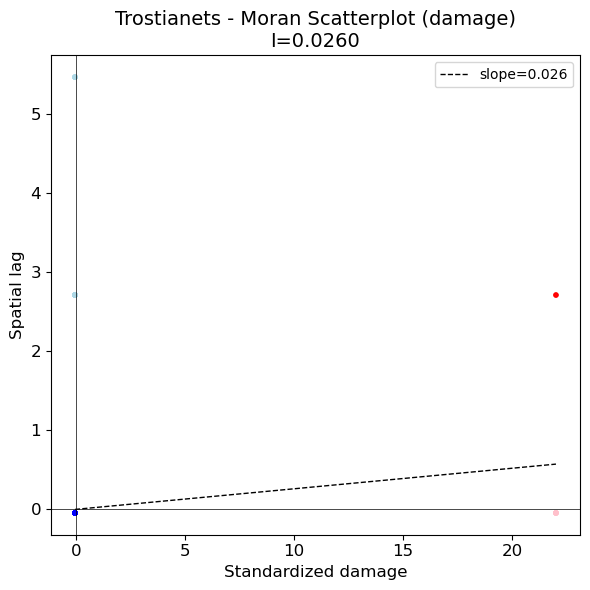

  Plot: cell13_spatial/Trostianets_moran_scatterplot_20260421_235917.png

    Semi-variograms:
      damage_binary                           : range=343m, nugget_ratio=0.26 [Moderate]

  Volnovakha (13463 buildings)
    Moran's I (damage): I=0.1368, E[I]=-0.0001, p=0.0010, z=34.72
    Significant spatial clustering

    LISA significant: 675/13463
      HH: 77
      LL: 0
      LH: 527
      HL: 71


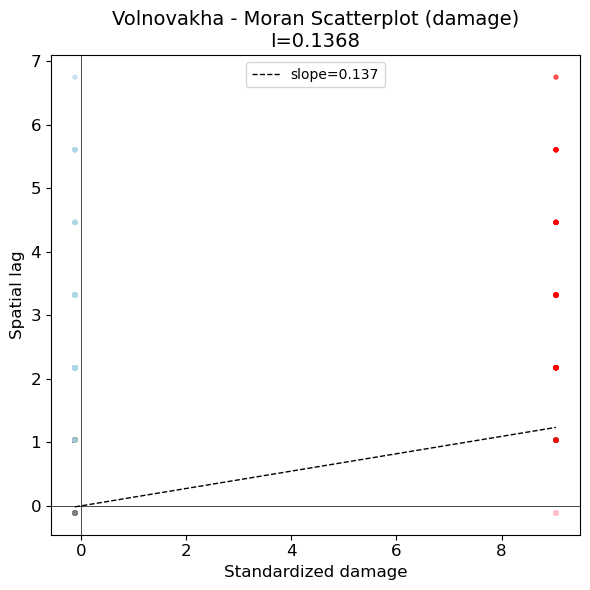

  Plot: cell13_spatial/Volnovakha_moran_scatterplot_20260421_235919.png

    RF residual Moran I: 0.1306 (p=0.0010)
    Spatial structure: 0.1368 -> 0.1306 (reduction)

    Semi-variograms:
      damage_binary                           : range=81m, nugget_ratio=0.61 [Moderate]
  Saved: cell13_spatial/spatial_stats_20260421_235921.csv (5.3 KB)


In [15]:
# @title CELL 13: SPATIAL STATISTICS
USE_BALANCED = False  # Moran I needs real spatial pattern
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

print("=" * 70)
print("CELL 13: SPATIAL STATISTICS")
print("=" * 70)

try:
    import libpysal
    import esda
except ImportError:
    import subprocess
    subprocess.check_call(['pip', 'install', '--break-system-packages', '-q', 'libpysal', 'esda'])
    import libpysal
    import esda

try:
    import gstools as gs
except ImportError:
    import subprocess
    subprocess.check_call(['pip', 'install', '--break-system-packages', '-q', 'gstools'])
    import gstools as gs

from libpysal.weights import KNN
from esda.moran import Moran, Moran_Local

spatial_rows = []

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < 30 or TARGET_COL not in city_df.columns or city_df[TARGET_COL].nunique() < 2:
        continue

    print(f"\n  {CITY} ({len(city_df)} buildings)")

    # need spatial coordinates
    x_col = 'centroid_x' if 'centroid_x' in city_df.columns else 'lon'
    y_col = 'centroid_y' if 'centroid_y' in city_df.columns else 'lat'
    if x_col not in city_df.columns or y_col not in city_df.columns:
        print(f"    No spatial coordinates, skipping")
        continue

    valid_spatial = city_df[[x_col, y_col, TARGET_COL]].dropna()
    if len(valid_spatial) < 30:
        continue
    coords = valid_spatial[[x_col, y_col]].values

    # Global Moran's I on damage
    try:
        w = KNN.from_array(coords, k=8)
        w.transform = 'R'
        y = valid_spatial[TARGET_COL].values.astype(float)
        mi = Moran(y, w)
        print(f"    Moran's I (damage): I={mi.I:.4f}, E[I]={mi.EI:.4f}, p={mi.p_sim:.4f}, z={mi.z_sim:.2f}")
        print(f"    {'Significant spatial clustering' if mi.p_sim < 0.05 else 'No significant spatial autocorrelation'}")
        spatial_rows.append({'city': CITY, 'variable': 'damaged',
                             'morans_I': mi.I, 'expected_I': mi.EI,
                             'p_value': mi.p_sim, 'z_score': mi.z_sim,
                             'significant': mi.p_sim < 0.05})
    except Exception as e:
        print(f"    Moran's I failed: {e}")
        mi = None

    # Moran's I on key features (auto-detect deltas and change detection)
    _coh = (cat.get_features_by_group('coh', PP_CAT) if cat else [])
    _card = (cat.get_features_by_group('card', PP_CAT) if cat else [])
    key_feats = [c for c in _coh + _card
                 if c in city_df.columns
                 and 'mean' in c and 'count' not in c
                 and city_df[c].notna().sum() > 30][:5]
    for feat in key_feats:
        valid = city_df[[feat, x_col, y_col]].dropna()
        if len(valid) < 30:
            continue
        try:
            w_f = KNN.from_array(valid[[x_col, y_col]].values, k=8)
            w_f.transform = 'R'
            mi_f = Moran(valid[feat].values, w_f)
            print(f"    Moran's I ({feat[:40]}): I={mi_f.I:.4f}, p={mi_f.p_sim:.4f}")
            spatial_rows.append({'city': CITY, 'variable': feat,
                                 'morans_I': mi_f.I, 'expected_I': mi_f.EI,
                                 'p_value': mi_f.p_sim, 'z_score': mi_f.z_sim,
                                 'significant': mi_f.p_sim < 0.05})
        except Exception:
            pass

    # LISA
    try:
        lisa = Moran_Local(y, w, permutations=999)
        sig_mask = lisa.p_sim < 0.05
        q_labels = {1: 'HH', 2: 'LH', 3: 'LL', 4: 'HL'}
        lisa_clusters = {}
        for q_val, label in q_labels.items():
            lisa_clusters[label] = int(np.sum((lisa.q == q_val) & sig_mask))
        lisa_clusters['not_significant'] = int(np.sum(~sig_mask))
        print(f"\n    LISA significant: {int(sig_mask.sum())}/{len(y)}")
        for label in ['HH', 'LL', 'LH', 'HL']:
            print(f"      {label}: {lisa_clusters[label]}")

        spatial_rows.append({'city': CITY, 'variable': 'damaged_LISA',
                             'morans_I': float(np.mean(lisa.Is)), 'expected_I': np.nan,
                             'p_value': np.nan, 'z_score': np.nan, 'significant': True,
                             'lisa_HH': lisa_clusters['HH'], 'lisa_LL': lisa_clusters['LL'],
                             'lisa_LH': lisa_clusters['LH'], 'lisa_HL': lisa_clusters['HL']})

        # Moran scatterplot
        y_std = (y - y.mean()) / y.std() if y.std() > 0 else y
        lag = np.array(w.sparse.dot(y_std))
        colors = ['grey'] * len(y_std)
        for idx_pt in range(len(y_std)):
            if sig_mask[idx_pt]:
                q = lisa.q[idx_pt]
                if q == 1: colors[idx_pt] = 'red'
                elif q == 3: colors[idx_pt] = 'blue'
                elif q == 2: colors[idx_pt] = 'lightblue'
                elif q == 4: colors[idx_pt] = 'pink'
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
        ax.scatter(y_std, lag, c=colors, s=8, alpha=0.6)
        ax.axhline(0, color='black', linewidth=0.5)
        ax.axvline(0, color='black', linewidth=0.5)
        slope = np.polyfit(y_std, lag, 1)[0]
        x_line = np.linspace(y_std.min(), y_std.max(), 100)
        ax.plot(x_line, slope * x_line, 'k--', linewidth=1, label=f"slope={slope:.3f}")
        ax.set_xlabel('Standardized damage')
        ax.set_ylabel('Spatial lag')
        i_val = mi.I if mi is not None else 0
        ax.set_title(f'{CITY} - Moran Scatterplot (damage)\nI={i_val:.4f}')
        ax.legend()
        plt.tight_layout()
        save_fig(fig, f'{CITY}_moran_scatterplot', 'cell13_spatial')
    except Exception as e:
        print(f"    LISA failed: {e}")

    # RF residual spatial analysis
    try:
        from sklearn.ensemble import RandomForestClassifier

        feat_cols = [c for c in city_df.columns if c in FEATURE_COLS
                     and city_df[c].notna().sum() > len(city_df) * 0.5]
        valid_rf = city_df[[TARGET_COL] + feat_cols + [x_col, y_col]].dropna()

        if len(valid_rf) >= 50 and len(feat_cols) >= 3:
            X_rf = valid_rf[feat_cols].values
            y_rf = valid_rf[TARGET_COL].values
            rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42, n_jobs=-1)
            rf.fit(X_rf, y_rf)
            y_prob = rf.predict_proba(X_rf)[:, 1]
            residuals = y_rf - y_prob
            w_rf = KNN.from_array(valid_rf[[x_col, y_col]].values, k=8)
            w_rf.transform = 'R'
            mi_resid = Moran(residuals, w_rf)
            print(f"\n    RF residual Moran I: {mi_resid.I:.4f} (p={mi_resid.p_sim:.4f})")
            if mi is not None:
                print(f"    Spatial structure: {mi.I:.4f} -> {mi_resid.I:.4f} (reduction)")
            spatial_rows.append({'city': CITY, 'variable': 'rf_residuals',
                                 'morans_I': mi_resid.I, 'expected_I': mi_resid.EI,
                                 'p_value': mi_resid.p_sim, 'z_score': mi_resid.z_sim,
                                 'significant': mi_resid.p_sim < 0.05})
    except Exception as e:
        print(f"    RF residual analysis failed: {e}")

    # Semi-variogram
    print(f"\n    Semi-variograms:")
    vario_feats = [TARGET_COL] + key_feats[:3]
    for feat in vario_feats:
        if feat not in city_df.columns:
            continue
        valid = city_df[[x_col, y_col, feat]].dropna()
        if len(valid) < 50:
            continue
        if len(valid) > 2000:
            valid = valid.sample(n=2000, random_state=42)
        try:
            if x_col == 'centroid_x':
                x_m = valid[x_col].values - valid[x_col].mean()
                y_m = valid[y_col].values - valid[y_col].mean()
            else:
                x_m = (valid[x_col].values - valid[x_col].mean()) * 111320 * np.cos(np.radians(valid[y_col].mean()))
                y_m = (valid[y_col].values - valid[y_col].mean()) * 111320
            values = valid[feat].values
            bin_center, gamma = gs.vario_estimate((x_m, y_m), values, bin_edges=np.linspace(0, 5000, 30))
            try:
                model = gs.Spherical(dim=2)
                model.fit_variogram(bin_center, gamma, nugget=True)
                sill = model.var + model.nugget
                nugget_ratio = model.nugget / sill if sill > 0 else np.nan
                strength = 'Strong' if nugget_ratio < 0.25 else 'Moderate' if nugget_ratio < 0.75 else 'Weak'
                print(f"      {feat[:40]:40s}: range={model.len_scale:.0f}m, nugget_ratio={nugget_ratio:.2f} [{strength}]")
            except Exception:
                print(f"      {feat[:40]:40s}: empirical variogram computed, model fit failed")
        except Exception as e:
            print(f"      {feat[:40]:40s}: failed ({e})")

spatial_df = pd.DataFrame(spatial_rows)
if len(spatial_df) > 0:
    save_result(spatial_df, 'spatial_stats', 'cell13_spatial')
    


# CELL 14: KDE DAMAGE HOTSPOT + POINT PATTERN ANALYSIS

KDE: Gaussian kernel density of damage spatial intensity (Scott bandwidth).
NNA: Clark & Evans (1954) nearest neighbor ratio R. R < 1 = clustered.
Ripley's K / L-function: second-order spatial analysis.
Note: no edge correction applied to Ripley's K — L(r) slightly biased at large r.

CELL 14: KDE DAMAGE HOTSPOT + POINT PATTERN ANALYSIS

  Avdiivka (89 damaged buildings)


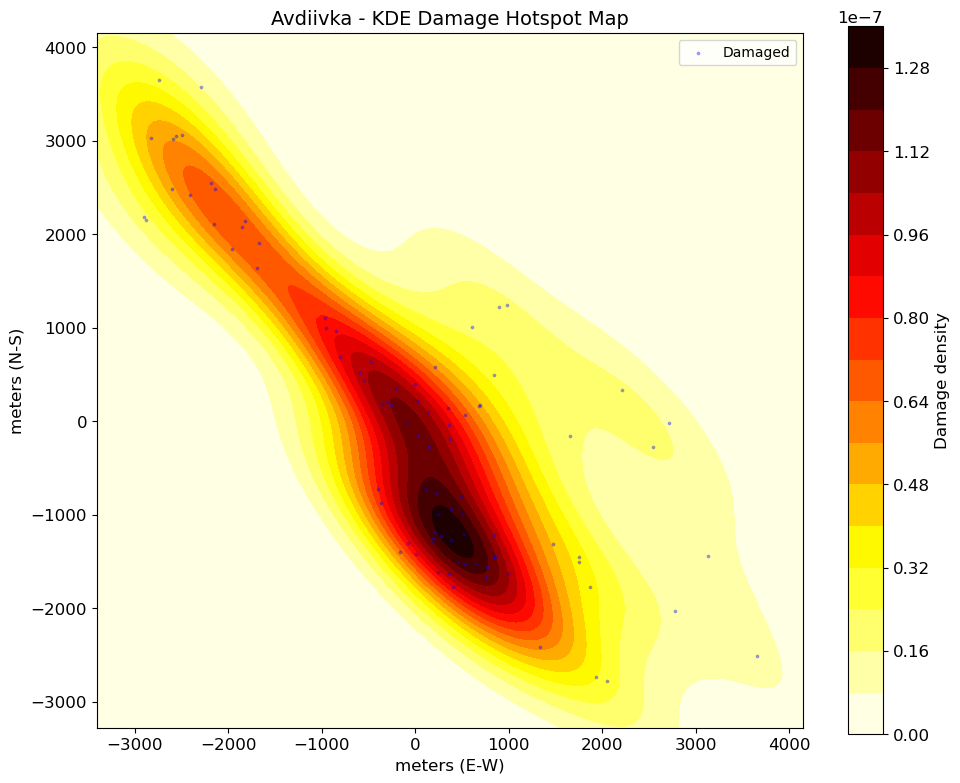

  Plot: cell14_kde/Avdiivka_kde_damage_hotspot_20260421_235922.png
    KDE saved
    NNA: R=0.543, z=-8.25, pattern=clustered
      observed NN dist: 186.8m, expected CSR: 344.1m


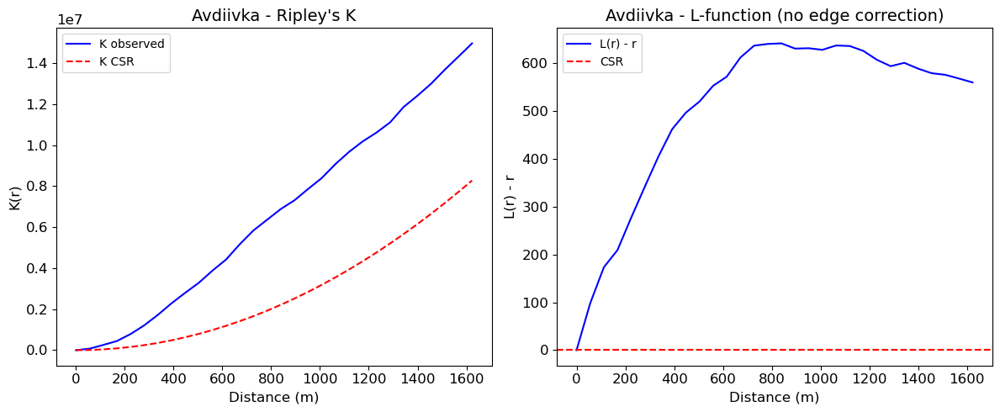

  Plot: cell14_kde/Avdiivka_ripley_k_20260421_235922.png
    Ripley K: max L(r)-r = 641.0m -> clustered

  Borodyanka (62 damaged buildings)


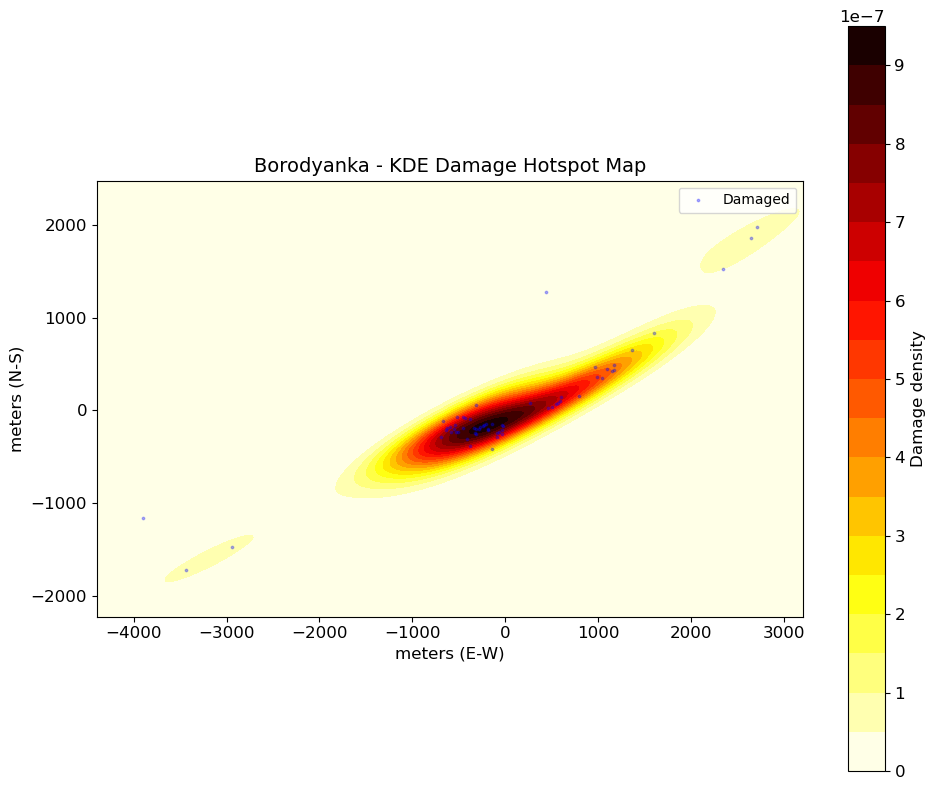

  Plot: cell14_kde/Borodyanka_kde_damage_hotspot_20260421_235923.png
    KDE saved
    NNA: R=0.343, z=-9.90, pattern=clustered
      observed NN dist: 107.7m, expected CSR: 314.0m


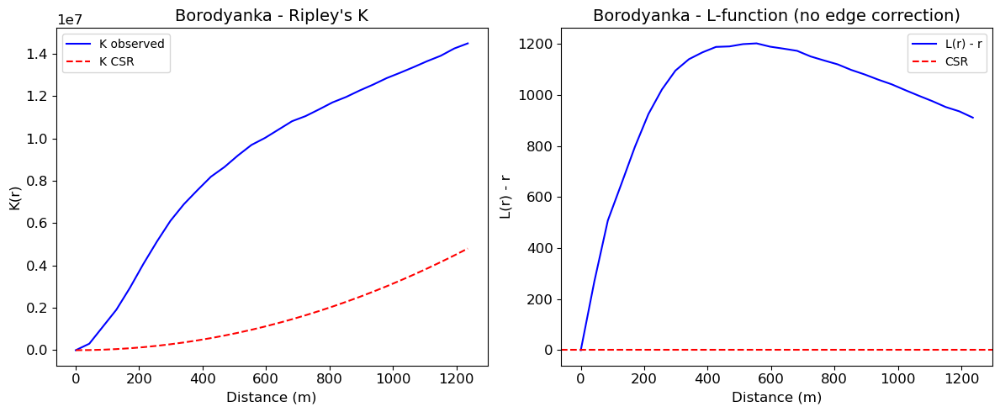

  Plot: cell14_kde/Borodyanka_ripley_k_20260421_235923.png
    Ripley K: max L(r)-r = 1202.5m -> clustered

  Bucha (158 damaged buildings)


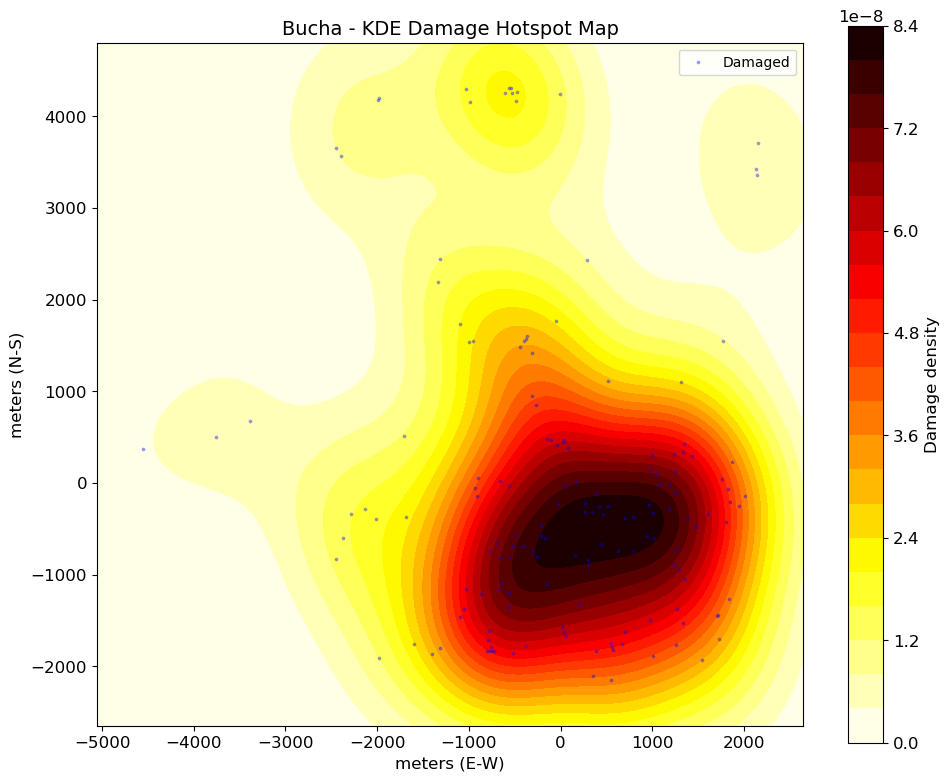

  Plot: cell14_kde/Bucha_kde_damage_hotspot_20260421_235923.png
    KDE saved
    NNA: R=0.581, z=-10.08, pattern=clustered
      observed NN dist: 152.0m, expected CSR: 261.6m


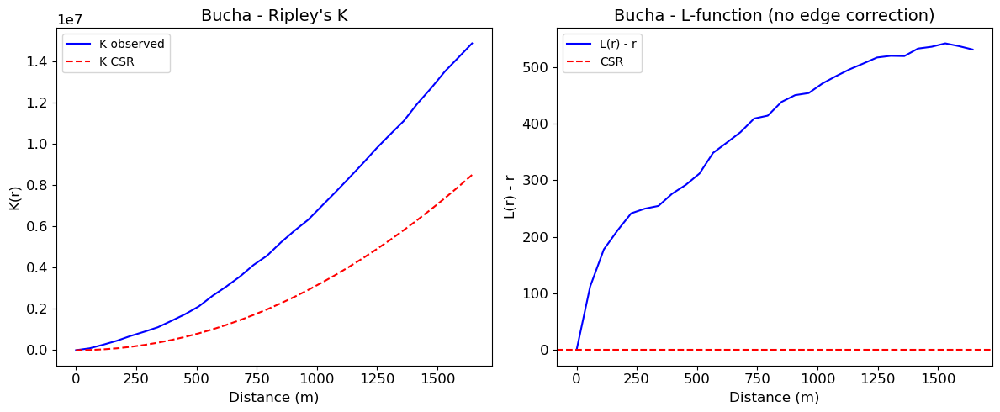

  Plot: cell14_kde/Bucha_ripley_k_20260421_235924.png
    Ripley K: max L(r)-r = 542.0m -> clustered

  Chernihiv (333 damaged buildings)


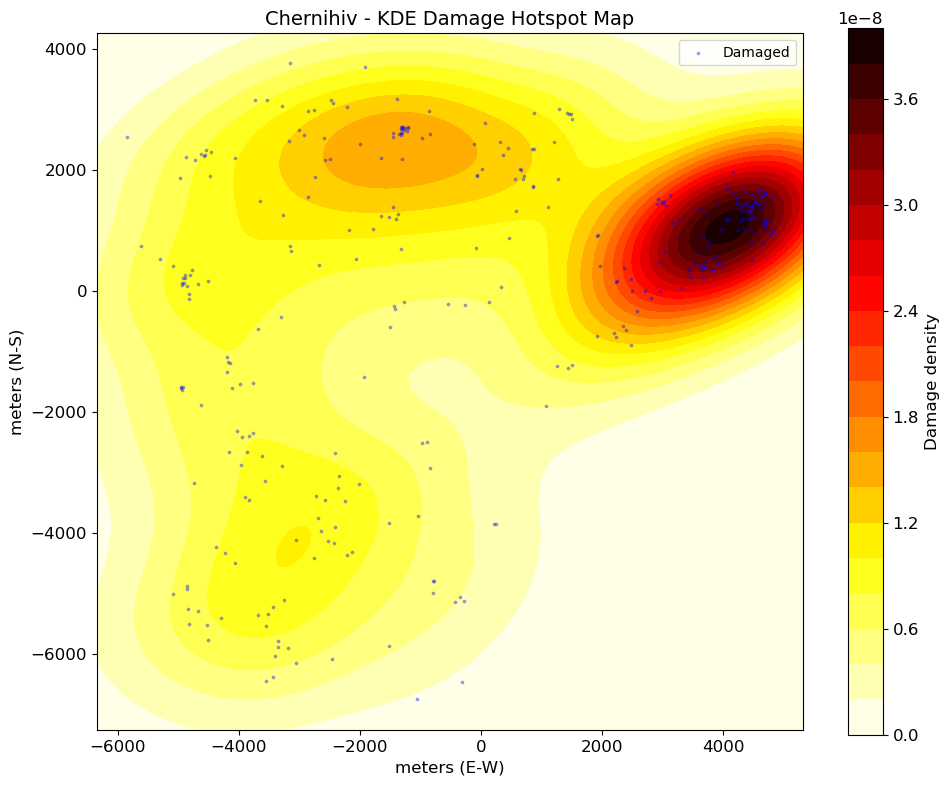

  Plot: cell14_kde/Chernihiv_kde_damage_hotspot_20260421_235925.png
    KDE saved
    NNA: R=0.542, z=-16.00, pattern=clustered
      observed NN dist: 157.2m, expected CSR: 290.3m


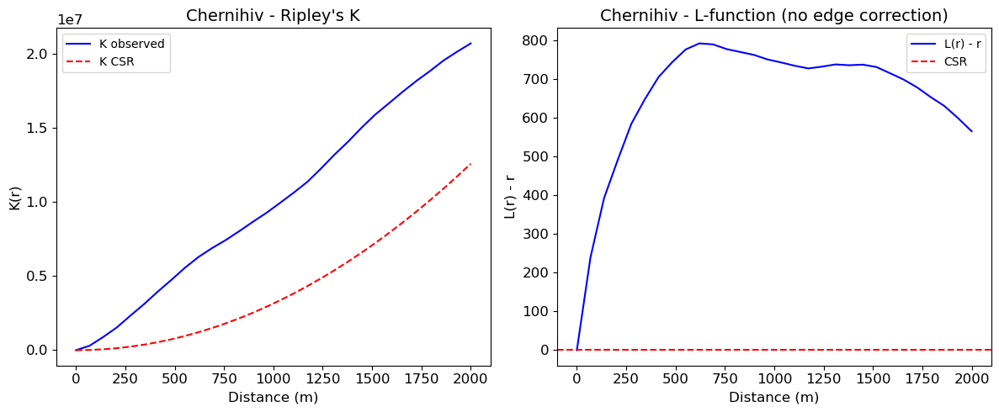

  Plot: cell14_kde/Chernihiv_ripley_k_20260421_235925.png
    Ripley K: max L(r)-r = 793.0m -> clustered

  Dmytrivka (144 damaged buildings)


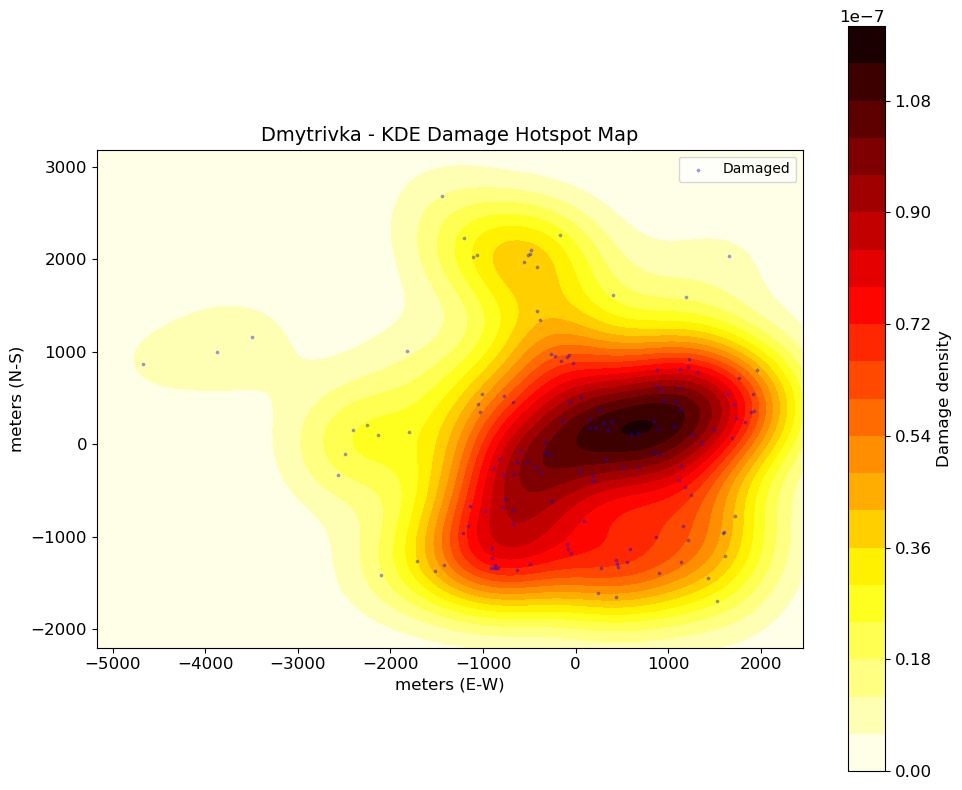

  Plot: cell14_kde/Dmytrivka_kde_damage_hotspot_20260421_235926.png
    KDE saved
    NNA: R=0.684, z=-7.25, pattern=clustered
      observed NN dist: 153.6m, expected CSR: 224.5m


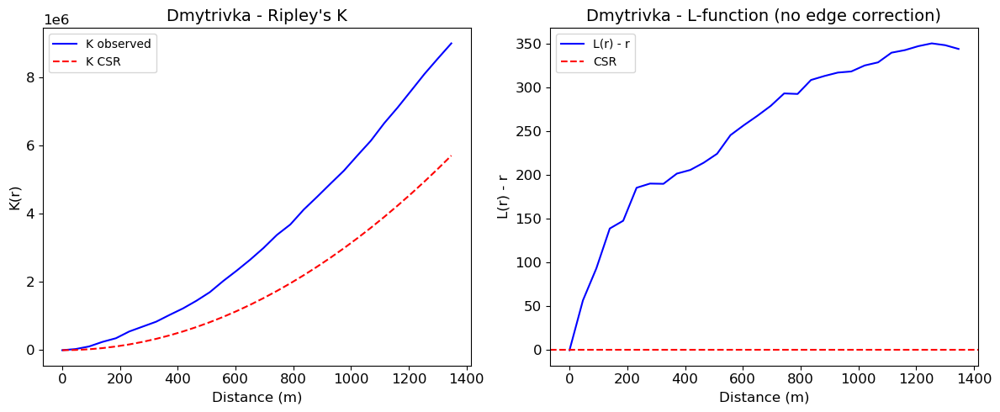

  Plot: cell14_kde/Dmytrivka_ripley_k_20260421_235926.png
    Ripley K: max L(r)-r = 350.8m -> clustered

  Hostomel (511 damaged buildings)


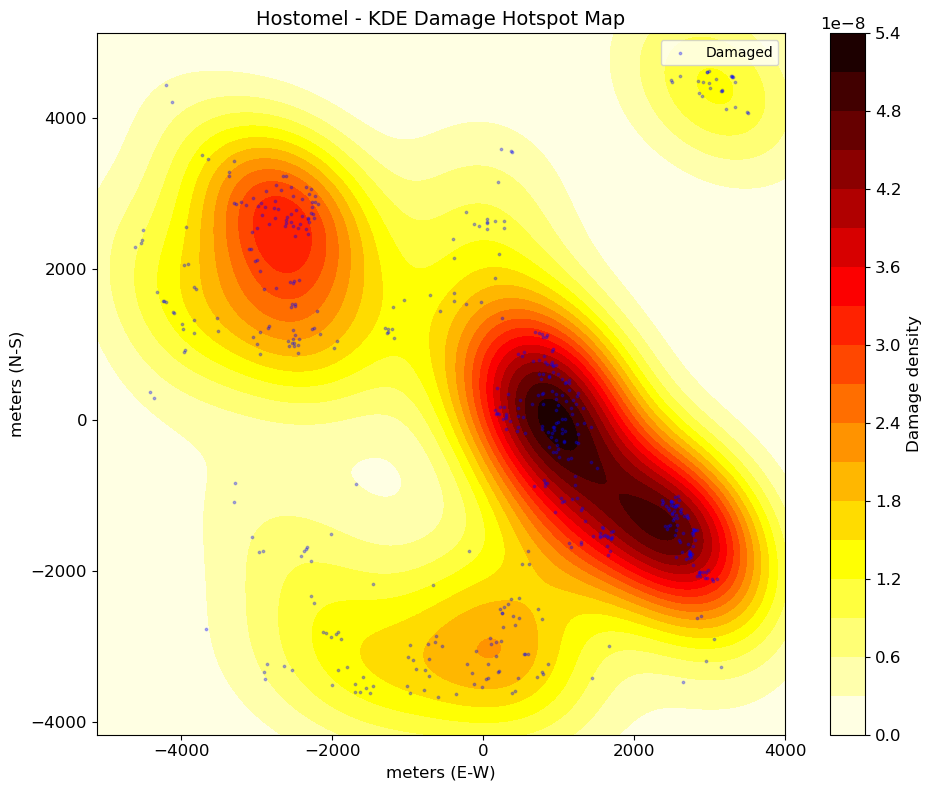

  Plot: cell14_kde/Hostomel_kde_damage_hotspot_20260421_235927.png
    KDE saved
    NNA: R=0.441, z=-24.16, pattern=clustered
      observed NN dist: 80.0m, expected CSR: 181.4m


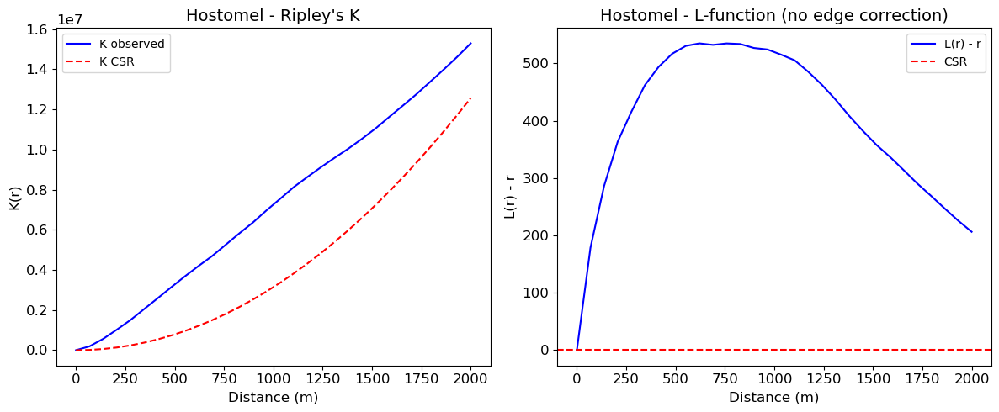

  Plot: cell14_kde/Hostomel_ripley_k_20260421_235927.png
    Ripley K: max L(r)-r = 534.8m -> clustered

  Irpin (249 damaged buildings)


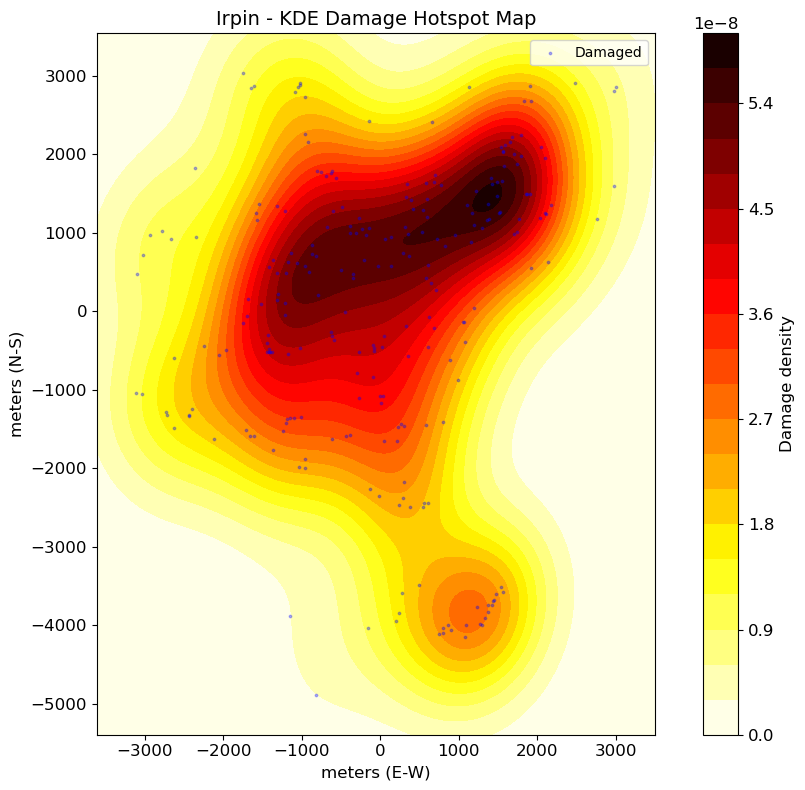

  Plot: cell14_kde/Irpin_kde_damage_hotspot_20260421_235928.png
    KDE saved
    NNA: R=0.604, z=-11.94, pattern=clustered
      observed NN dist: 133.3m, expected CSR: 220.6m


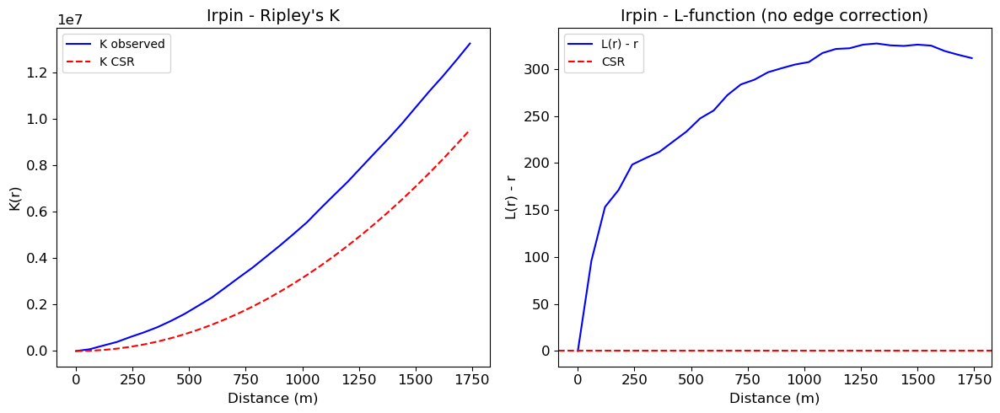

  Plot: cell14_kde/Irpin_ripley_k_20260421_235929.png
    Ripley K: max L(r)-r = 327.0m -> clustered

  Kharkiv (238 damaged buildings)


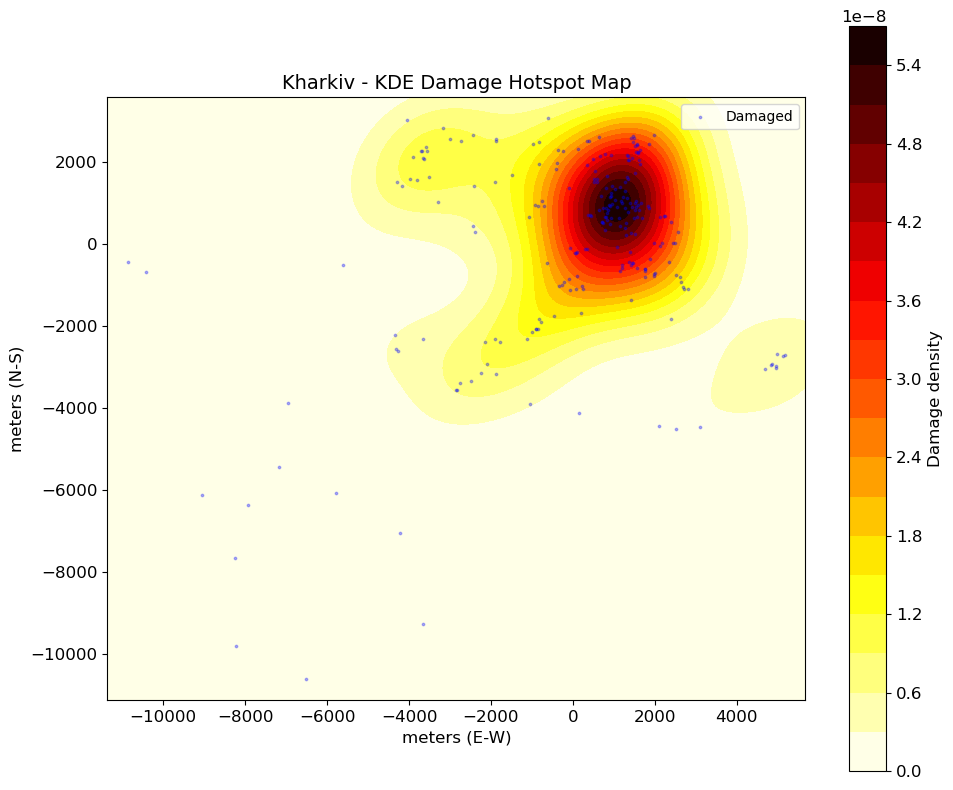

  Plot: cell14_kde/Kharkiv_kde_damage_hotspot_20260421_235930.png
    KDE saved
    NNA: R=0.467, z=-15.73, pattern=clustered
      observed NN dist: 224.5m, expected CSR: 480.6m


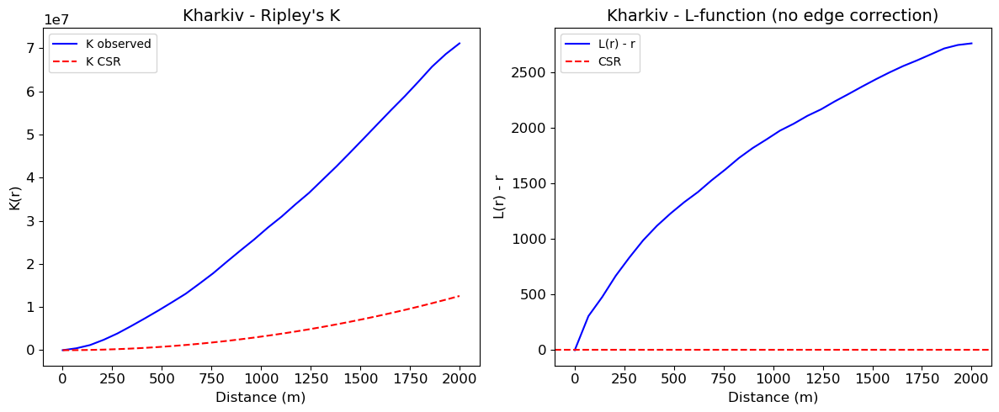

  Plot: cell14_kde/Kharkiv_ripley_k_20260421_235931.png
    Ripley K: max L(r)-r = 2758.9m -> clustered

  Kramatorsk (19 damaged buildings)


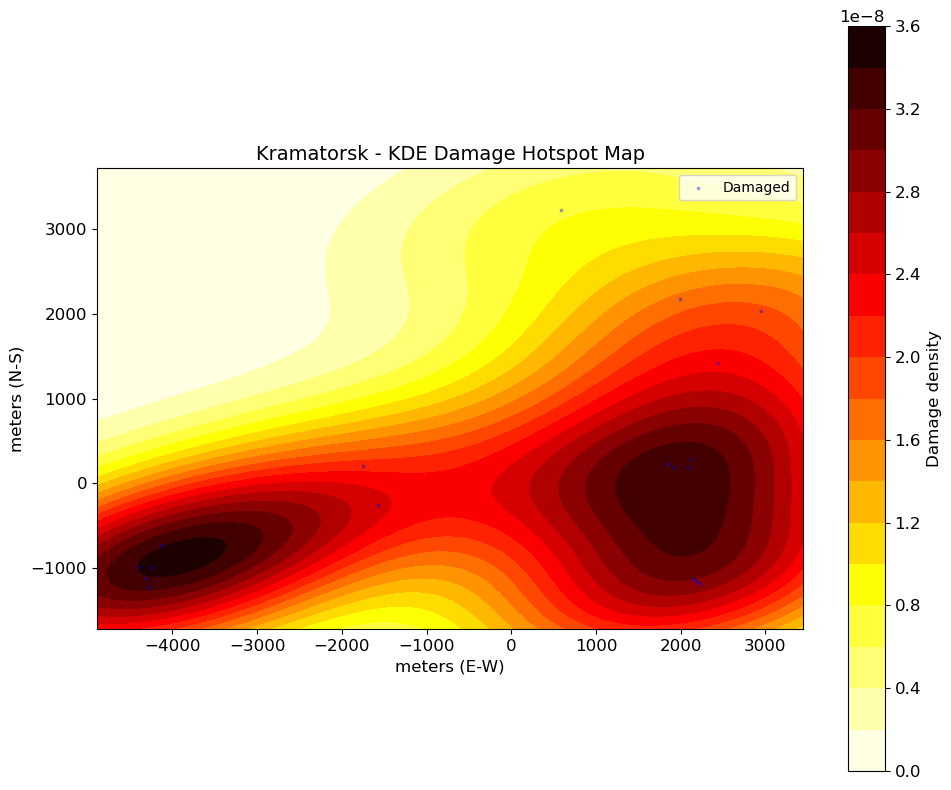

  Plot: cell14_kde/Kramatorsk_kde_damage_hotspot_20260421_235931.png
    KDE saved
    NNA: R=0.524, z=-3.97, pattern=clustered
      observed NN dist: 343.3m, expected CSR: 655.1m


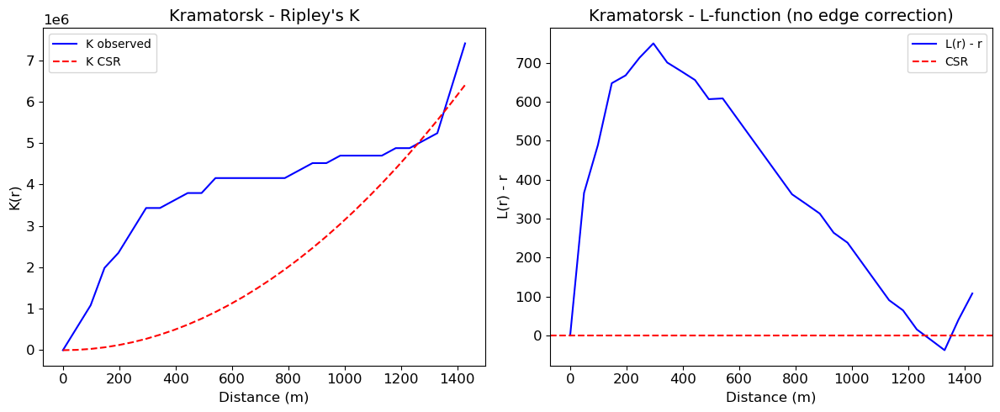

  Plot: cell14_kde/Kramatorsk_ripley_k_20260421_235932.png
    Ripley K: max L(r)-r = 750.0m -> clustered

  Lysychansk (1071 damaged buildings)


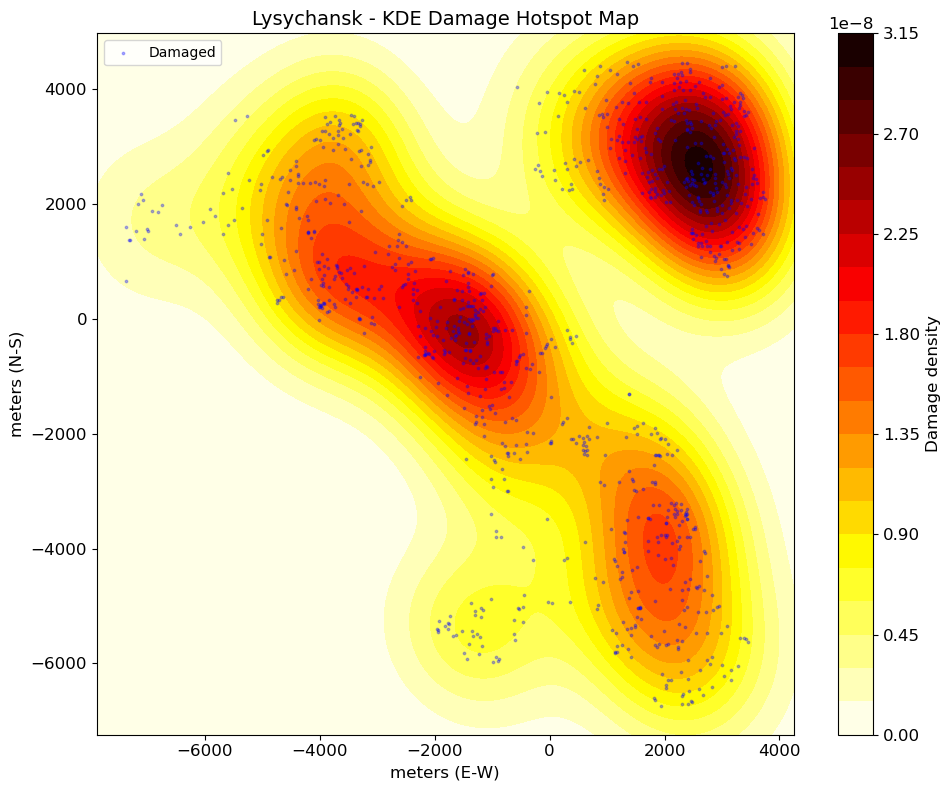

  Plot: cell14_kde/Lysychansk_kde_damage_hotspot_20260421_235933.png
    KDE saved
    NNA: R=0.523, z=-29.84, pattern=clustered
      observed NN dist: 89.3m, expected CSR: 170.6m


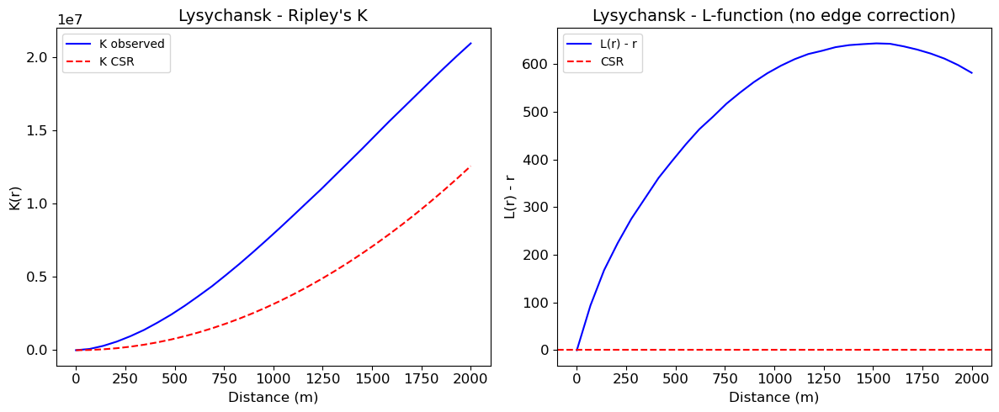

  Plot: cell14_kde/Lysychansk_ripley_k_20260421_235933.png
    Ripley K: max L(r)-r = 643.4m -> clustered

  Makariv (53 damaged buildings)


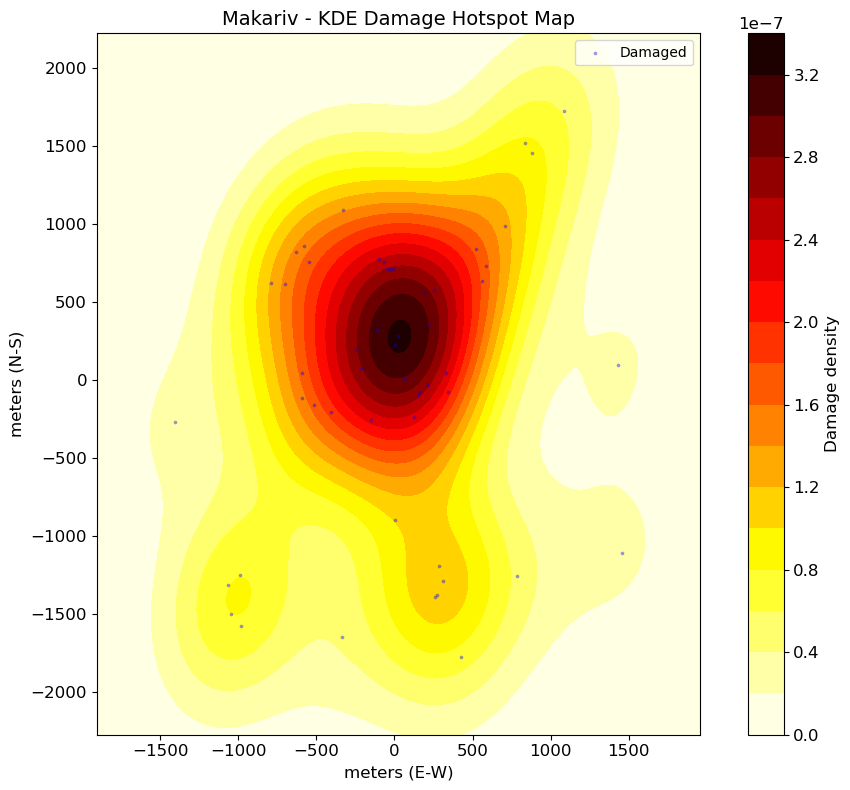

  Plot: cell14_kde/Makariv_kde_damage_hotspot_20260421_235934.png
    KDE saved
    NNA: R=0.801, z=-2.77, pattern=clustered
      observed NN dist: 173.9m, expected CSR: 217.0m


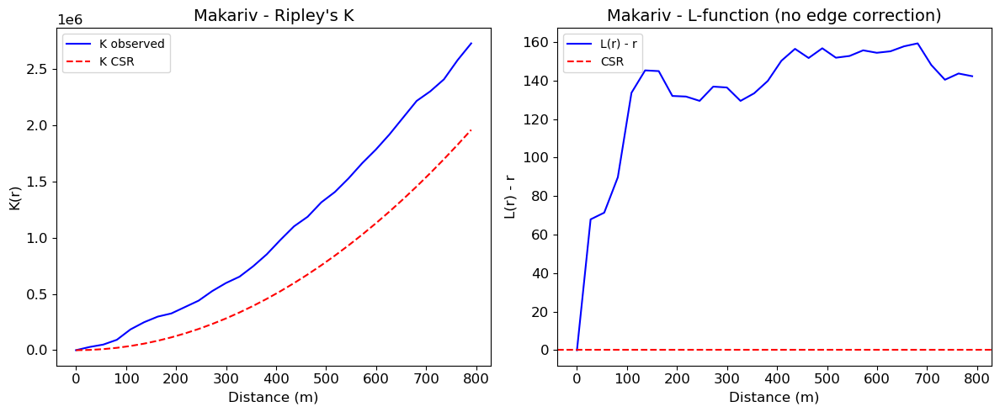

  Plot: cell14_kde/Makariv_ripley_k_20260421_235934.png
    Ripley K: max L(r)-r = 159.3m -> clustered

  Mariupol (3055 damaged buildings)


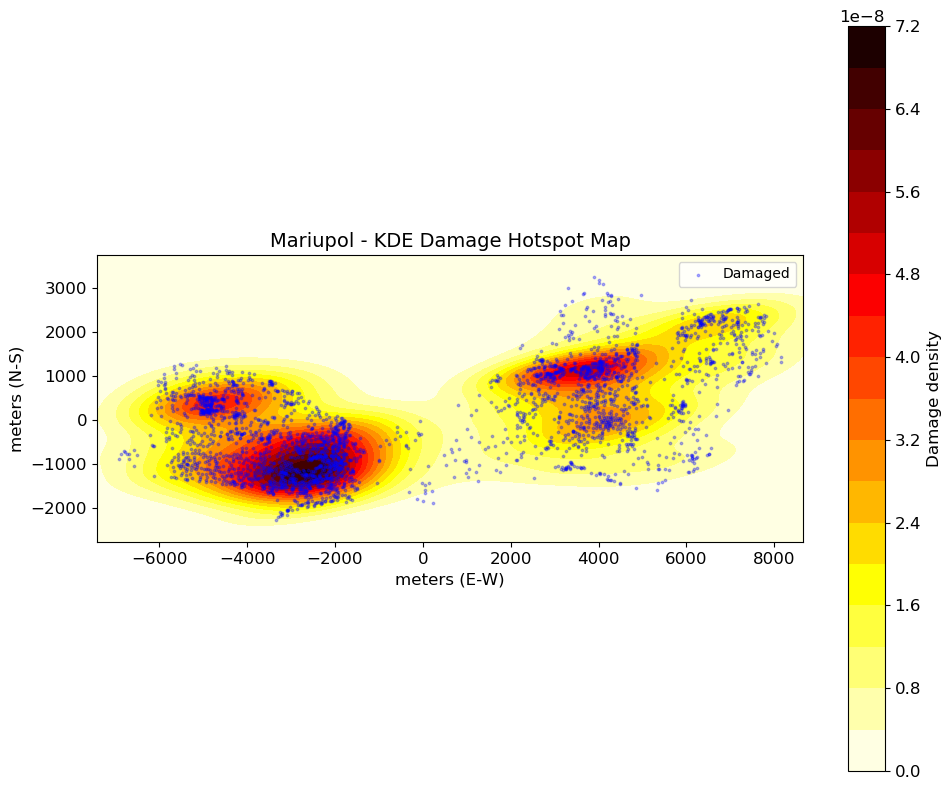

  Plot: cell14_kde/Mariupol_kde_damage_hotspot_20260421_235936.png
    KDE saved
    NNA: R=0.603, z=-41.57, pattern=clustered
      observed NN dist: 50.3m, expected CSR: 83.4m


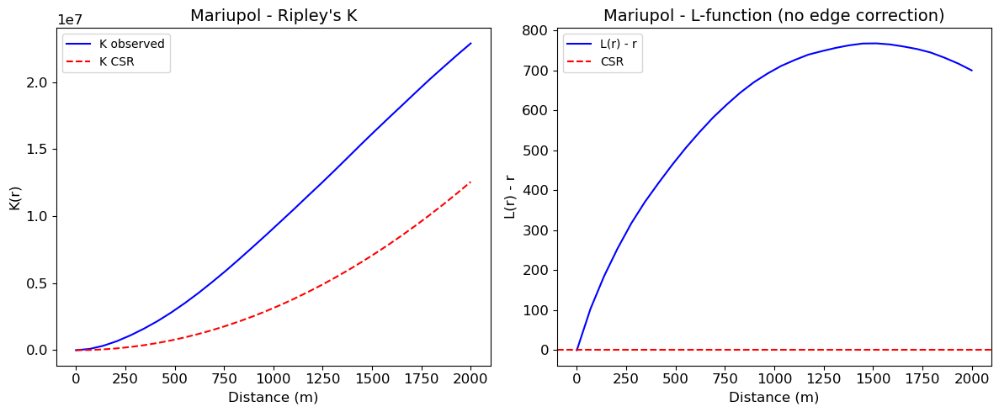

  Plot: cell14_kde/Mariupol_ripley_k_20260421_235937.png
    Ripley K: max L(r)-r = 767.4m -> clustered

  Moschun (73 damaged buildings)


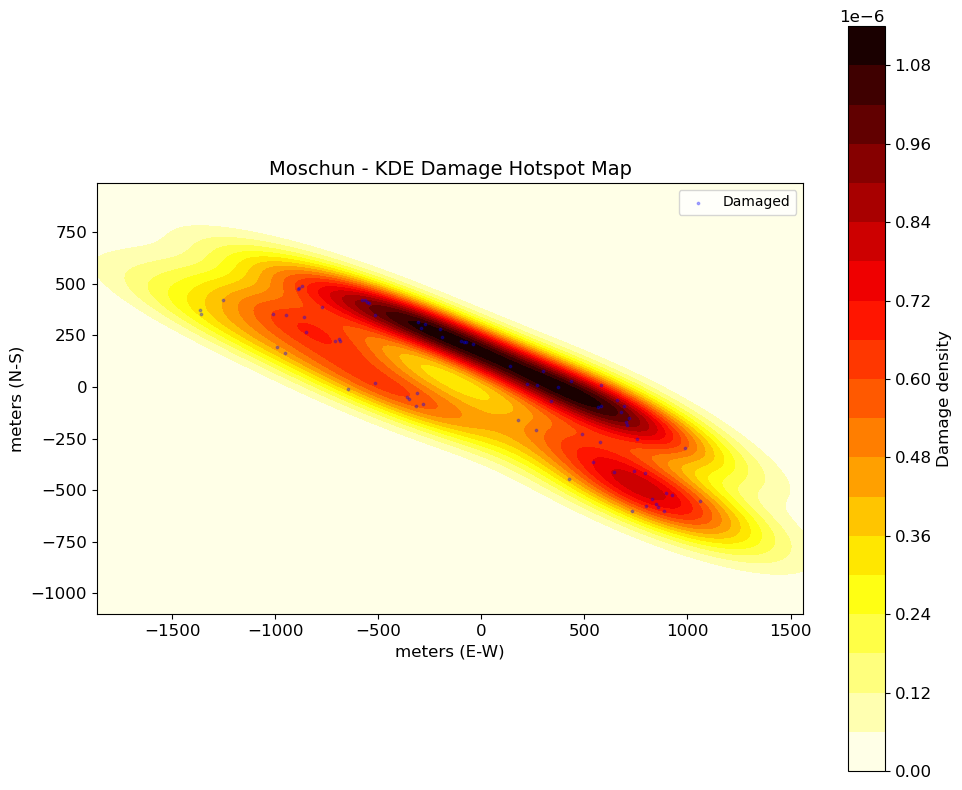

  Plot: cell14_kde/Moschun_kde_damage_hotspot_20260421_235937.png
    KDE saved
    NNA: R=0.554, z=-7.30, pattern=clustered
      observed NN dist: 52.8m, expected CSR: 95.3m


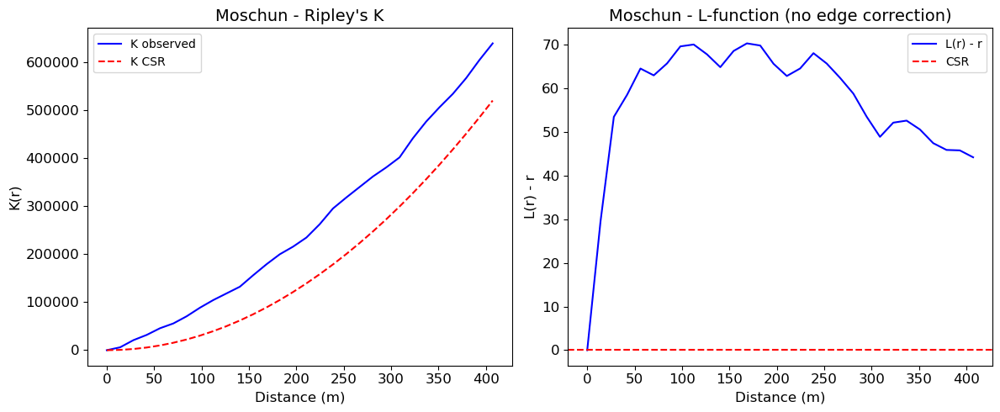

  Plot: cell14_kde/Moschun_ripley_k_20260421_235938.png
    Ripley K: max L(r)-r = 70.3m -> clustered

  Mykolaiv (84 damaged buildings)


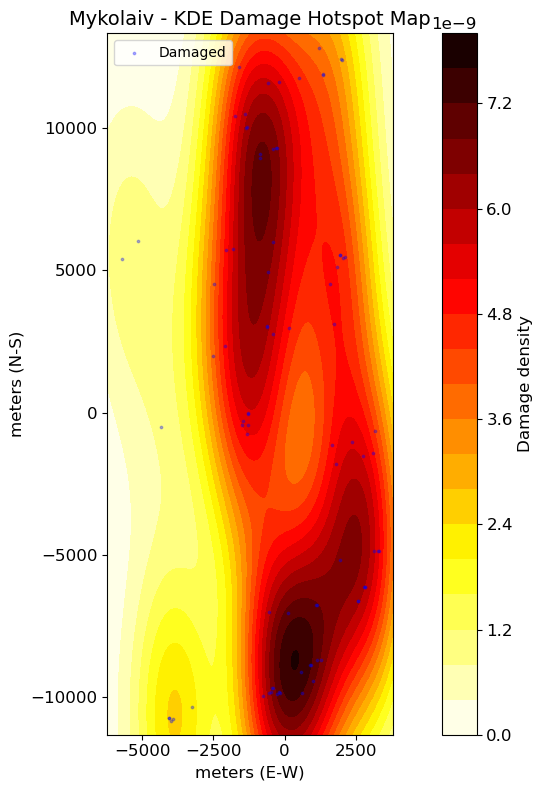

  Plot: cell14_kde/Mykolaiv_kde_damage_hotspot_20260421_235938.png
    KDE saved
    NNA: R=0.431, z=-9.97, pattern=clustered
      observed NN dist: 344.3m, expected CSR: 798.1m


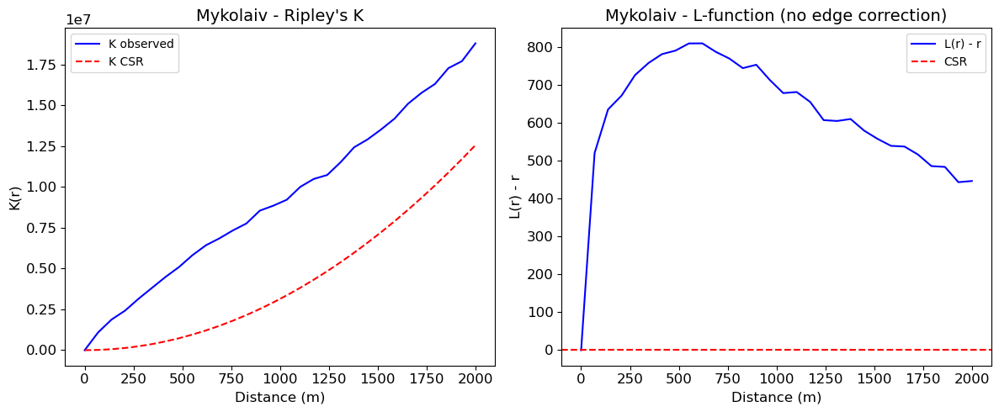

  Plot: cell14_kde/Mykolaiv_ripley_k_20260421_235939.png
    Ripley K: max L(r)-r = 810.0m -> clustered

  Okhtyrka (35 damaged buildings)


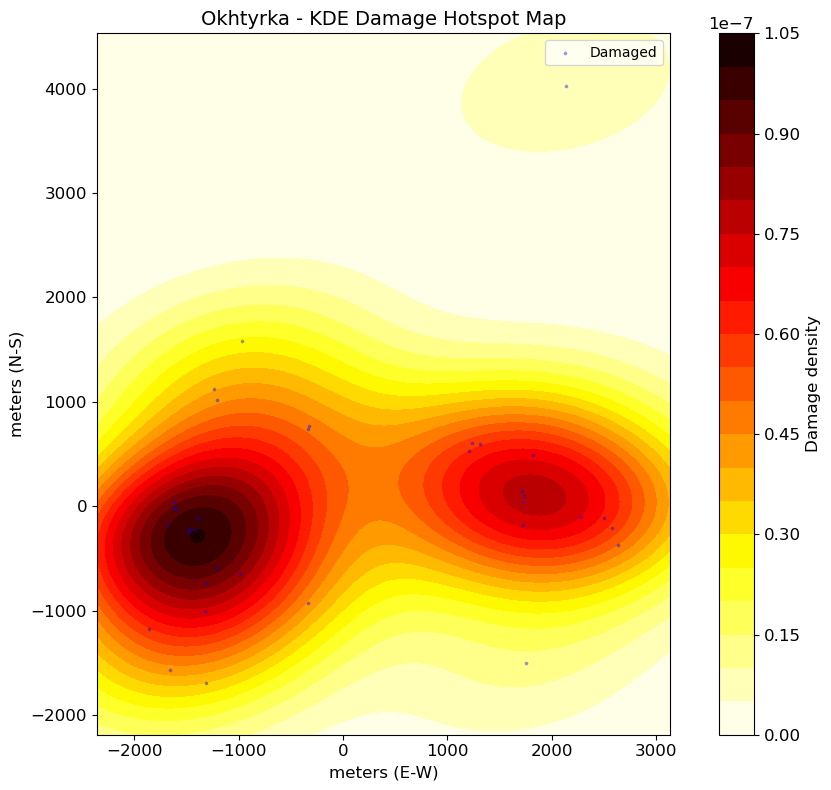

  Plot: cell14_kde/Okhtyrka_kde_damage_hotspot_20260421_235939.png
    KDE saved
    NNA: R=0.701, z=-3.38, pattern=clustered
      observed NN dist: 300.4m, expected CSR: 428.3m


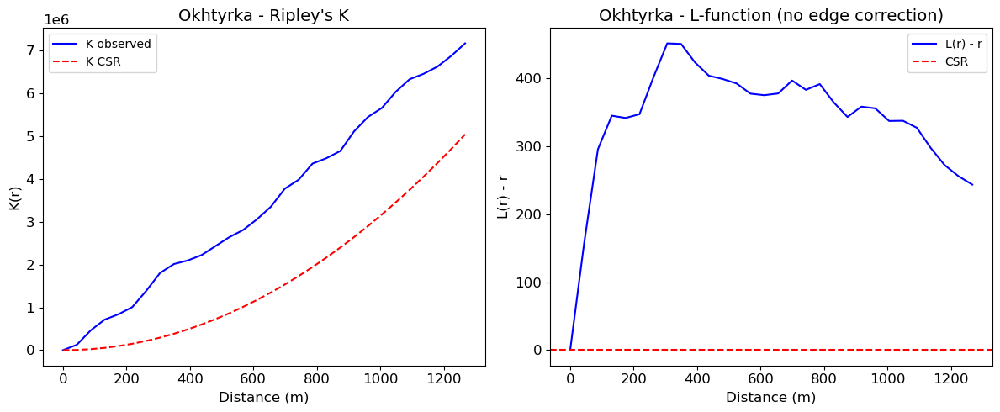

  Plot: cell14_kde/Okhtyrka_ripley_k_20260421_235940.png
    Ripley K: max L(r)-r = 451.8m -> clustered

  Rubizhne (431 damaged buildings)


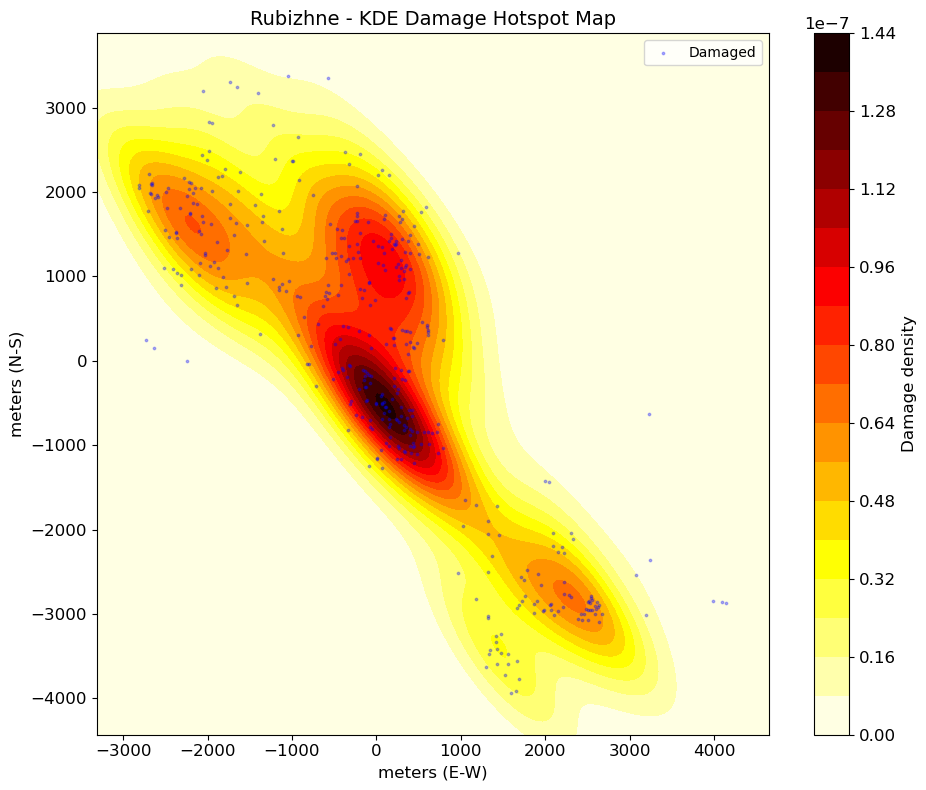

  Plot: cell14_kde/Rubizhne_kde_damage_hotspot_20260421_235940.png
    KDE saved
    NNA: R=0.483, z=-20.52, pattern=clustered
      observed NN dist: 83.0m, expected CSR: 171.8m


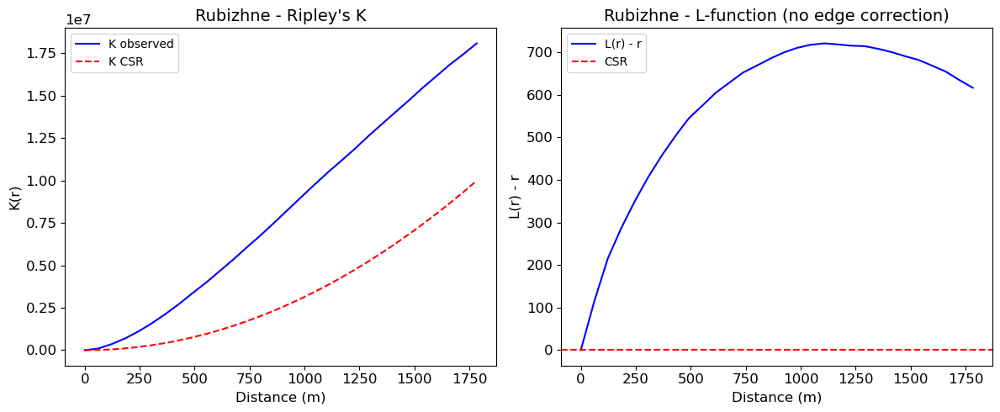

  Plot: cell14_kde/Rubizhne_ripley_k_20260421_235941.png
    Ripley K: max L(r)-r = 720.5m -> clustered

  Sievierodonetsk (534 damaged buildings)


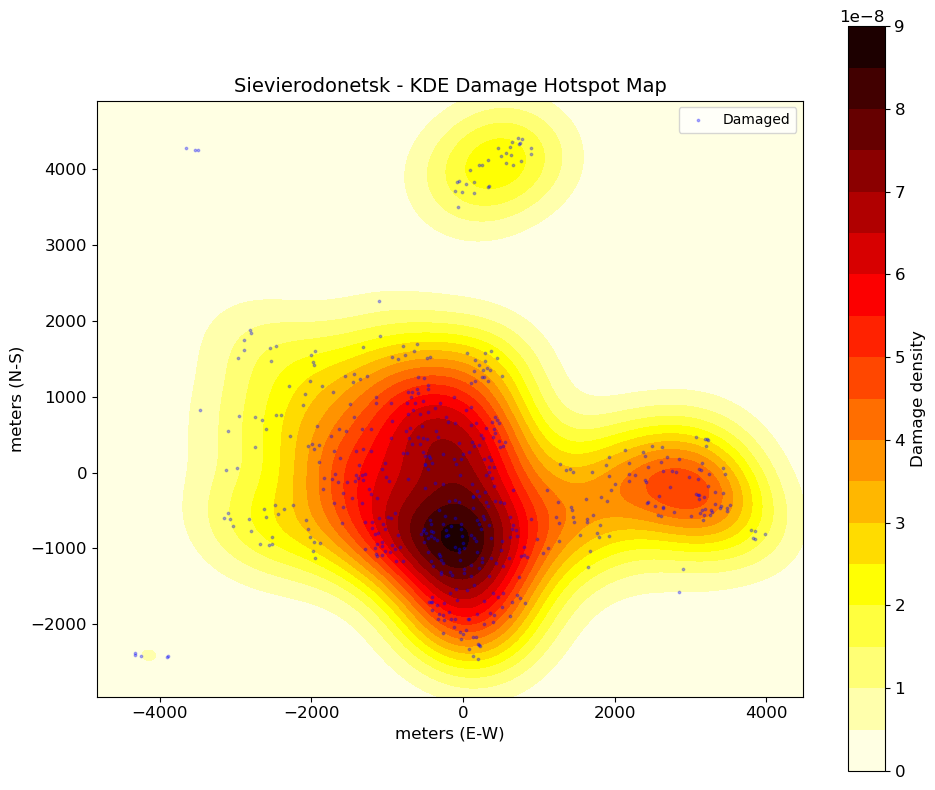

  Plot: cell14_kde/Sievierodonetsk_kde_damage_hotspot_20260421_235942.png
    KDE saved
    NNA: R=0.538, z=-20.41, pattern=clustered
      observed NN dist: 87.9m, expected CSR: 163.4m


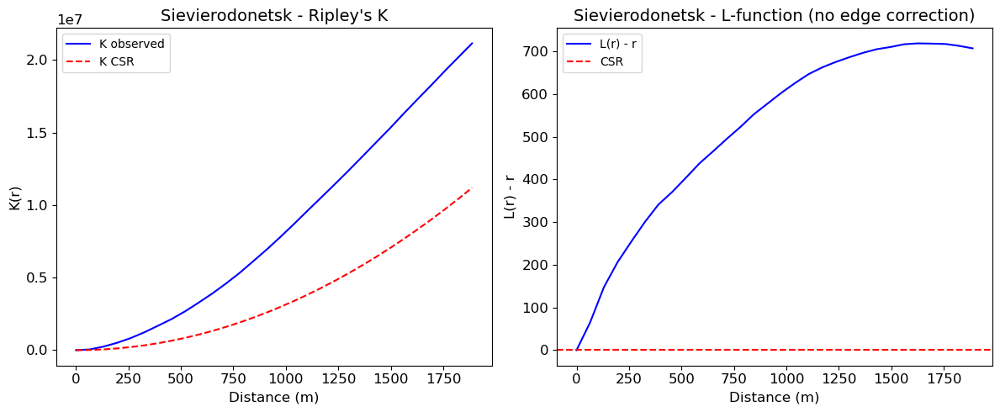

  Plot: cell14_kde/Sievierodonetsk_ripley_k_20260421_235942.png
    Ripley K: max L(r)-r = 718.6m -> clustered

  Trostianets (18 damaged buildings)


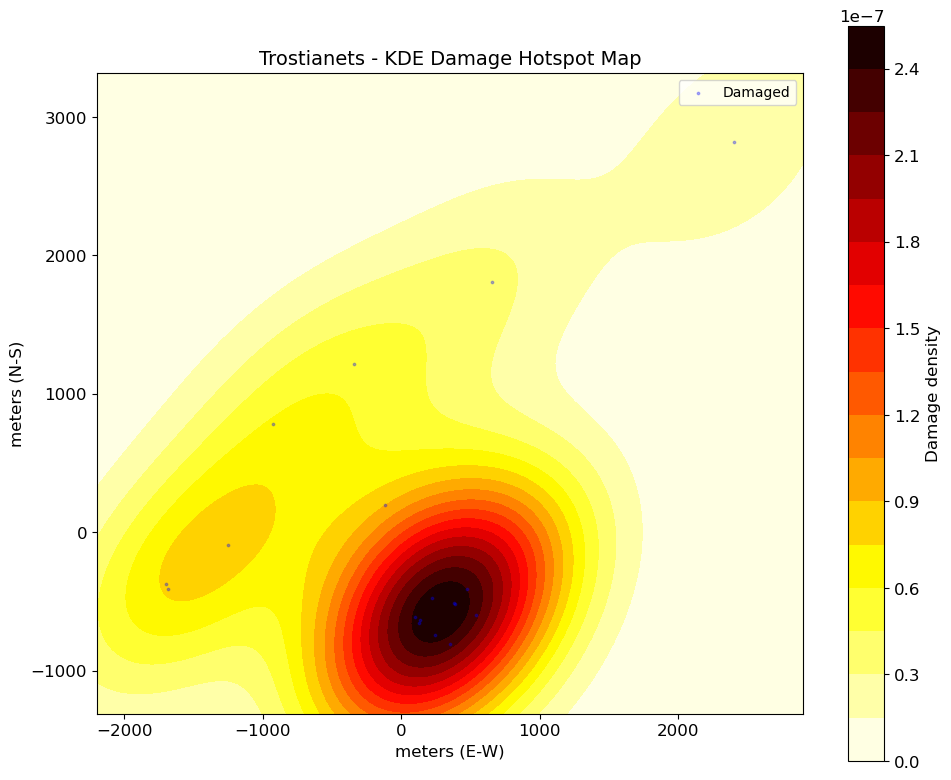

  Plot: cell14_kde/Trostianets_kde_damage_hotspot_20260421_235942.png
    KDE saved
    NNA: R=0.834, z=-1.35, pattern=clustered
      observed NN dist: 379.2m, expected CSR: 454.8m


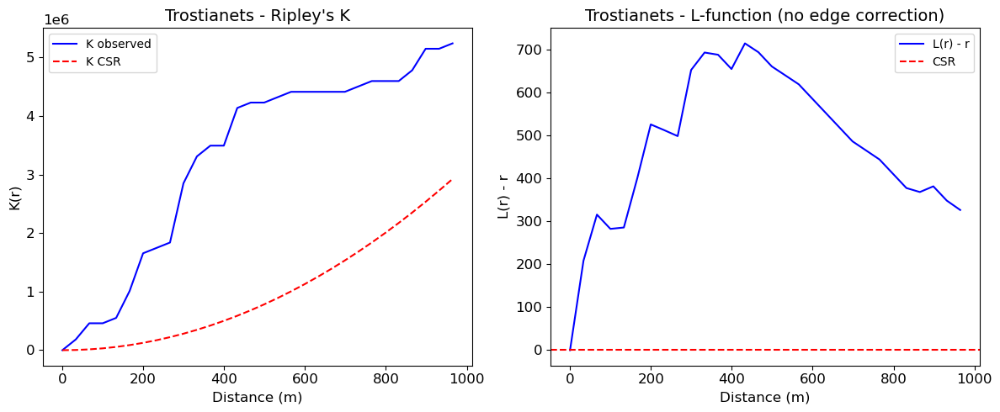

  Plot: cell14_kde/Trostianets_ripley_k_20260421_235943.png
    Ripley K: max L(r)-r = 715.0m -> clustered

  Volnovakha (163 damaged buildings)


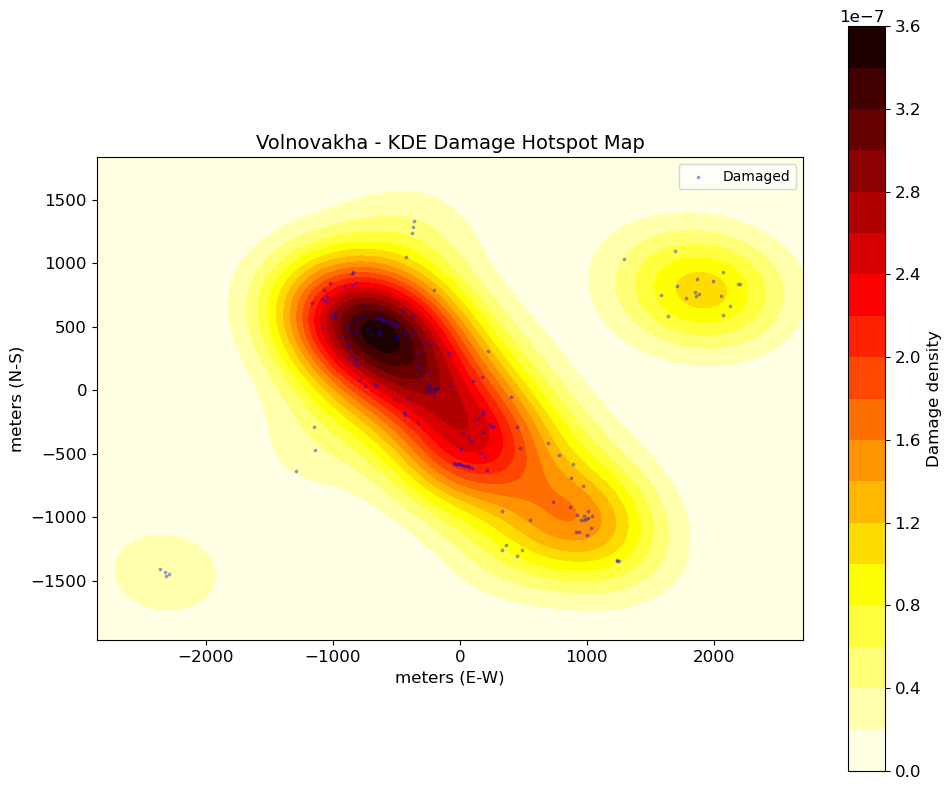

  Plot: cell14_kde/Volnovakha_kde_damage_hotspot_20260421_235943.png
    KDE saved
    NNA: R=0.445, z=-13.56, pattern=clustered
      observed NN dist: 62.2m, expected CSR: 139.9m


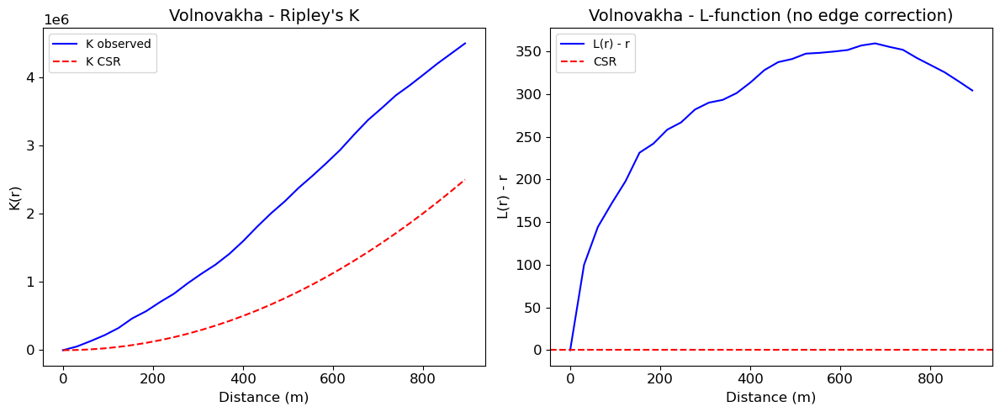

  Plot: cell14_kde/Volnovakha_ripley_k_20260421_235944.png
    Ripley K: max L(r)-r = 359.5m -> clustered


In [16]:
# @title CELL 14: KDE + NNA + RIPLEY K
USE_BALANCED = True  # density estimation biased by majority class
_df = df_balanced if (USE_BALANCED and df_balanced is not None and len(df_balanced) > 0) else df

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

print("=" * 70)
print("CELL 14: KDE DAMAGE HOTSPOT + POINT PATTERN ANALYSIS")
print("=" * 70)

for CITY in CITIES_TO_PROCESS:
    city_df = _df[_df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES or TARGET_COL not in city_df.columns or city_df[TARGET_COL].nunique() < 2:
        continue

    x_col = 'centroid_x' if 'centroid_x' in city_df.columns else 'lon'
    y_col = 'centroid_y' if 'centroid_y' in city_df.columns else 'lat'
    if x_col not in city_df.columns:
        continue

    damaged_pts = city_df[city_df[TARGET_COL] == 1][[x_col, y_col]].dropna()
    if len(damaged_pts) < 10:
        continue

    print(f"\n  {CITY} ({len(damaged_pts)} damaged buildings)")

    x = damaged_pts[x_col].values
    y = damaged_pts[y_col].values
    # centroid_x/y are UTM (meters), lon/lat are degrees
    if x_col == 'centroid_x':
        x_m = x - x.mean()
        y_m = y - y.mean()
    else:
        x_m = (x - x.mean()) * 111320 * np.cos(np.radians(y.mean()))
        y_m = (y - y.mean()) * 111320

    # KDE
    try:
        from scipy.stats import gaussian_kde
        kde = gaussian_kde(np.vstack([x_m, y_m]), bw_method='scott')
        xmin, xmax = x_m.min() - 500, x_m.max() + 500
        ymin, ymax = y_m.min() - 500, y_m.max() + 500
        xx, yy = np.meshgrid(np.linspace(xmin, xmax, 200), np.linspace(ymin, ymax, 200))
        zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)

        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        im = ax.contourf(xx, yy, zz, levels=20, cmap='hot_r')
        ax.scatter(x_m, y_m, s=3, c='blue', alpha=0.3, label='Damaged')
        plt.colorbar(im, ax=ax, label='Damage density')
        ax.set_title(f'{CITY} - KDE Damage Hotspot Map')
        ax.set_xlabel('meters (E-W)')
        ax.set_ylabel('meters (N-S)')
        ax.legend()
        ax.set_aspect('equal')
        plt.tight_layout()
        save_fig(fig, f'{CITY}_kde_damage_hotspot', 'cell14_kde')
        print(f"    KDE saved")
    except Exception as e:
        print(f"    KDE failed: {e}")

    # NNA
    try:
        coords = np.column_stack([x_m, y_m])
        if len(coords) > 3000:
            coords = coords[np.random.choice(len(coords), 3000, replace=False)]

        dists = cdist(coords, coords)
        np.fill_diagonal(dists, np.inf)
        nn_dists = dists.min(axis=1)
        observed_mean = nn_dists.mean()

        area = (x_m.max() - x_m.min()) * (y_m.max() - y_m.min())
        n = len(coords)
        density = n / area
        expected_mean = 0.5 / np.sqrt(density)
        se = 0.26136 / np.sqrt(n * density)
        nna_ratio = observed_mean / expected_mean
        z_nna = (observed_mean - expected_mean) / se

        pattern = 'clustered' if nna_ratio < 0.95 else 'dispersed' if nna_ratio > 1.05 else 'random'
        print(f"    NNA: R={nna_ratio:.3f}, z={z_nna:.2f}, pattern={pattern}")
        print(f"      observed NN dist: {observed_mean:.1f}m, expected CSR: {expected_mean:.1f}m")
    except Exception as e:
        print(f"    NNA failed: {e}")

    # Ripley's K (no edge correction)
    try:
        if len(coords) > 1000:
            coords_k = coords[np.random.choice(len(coords), 1000, replace=False)]
        else:
            coords_k = coords
        n_k = len(coords_k)
        max_dist = min(2000, np.sqrt(area) / 4)
        radii = np.linspace(0, max_dist, 30)
        dists_k = cdist(coords_k, coords_k)
        density_k = n_k / area
        K_obs = np.zeros(len(radii))
        for ri, r in enumerate(radii):
            if r == 0:
                continue
            count = np.sum(dists_k < r) - n_k
            K_obs[ri] = count / (n_k * density_k)

        K_csr = np.pi * radii**2
        L_obs = np.sqrt(K_obs / np.pi) - radii

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        ax1.plot(radii, K_obs, 'b-', label="K observed")
        ax1.plot(radii, K_csr, 'r--', label="K CSR")
        ax1.set_xlabel('Distance (m)')
        ax1.set_ylabel("K(r)")
        ax1.set_title(f"{CITY} - Ripley's K")
        ax1.legend()
        ax2.plot(radii, L_obs, 'b-', label="L(r) - r")
        ax2.axhline(0, color='red', linestyle='--', label='CSR')
        ax2.set_xlabel('Distance (m)')
        ax2.set_ylabel('L(r) - r')
        ax2.set_title(f'{CITY} - L-function (no edge correction)')
        ax2.legend()
        plt.tight_layout()
        save_fig(fig, f'{CITY}_ripley_k', 'cell14_kde')

        max_L = L_obs[1:].max() if len(L_obs) > 1 else 0
        print(f"    Ripley K: max L(r)-r = {max_L:.1f}m -> {'clustered' if max_L > 50 else 'near random'}")
    except Exception as e:
        print(f"    Ripley K failed: {e}")


# CELL 15: CROSS-CITY AGGREGATE SUMMARY

In [17]:
# @title CELL 15: CROSS-CITY AGGREGATE SUMMARY
import pandas as pd
import json
from datetime import datetime

print("=" * 70)
print("CELL 15: CROSS-CITY AGGREGATE SUMMARY")
print("=" * 70)

# per-city feature summary
print(f"\n  {'City':<22s} {'Buildings':>10s} {'Damaged':>8s} {'Features':>9s} {'Non-NaN':>8s}")
print(f"  {'-'*22} {'-'*10} {'-'*8} {'-'*9} {'-'*8}")

for CITY in CITIES_TO_PROCESS:
    city_df = df[df['city'] == CITY]
    n_bldg = len(city_df)
    n_dmg = (city_df[TARGET_COL] == 1).sum() if TARGET_COL in city_df.columns else 0
    feat_cols = [c for c in city_df.columns if c in FEATURE_COLS]
    n_feat = len(feat_cols)
    n_nonnull = sum(1 for c in feat_cols if city_df[c].notna().sum() > 0)
    print(f"  {CITY:<22s} {n_bldg:>10d} {n_dmg:>8d} {n_feat:>9d} {n_nonnull:>8d}")

# summary manifest
summary = {
    'created': datetime.now().isoformat(),
    'notebook': 'NB06 v27',
    'source': 'bda_product_prepost + bda_buildings via bda.sqlite catalog',
    'cities_processed': CITIES_TO_PROCESS,
    'n_cities': len(CITIES_TO_PROCESS),
    'n_buildings_total': len(df),
    'n_features_total': len(df.columns),
    'feature_groups': {k: len(v) for k, v in FEATURE_GROUPS.items()},
}

manifest_path = OUT_DIR / "cell15_summary" / f"NB06_summary_{_dt.now().strftime('%Y%m%d_%H%M%S')}.json"
manifest_path.parent.mkdir(parents=True, exist_ok=True)
with open(manifest_path, 'w') as f:
    json.dump(summary, f, indent=2)

# cross-city AUC consistency
if len(auc_df) > 0 and 'feature' in auc_df.columns and len(CITIES_TO_PROCESS) > 1:
    print(f"\n  Cross-city top features (consistent AUC > 0.6):")
    for feat in auc_df['feature'].unique():
        feat_auc = auc_df[auc_df['feature'] == feat]
        if len(feat_auc) >= len(CITIES_TO_PROCESS):
            mean_auc = feat_auc['auc_best'].mean()
            min_auc = feat_auc['auc_best'].min()
            if mean_auc > 0.6 and min_auc > 0.55:
                print(f"    {feat:50s} mean_AUC={mean_auc:.3f} min={min_auc:.3f} [{len(feat_auc)} cities]")

print(f"\n  Summary: {manifest_path}")
print(f"  All outputs: {OUT_DIR}")
print(f"\n{'='*70}")
print("NB06 COMPLETE")
print(f"{'='*70}")


CELL 15: CROSS-CITY AGGREGATE SUMMARY

  City                    Buildings  Damaged  Features  Non-NaN
  ---------------------- ---------- -------- --------- --------
  Avdiivka                    12523       89       346      330
  Borodyanka                   5240       62       346      138
  Bucha                       17215      158       346      330
  Chernihiv                   51375      333       346      288
  Chornobaivka                 9909        6       346      306
  Dmytrivka                   13649      144       346      281
  Hostomel                    19145      511       346      330
  Irpin                       17365      249       346      281
  Kharkiv                    170104      238       346      288
  Kherson                      9909        6       346      306
  Kramatorsk                  10414       19       346      319
  Lysychansk                  41600     1071       346      330
  Makariv                      5554       53       346      239
 

# NB06 v18 Scientific Notes

## Methods justification
- **Non-parametric tests** (Mann-Whitney U, Kruskal-Wallis): justified by non-normal distributions (Cell 8)
- **Spearman correlation** (not Pearson): rank-based, robust to non-normality and outliers
- **Feature selection for VIF/heatmap**: by AUC (discriminability), not variance (scale-dependent)
- **Cohen's d with pooled std**: standard parametric effect size, complemented by non-parametric rank-biserial

## UNOSAT labeling scheme
- `damage_binary = -1`: building not in UNOSAT assessment area (NOT "undamaged")
- `damage_binary = 0`: assessed by UNOSAT as undamaged (grade 1-2)
- `damage_binary = 1`: assessed by UNOSAT as damaged (grade 3-4 = severe/destroyed)
- `damage` column: raw UNOSAT EMS-98 grade (1-4, NaN if not assessed)
- `FILTER_UNOSAT_ONLY=True` drops -1 for supervised analysis; `False` keeps all for unsupervised
- `BALANCE_CLASSES=True` creates `df_balanced` with 50/50 per city (for PCA, KDE)

## NaN structure diagnostic (Cell 3B)
- **NaN-encodes-city test**: RF trained on binary NaN mask to predict city identity. If accuracy >> chance (1/n_cities), NaN patterns are a geographic leakage vector. LightGBM MIA in NB09 can exploit this.
- **Listwise vs pairwise dropout**: quantifies how much data PCA/VIF lose vs AUC/Mann-Whitney. If listwise drops >50%, PCA results are on a non-representative subset.
- **Temporal balance**: scene parquets with timestep show pre/post observation count per modality. Severe imbalance means pre-battle baseline features are unreliable.
- **Feature-group NaN variance across cities**: high variance = different cities have different modality coverage = structural NaN that encodes geography.

## Known limitations
- **Bhattacharyya/J-M distance** assumes Gaussian — invalid for categorical (landuse) and sparse (fire) features
- **PCA** drops NaN rows — significant data loss possible with SAR NaN patterns
- **Shapiro-Wilk** at n>5000 rejects almost any distribution — interpret p-values qualitatively
- **Ripley's K**: no edge correction applied — L(r) biased at large distances
- **Moran's I**: KNN k=8 on lon/lat coordinates — distances in degrees are approximate
- **UNOSAT labels**: known to have false negatives (Aimaiti 2022); undamaged label not reliable
- **Class imbalance**: 5091 damaged vs 88156 undamaged (5.5%) — AUC/Mann-Whitney unaffected, but PCA/KDE may be dominated by majority class

## NB03d products incorporated
- Composite spectral indices (NDVI, NDBI, NBR, NDWI, MNDWI, NDRE, CIre, BSI, BAEI)
- dNBR/RBR change detection maps (composites root)
- Per-scene NBR (multispectral/nbr/)
- CARD temporal statistics (baseline/assessment mean/std)
- Coherence baseline statistics (pre-battle baseline)
- Temporal products: COH zscore, COH rolling, CARD rolling, COH post-baseline
- Landuse classification per period (mode extraction for categorical, mean/std for spectral indices)
- Fire detection (active_fire/burn_scar) — when available in parquet


# CELL 17: ROLLING + BLOCK FEATURE ANALYSIS

Loads separate parquets independently (no merge into main df to avoid NaN contamination):
- Rolling stats (P1b): per-window temporal aggregates (baseline mean+std, z-scored assessment)
- Block stats (P1c): block-based temporal aggregates (blk01..blkNN, blk_preNN)

Each dataset gets its own AUC + Cohen's d analysis.
Results feed into NB13 for cross-dataset comparison and model selection.

NB05bV2 accumulator parquets (A14/A19/A20/A21/A22 — different concept: running min/max,
event counts, dates) are handled separately in CELL 17b.


In [18]:
# @title CELL 17: ROLLING + BLOCK FEATURE ANALYSIS (P1b + P1c products)
import numpy as np
import pandas as pd
from scipy import stats as scipy_stats
from sklearn.metrics import roc_auc_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
import re

print("=" * 70)
print("CELL 17: ROLLING + BLOCK FEATURE ANALYSIS")
print("=" * 70)

# =============================================================================
# LOAD NEW PARQUETS (per-tier)
# =============================================================================
_tiers = TIER_SELECTION if TIER_SELECTION != "ALL" else [0, 1, 2, 3, 4, 5]

new_parquets = {}

# rolling stats: one per window size, pick default window=7
_ROLL_WINDOW = 7
try:
    _rs = load_tier_parquets(PARQUET_ROLLING_STATS_TIER_FMT, _tiers, window=_ROLL_WINDOW)
    new_parquets['rolling_stats_card'] = _rs
    print(f"  rolling_stats (roll{_ROLL_WINDOW}): {len(_rs)} rows, {len(_rs.columns)} cols, {_rs['city'].nunique()} cities")
except FileNotFoundError as e:
    print(f"  rolling_stats: {e}")

# block stats
try:
    _bs = load_tier_parquets(PARQUET_BLOCK_STATS_TIER_FMT, _tiers)
    new_parquets['block_stats_card'] = _bs
    print(f"  block_stats: {len(_bs)} rows, {len(_bs.columns)} cols, {_bs['city'].nunique()} cities")
except FileNotFoundError as e:
    print(f"  block_stats: {e}")

if not new_parquets:
    print("\n  No new parquets available. Skipping cell.")
else:
    # merge damage labels from main df (already loaded in Cell 3)
    label_cols = ['building_id', 'city', TARGET_COL]
    label_df = df[label_cols].copy()

    # =============================================================================
    # PART 1: AUC COMPARISON TABLE (raw P1 vs rolling stats vs blocks)
    # =============================================================================
    print(f"\n{'='*70}")
    print("PART 1: AUC COMPARISON -- Raw P1 vs Rolling Stats vs Blocks")
    print(f"{'='*70}")

    def compute_auc_for_features(feat_df, feature_cols, city_name, target_col):
        """Compute AUC for each feature column. Returns list of dicts."""
        city_data = feat_df[feat_df['city'] == city_name]
        if len(city_data) < MIN_SAMPLES or target_col not in city_data.columns:
            return []
        if city_data[target_col].nunique() < 2:
            return []
        results = []
        for col in feature_cols:
            valid = city_data[[col, target_col]].dropna()
            if len(valid) < MIN_SAMPLES or valid[target_col].nunique() < 2:
                continue
            try:
                auc = roc_auc_score(valid[target_col], valid[col])
                auc_best = max(auc, 1 - auc)
                results.append({'feature': col, 'city': city_name, 'auc': auc_best})
            except:
                pass
        return results

    # raw P1 features from product_prepost (already in df)
    raw_card_cols = [c for c in FEATURE_COLS if 'baseline' in c or 'assessment' in c]
    raw_card_cols = [c for c in raw_card_cols if c.startswith('s1__') and 'roll' not in c and 'blk' not in c]

    all_auc_rows = []

    for city_name in CITIES_TO_PROCESS:
        # raw P1 AUCs
        for r in compute_auc_for_features(df, raw_card_cols, city_name, TARGET_COL):
            r['source'] = 'raw_P1'
            # extract stat name from e.g. s1__vv__assessment__mean
            parts = r['feature'].split('__')
            r['stat'] = parts[-1] if len(parts) >= 4 else ''
            r['pol'] = parts[1] if len(parts) >= 2 else ''
            r['phase'] = parts[2] if len(parts) >= 3 else ''
            r['window'] = 'raw'
            all_auc_rows.append(r)

        # rolling stats AUCs
        if 'rolling_stats_card' in new_parquets:
            rs_df = new_parquets['rolling_stats_card'].merge(label_df, on=['building_id', 'city'], how='inner')
            rs_feat_cols = [c for c in rs_df.columns if c.startswith('s1__') and 'roll' in c]
            for r in compute_auc_for_features(rs_df, rs_feat_cols, city_name, TARGET_COL):
                r['source'] = 'rolling_stats'
                parts = r['feature'].split('__')
                # s1__vv__roll7__assessment__mean
                r['pol'] = parts[1] if len(parts) >= 2 else ''
                m = re.search(r'roll(\d+)', r['feature'])
                r['window'] = f"roll{m.group(1)}" if m else ''
                r['stat'] = parts[-1] if len(parts) >= 5 else ''
                r['phase'] = parts[3] if len(parts) >= 5 else ''
                all_auc_rows.append(r)

        # block stats AUCs
        if 'block_stats_card' in new_parquets:
            bs_df = new_parquets['block_stats_card'].merge(label_df, on=['building_id', 'city'], how='inner')
            bs_feat_cols = [c for c in bs_df.columns if c.startswith('s1__') and 'blk' in c]
            for r in compute_auc_for_features(bs_df, bs_feat_cols, city_name, TARGET_COL):
                r['source'] = 'block_stats'
                parts = r['feature'].split('__')
                r['pol'] = parts[1] if len(parts) >= 2 else ''
                m = re.search(r'(blk(?:_pre)?\d+)', r['feature'])
                r['window'] = m.group(1) if m else ''
                # column = s1__vh__blk01__mean_mean -> last part is {tif_stat}_{zonal_agg}
                last = parts[-1] if len(parts) >= 4 else ''
                sub = last.split('_')
                r['stat'] = sub[0] if sub else ''
                r['zonal'] = sub[1] if len(sub) > 1 else ''
                r['phase'] = r['window']
                all_auc_rows.append(r)

    if all_auc_rows:
        auc_new = pd.DataFrame(all_auc_rows)

        # summary: best AUC per source x window, averaged across cities
        print(f"\n  Mean best-AUC per source x window (across cities, VV assessment/post-invasion features):")
        vv_assess = auc_new[
            (auc_new['pol'].isin(['vv', 'coh_vv'])) &
            (auc_new['phase'].str.startswith('blk') | auc_new['phase'].isin(['assessment']))
        ]
        if len(vv_assess) > 0:
            pivot = vv_assess.groupby(['source', 'window', 'stat'])['auc'].mean().reset_index()
            # best stat per window
            best_per_window = pivot.loc[pivot.groupby(['source', 'window'])['auc'].idxmax()]
            best_per_window = best_per_window.sort_values('auc', ascending=False)
            print(f"\n  {'Source':<18s} {'Window':<12s} {'Best stat':<12s} {'Mean AUC':>8s}")
            print(f"  {'-'*18} {'-'*12} {'-'*12} {'-'*8}")
            for _, row in best_per_window.head(20).iterrows():
                print(f"  {row['source']:<18s} {row['window']:<12s} {row['stat']:<12s} {row['auc']:>8.3f}")

        # =============================================================================
        # PART 2: BLOCK TIMELINE (AUC per block showing damage emergence)
        # =============================================================================
        if 'block_stats_card' in new_parquets:
            print(f"\n{'='*70}")
            print("PART 2: BLOCK TIMELINE -- When does damage become detectable?")
            print(f"{'='*70}")

            block_auc = auc_new[auc_new['source'] == 'block_stats'].copy()
            if len(block_auc) > 0:
                # get block metadata from parquet
                bs_df_meta = new_parquets['block_stats_card']
                meta_cols = [c for c in bs_df_meta.columns if c.startswith('meta__')]

                # per block, mean AUC of mean stat across cities
                block_mean = block_auc[block_auc['stat'] == 'mean'].groupby('window')['auc'].agg(['mean', 'std', 'count']).reset_index()
                block_mean = block_mean.sort_values('window')

                print(f"\n  {'Block':<14s} {'Mean AUC':>8s} {'Std':>6s} {'Cities':>6s} {'Interpretation'}")
                print(f"  {'-'*14} {'-'*8} {'-'*6} {'-'*6} {'-'*30}")
                for _, row in block_mean.iterrows():
                    blk = row['window']
                    interp = ""
                    if blk == 'blk00':
                        interp = "baseline (should be ~0.50)"
                    elif blk.startswith('blk_pre'):
                        interp = "pre-invasion (should be ~0.50)"
                    elif blk == 'blk01':
                        interp = "first 3mo post-invasion"
                    elif blk == 'blk02':
                        interp = "3-6mo post-invasion"
                    elif blk == 'blk03':
                        interp = "6-9mo post-invasion"
                    print(f"  {blk:<14s} {row['mean']:>8.3f} {row['std']:>6.3f} {int(row['count']):>6d} {interp}")

                print(f"\n  Interpretation: AUC should be ~0.50 for baseline/pre-invasion blocks")
                print(f"  (no damage signal), then rise for post-invasion blocks.")
                print(f"  If pre-invasion blocks show AUC >> 0.50, the model detects non-war changes.")
                print(f"  This is Dietrich's Eq. 3 pre-invasion guard rationale.")

        # =============================================================================
        # PART 3: VIF BETWEEN RAW P1 AND ROLLING FEATURES
        # =============================================================================
        if 'rolling_stats_card' in new_parquets:
            print(f"\n{'='*70}")
            print("PART 3: VIF -- Are rolling stats redundant with raw P1 stats?")
            print(f"{'='*70}")

            # pick VV assessment mean/std from raw and each rolling size
            vif_candidates = []
            for col in raw_card_cols:
                if 'vv__assessment__mean' in col or 'vv__assessment__std' in col:
                    vif_candidates.append(col)

            rs_df_full = new_parquets['rolling_stats_card'].merge(label_df, on=['building_id', 'city'], how='inner')
            for ws in [3, 5, 7, 13]:
                for stat in ['mean', 'std']:
                    col = f"s1__vv__roll{ws}__assessment__{stat}"
                    if col in rs_df_full.columns:
                        vif_candidates.append(col)

            # combine into one df for VIF
            combined_cols = [c for c in vif_candidates if c in df.columns or c in rs_df_full.columns]
            vif_df = df[['building_id', 'city'] + [c for c in combined_cols if c in df.columns]].copy()
            rs_extra = [c for c in combined_cols if c not in df.columns and c in rs_df_full.columns]
            if rs_extra:
                vif_df = vif_df.merge(rs_df_full[['building_id', 'city'] + rs_extra], on=['building_id', 'city'], how='inner')

            vif_cols = [c for c in combined_cols if c in vif_df.columns]
            vif_data = vif_df[vif_cols].dropna()

            if len(vif_data) > 100 and len(vif_cols) >= 2:
                print(f"\n  VIF for {len(vif_cols)} features ({len(vif_data)} samples):")
                vif_matrix = vif_data.values.astype(np.float64)
                # add constant
                vif_matrix = np.column_stack([vif_matrix, np.ones(len(vif_matrix))])
                for j, col in enumerate(vif_cols):
                    try:
                        vif_val = variance_inflation_factor(vif_matrix, j)
                        tag = "HIGH REDUNDANCY" if vif_val > 10 else "ok" if vif_val < 5 else "moderate"
                        short_name = col.replace('s1__vv__', '').replace('assessment__', 'a_')
                        print(f"    {short_name:<35s} VIF={vif_val:>8.1f}  ({tag})")
                    except:
                        pass
                print(f"\n  VIF > 10 = highly redundant with other features in set")
                print(f"  If raw P1 and roll7 both have VIF > 10, keep only one in NB09a")
            else:
                print(f"\n  Not enough data for VIF ({len(vif_data)} samples, {len(vif_cols)} cols)")

        # =============================================================================
        # PART 4: COHEN'S D FOR BEST ROLLING FEATURES
        # =============================================================================
        print(f"\n{'='*70}")
        print("PART 4: COHEN'S D -- Effect size for top rolling features")
        print(f"{'='*70}")

        top_features = auc_new.groupby('feature')['auc'].mean().nlargest(15).index.tolist()
        if top_features and 'rolling_stats_card' in new_parquets:
            rs_df_labels = new_parquets['rolling_stats_card'].merge(label_df, on=['building_id', 'city'], how='inner')
            all_feats_df = pd.concat([df, rs_df_labels.drop(columns=[c for c in rs_df_labels.columns if c in df.columns and c not in ['building_id', 'city']], errors='ignore')], axis=1)

            print(f"\n  {'Feature':<50s} {'d':>7s} {'AUC':>7s} {'Effect'}")
            print(f"  {'-'*50} {'-'*7} {'-'*7} {'-'*12}")
            for feat in top_features:
                src_df = df if feat in df.columns else rs_df_labels if feat in rs_df_labels.columns else None
                if src_df is None:
                    if 'block_stats_card' in new_parquets:
                        bs_labels = new_parquets['block_stats_card'].merge(label_df, on=['building_id', 'city'], how='inner')
                        if feat in bs_labels.columns:
                            src_df = bs_labels
                if src_df is None:
                    continue
                valid = src_df[[feat, TARGET_COL]].dropna()
                if len(valid) < 20 or valid[TARGET_COL].nunique() < 2:
                    continue
                d_vals = valid.loc[valid[TARGET_COL] == 1, feat].values
                c_vals = valid.loc[valid[TARGET_COL] == 0, feat].values
                pooled_std = np.sqrt((np.var(d_vals) + np.var(c_vals)) / 2)
                if pooled_std < 1e-10:
                    continue
                cohens_d = abs(np.mean(d_vals) - np.mean(c_vals)) / pooled_std
                mean_auc = auc_new[auc_new['feature'] == feat]['auc'].mean()
                effect = "large" if cohens_d > 0.8 else "medium" if cohens_d > 0.5 else "small"
                short = feat.replace('s1__', '').replace('assessment__', 'a_')[:48]
                print(f"  {short:<50s} {cohens_d:>7.3f} {mean_auc:>7.3f} {effect}")
    else:
        print("\n  No AUC results computed")

# registry
    if all_auc_rows:
        _top_new = auc_new.groupby('feature')['auc'].mean().nlargest(10)
        registry.log_statistics(
            cell_id='cell17_rolling_block',
            analysis_name='rolling_block_auc_comparison',
            parquet_name='rolling_stats+block_stats',
            tier_selection=_tiers,
            cities=CITIES_TO_PROCESS,
            n_buildings=len(df),
            n_features_tested=auc_new['feature'].nunique(),
            summary_metrics={
                'mean_auc_raw': float(auc_new[auc_new['source'] == 'raw_P1']['auc'].mean()) if (auc_new['source'] == 'raw_P1').any() else None,
                'mean_auc_rolling': float(auc_new[auc_new['source'] == 'rolling_stats']['auc'].mean()) if (auc_new['source'] == 'rolling_stats').any() else None,
                'mean_auc_block': float(auc_new[auc_new['source'] == 'block_stats']['auc'].mean()) if (auc_new['source'] == 'block_stats').any() else None,
            },
            top_features=[{'feature': f, 'mean_auc': float(a)} for f, a in _top_new.items()],
            note='Rolling + block feature AUC vs raw P1 (Cell 17)',
            tags=['rolling', 'block', 'temporal', 'auc'],
        )

print(f"\n{'='*70}")
print("CELL 17 COMPLETE")
print(f"{'='*70}")



CELL 17: ROLLING + BLOCK FEATURE ANALYSIS
  load_tier_parquets: 3 tiers, 907371 rows
  rolling_stats (roll7): 907371 rows, 116 cols, 21 cities
  load_tier_parquets: 3 tiers, 907371 rows
  block_stats: 907371 rows, 974 cols, 21 cities

PART 1: AUC COMPARISON -- Raw P1 vs Rolling Stats vs Blocks

  Mean best-AUC per source x window (across cities, VV assessment/post-invasion features):

  Source             Window       Best stat    Mean AUC
  ------------------ ------------ ------------ --------
  raw_P1             raw          kurtosis_max    0.830
  block_stats        blk16        std             0.775
  block_stats        blk10        kurtosis        0.743
  block_stats        blk11        std             0.741
  block_stats        blk15        std             0.737
  block_stats        blk04        std             0.726
  block_stats        blk14        std             0.716
  block_stats        blk12        std             0.707
  block_stats        blk09        kurtosis        0.

# CELL 17b: NB05bV2 ACCUMULATOR PARQUETS (A14 A19 A20 A21 A22)

Parquet-based univariate AUC + Cohen's d for the five NB05bV2 accumulator outputs:
- A14 coh_drop   (R3 COH: running_min, drop_count, max_drop, first/worst drop dates)
- A19 card_drop  (R4 CARD: z_running_min, drop_count, max_z_drop, first/worst drop dates)
- A20 ms_change  (R5 MS: SWIR/NBR running max, rise_count, anomaly_count, event dates)
- A21 ms_maha    (R7 MS Mahalanobis: running_max, exceedance_count, exceedance dates)
- A22 lu_change  (R6 Landuse: loss_count, loss_fraction, urban_retained, final_class)

Different concept from CELL 17 (rolling/block = baseline mean+std + z-scores of post assessment).
Accumulators encode pixel-wise event counters + extrema + event dates over the post-battle stack.

Excludes site-identity proxies (`scenes_observed*`, `was_observed_*` — handover §7.2, §7.3).
Date columns are raw ordinals; per-city univariate AUC is not affected by battle_start offsets
(battle_start is constant within city) but feature means across cities are not comparable.


In [19]:
# @title CELL 17b: NB05bV2 ACCUMULATOR PARQUET ANALYSIS (A14 A19 A20 A21 A22)
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.metrics import roc_auc_score

print("=" * 70)
print("CELL 17b: NB05bV2 ACCUMULATOR PARQUET ANALYSIS")
print("=" * 70)
print("  A14 coh_drop   (R3 COH)")
print("  A19 card_drop  (R4 CARD)")
print("  A20 ms_change  (R5 SWIR+NBR)")
print("  A21 ms_maha    (R7 Mahalanobis)")
print("  A22 lu_change  (R6 Landuse)")

_tiers = TIER_SELECTION if TIER_SELECTION != "ALL" else [0, 1, 2, 3, 4, 5]

ACCUMULATORS = [
    ('coh_drop',  'A14'),
    ('card_drop', 'A19'),
    ('ms_change', 'A20'),
    ('ms_maha',   'A21'),
    ('lu_change', 'A22'),
]

def _find_accum_parquet_fmt(name):
    '''Check DATASET_ROOT_V2 first (NB05bV2 output), fallback to DATASET_ROOT.'''
    roots = []
    _g = globals()
    if 'DATASET_ROOT_V2' in _g:
        roots.append(_g['DATASET_ROOT_V2'])
    if 'DATASET_ROOT' in _g:
        roots.append(_g['DATASET_ROOT'])
    for root in roots:
        cand = str(root / f'bda_{name}_t{{tier}}.parquet')
        if Path(cand.format(tier=_tiers[0])).exists():
            return cand
    return None

# site-identity proxies excluded from feature set (handover 7.2 / 7.3)
_META_EXCLUDE = {'building_id', 'city', 'tier', 'damage_binary',
                 'damage_label', 'geometry', 'centroid_x', 'centroid_y',
                 'unosat_id', 'unosat_date', 'area_m2', 'in_aoi',
                 'battle_start', 'battle_stop'}
_PROXY_PATTERNS = ['scenes_observed', 'was_observed_']

def _clean_feat_cols(cols):
    out = []
    for c in cols:
        if c in _META_EXCLUDE:
            continue
        if any(p in c for p in _PROXY_PATTERNS):
            continue
        out.append(c)
    return out

# =============================================================================
# LOAD EACH ACCUMULATOR
# =============================================================================
accum_parquets = {}
for name, aid in ACCUMULATORS:
    fmt = _find_accum_parquet_fmt(name)
    if fmt is None:
        print(f"  [{aid}] {name}: not found")
        continue
    try:
        _df_a = load_tier_parquets(fmt, _tiers)
        accum_parquets[name] = _df_a
        print(f"  [{aid}] {name}: {len(_df_a)} rows, "
              f"{len(_df_a.columns)} cols, {_df_a['city'].nunique()} cities  "
              f"({Path(fmt).parent.name})")
    except Exception as e:
        print(f"  [{aid}] {name}: {e}")

if not accum_parquets:
    print("\n  No accumulator parquets available. Run NB05bV2 v25 first.")
else:
    # label table from main df (already loaded in Cell 3)
    label_df = df[['building_id', 'city', TARGET_COL]].copy()

    def compute_auc_for_features(feat_df, feature_cols, city_name, target_col):
        '''Per-city univariate AUC (best of auc, 1-auc). Same shape as CELL 17 helper.'''
        city_data = feat_df[feat_df['city'] == city_name]
        if len(city_data) < MIN_SAMPLES or target_col not in city_data.columns:
            return []
        if city_data[target_col].nunique() < 2:
            return []
        results = []
        for col in feature_cols:
            valid = city_data[[col, target_col]].dropna()
            if len(valid) < MIN_SAMPLES or valid[target_col].nunique() < 2:
                continue
            try:
                auc = roc_auc_score(valid[target_col], valid[col])
                auc_best = max(auc, 1 - auc)
                results.append({'feature': col, 'city': city_name, 'auc': auc_best})
            except Exception:
                pass
        return results

    all_accum_rows = []

    for name, aid in ACCUMULATORS:
        if name not in accum_parquets:
            continue
        print(f"\n{'='*70}")
        print(f"[{aid}] {name.upper()} ANALYSIS")
        print(f"{'='*70}")

        pq = accum_parquets[name]
        merged = pq.merge(label_df, on=['building_id', 'city'], how='inner')
        feat_cols = _clean_feat_cols(list(pq.columns))
        print(f"  {len(merged)} buildings, {len(feat_cols)} features (site-proxy excluded), "
              f"{merged['city'].nunique()} cities")

        rows = []
        for city_name in sorted(merged['city'].unique()):
            for r in compute_auc_for_features(merged, feat_cols, city_name, TARGET_COL):
                r['source'] = name
                r['aid'] = aid
                rows.append(r)

        if not rows:
            print(f"  No AUC results for {name}")
            continue

        rows_df = pd.DataFrame(rows)
        all_accum_rows.extend(rows)

        # top features by mean AUC across cities
        top = rows_df.groupby('feature')['auc'].mean().sort_values(ascending=False)
        print(f"\n  Top features by mean AUC:")
        for feat, a in top.head(10).items():
            print(f"    {feat:<60s} AUC={a:.3f}")

        # Cohen's d per city for top-5 features
        for city_name in sorted(merged['city'].unique()):
            city_data = merged[merged['city'] == city_name]
            if city_data[TARGET_COL].nunique() < 2:
                continue
            lines = []
            for feat in top.head(5).index:
                if feat not in city_data.columns:
                    continue
                d_vals = city_data.loc[city_data[TARGET_COL] == 1, feat].dropna().values
                c_vals = city_data.loc[city_data[TARGET_COL] == 0, feat].dropna().values
                if len(d_vals) < 10 or len(c_vals) < 10:
                    continue
                n1, n2 = len(d_vals), len(c_vals)
                pooled = np.sqrt(((n1-1)*np.var(d_vals, ddof=1)
                                  + (n2-1)*np.var(c_vals, ddof=1)) / (n1+n2-2))
                if pooled < 1e-12:
                    continue
                dval = (np.mean(d_vals) - np.mean(c_vals)) / pooled
                effect = ('large' if abs(dval) > 0.8
                          else 'medium' if abs(dval) > 0.5
                          else 'small' if abs(dval) > 0.2
                          else 'negligible')
                lines.append(f"    {feat:<55s} d={dval:+.3f} [{effect}]")
            if lines:
                print(f"\n  {city_name}:")
                for ln in lines:
                    print(ln)

        # per-accumulator registry entry
        _top_a = rows_df.groupby('feature')['auc'].mean().nlargest(10)
        registry.log_statistics(
            cell_id=f'cell17b_{name}',
            analysis_name=f'{aid}_{name}_auc',
            parquet_name=f'bda_{name}',
            tier_selection=_tiers,
            cities=sorted(merged['city'].unique()),
            n_buildings=len(merged),
            n_features_tested=rows_df['feature'].nunique(),
            summary_metrics={
                'mean_auc': float(rows_df['auc'].mean()),
                'max_auc': float(rows_df['auc'].max()),
                'n_cities': int(merged['city'].nunique()),
            },
            top_features=[{'feature': f, 'mean_auc': float(a)} for f, a in _top_a.items()],
            note=f'Accumulator {aid} {name} univariate AUC (Cell 17b)',
            tags=['accumulator', 'nb05bv2', aid.lower(), name, 'auc'],
        )

    # combined CSV + cross-accumulator summary
    if all_accum_rows:
        all_df = pd.DataFrame(all_accum_rows)
        save_result(all_df, 'nb05bv2_accumulator_auc_all', 'cell17b_accumulators')

        print(f"\n{'='*70}")
        print("CROSS-ACCUMULATOR SUMMARY")
        print(f"{'='*70}")
        summary = all_df.groupby(['aid', 'source']).agg(
            n_features=('feature', 'nunique'),
            n_cities=('city', 'nunique'),
            mean_auc=('auc', 'mean'),
            max_auc=('auc', 'max'),
        ).reset_index().sort_values('mean_auc', ascending=False)
        print(f"\n  {'AID':<5s} {'Source':<14s} {'nFeat':>6s} {'nCity':>6s} "
              f"{'meanAUC':>8s} {'maxAUC':>7s}")
        print(f"  {'-'*5} {'-'*14} {'-'*6} {'-'*6} {'-'*8} {'-'*7}")
        for _, r in summary.iterrows():
            print(f"  {r['aid']:<5s} {r['source']:<14s} {int(r['n_features']):>6d} "
                  f"{int(r['n_cities']):>6d} {r['mean_auc']:>8.3f} {r['max_auc']:>7.3f}")

print(f"\n{'='*70}")
print("CELL 17b COMPLETE")
print(f"{'='*70}")


CELL 17b: NB05bV2 ACCUMULATOR PARQUET ANALYSIS
  A14 coh_drop   (R3 COH)
  A19 card_drop  (R4 CARD)
  A20 ms_change  (R5 SWIR+NBR)
  A21 ms_maha    (R7 Mahalanobis)
  A22 lu_change  (R6 Landuse)
  load_tier_parquets: 3 tiers, 907371 rows
  [A14] coh_drop: 907371 rows, 22 cols, 21 cities  (V2)
  load_tier_parquets: 3 tiers, 907371 rows
  [A19] card_drop: 907371 rows, 22 cols, 21 cities  (V2)
  load_tier_parquets: 3 tiers, 907371 rows
  [A20] ms_change: 907371 rows, 28 cols, 21 cities  (V2)
  load_tier_parquets: 3 tiers, 907371 rows
  [A21] ms_maha: 907371 rows, 19 cols, 21 cities  (V2)
  load_tier_parquets: 3 tiers, 907371 rows
  [A22] lu_change: 907371 rows, 23 cols, 21 cities  (V2)

[A14] COH_DROP ANALYSIS
  598595 buildings, 16 features (site-proxy excluded), 21 cities

  Top features by mean AUC:
    s1__coh__max_drop_std                                        AUC=0.525
    s1__coh__max_drop_max                                        AUC=0.523
    s1__coh__date_worst_drop_std       

# CELL 18: SINGLE-SCENE & ACCUMULATOR PRODUCT ANALYSIS
# P7 (RGB pre/post single-scene), P7b (CARD pre/post single-scene), R3 (COH drop accumulator)
# These are NB03e-derived TIF products: one pre + one post scene per city.
# This cell loads them directly from source dirs, samples at building centroids, and runs AUC + Mann-Whitney.


In [20]:
# @title CELL 18: SINGLE-SCENE & ACCUMULATOR PRODUCT ANALYSIS (P7 + P7b + R3)
import numpy as np
import pandas as pd
import rasterio
from pathlib import Path
from scipy import stats as scipy_stats
from sklearn.metrics import roc_auc_score
import re
import json

print("=" * 70)
print("CELL 18: SINGLE-SCENE & ACCUMULATOR PRODUCT ANALYSIS")
print("=" * 70)
print("  P7:  RGB pre/post single-scene (MS_DIR/{city}/rgb_prepost/)")
print("  P7b: CARD pre/post single-scene (SAR_CARD_DIR/{city}/card_prepost/)")
print("  R3:  COH drop accumulator (TEMPORAL_ROOT/{city}/COH/coh_drop_accumulator/)")

# =============================================================================
# FUNCTIONS
# =============================================================================

def sample_raster_at_centroids(tif_path, centroids_x, centroids_y, transform, band=1, dst_crs=None):
    """Sample a raster TIF at building centroid coordinates.
    If dst_crs differs from TIF CRS, reprojects centroids before sampling.
    Returns array of values (NaN where out of bounds or nodata).
    """
    with rasterio.open(tif_path) as src:
        data = src.read(band).astype(np.float32)
        src_transform = src.transform
        nodata = src.nodata
        tif_crs = src.crs
    cx, cy = centroids_x, centroids_y
    if dst_crs and tif_crs and str(dst_crs) != str(tif_crs):
        from pyproj import Transformer
        transformer = Transformer.from_crs(dst_crs, tif_crs, always_xy=True)
        cx, cy = transformer.transform(centroids_x, centroids_y)
    n = len(cx)
    vals = np.full(n, np.nan, dtype=np.float32)
    for i in range(n):
        col, row = ~src_transform * (cx[i], cy[i])
        col, row = int(round(col)), int(round(row))
        if 0 <= row < data.shape[0] and 0 <= col < data.shape[1]:
            v = data[row, col]
            if nodata is not None and v == nodata:
                continue
            if np.isfinite(v):
                vals[i] = v
    return vals


def compute_auc_mw(vals, y, min_samples=20):
    """Compute AUC + Mann-Whitney for a single feature vector vs binary target."""
    valid = np.isfinite(vals)
    v = vals[valid]
    t = y[valid]
    if len(v) < min_samples or len(np.unique(t)) < 2:
        return None
    d_vals = v[t == 1]
    c_vals = v[t == 0]
    if len(d_vals) < 5 or len(c_vals) < 5:
        return None
    try:
        u_stat, p_val = scipy_stats.mannwhitneyu(d_vals, c_vals, alternative='two-sided')
        auc = roc_auc_score(t, v)
        auc_best = max(auc, 1 - auc)
    except Exception:
        return None
    return {
        'auc_raw': float(auc),
        'auc_best': float(auc_best),
        'direction': 'higher=damaged' if auc >= 0.5 else 'lower=damaged',
        'mann_whitney_u': float(u_stat),
        'mann_whitney_p': float(p_val),
        'mean_damaged': float(np.mean(d_vals)),
        'mean_control': float(np.mean(c_vals)),
        'n_valid': int(len(v)),
    }


# =============================================================================
# COLLECT PRODUCTS PER CITY
# =============================================================================

all_rows = []

for CITY in CITIES_TO_PROCESS:
    city_df = df[df['city'] == CITY]
    if len(city_df) < MIN_SAMPLES:
        continue
    if TARGET_COL not in city_df.columns or city_df[TARGET_COL].nunique() < 2:
        continue

    cx = city_df['centroid_x'].values
    cy = city_df['centroid_y'].values
    y_arr = city_df[TARGET_COL].values.astype(int)

    _ref_path = STACK_ROOT / CITY / 'reference_grid.json'
    _centroid_crs = None
    if _ref_path.exists():
        with open(_ref_path) as _f:
            _ref = json.load(_f)
        _centroid_crs = f"EPSG:{_ref.get('utm_epsg', 4326)}"

    print(f"\n  {CITY} ({len(city_df)} buildings)")

    # --- P7: RGB PRE/POST SINGLE-SCENE ---
    rgb_dir = MS_DIR / CITY / MS_RGB_PREPOST_SUBDIR
    if rgb_dir.exists():
        rgb_tifs = sorted(rgb_dir.glob('s2__rgb_prepost__*.tif'))
        rgb_tifs = [t for t in rgb_tifs if '_viz_' not in t.name]
        for tif in rgb_tifs:
            # extract band count
            with rasterio.open(tif) as src:
                n_bands = src.count
                src_transform = src.transform
            band_labels = ['b04', 'b03', 'b02'] if n_bands == 3 else ['val']
            # parse phase from filename: s2__rgb_prepost__pre__20210915.tif or s2__rgb_prepost__delta.tif
            m = re.match(r's2__rgb_prepost__(\w+?)(?:__\d{8})?\.tif', tif.name)
            if not m:
                continue
            phase = m.group(1)  # pre, post, delta
            for bi, blabel in enumerate(band_labels):
                feat_name = f"s2__rgb_prepost__{phase}__{blabel}"
                vals = sample_raster_at_centroids(tif, cx, cy, src_transform, band=bi+1, dst_crs=_centroid_crs)
                result = compute_auc_mw(vals, y_arr)
                if result is not None:
                    result['city'] = CITY
                    result['feature'] = feat_name
                    result['source'] = 'rgb_prepost'
                    result['product'] = 'P7'
                    all_rows.append(result)
        n_rgb = len([r for r in all_rows if r.get('city') == CITY and r.get('source') == 'rgb_prepost'])
        print(f"    P7 RGB prepost: {len(rgb_tifs)} TIFs, {n_rgb} features tested")
    else:
        print(f"    P7 RGB prepost: not found ({rgb_dir})")

    # --- P7b: CARD PRE/POST SINGLE-SCENE ---
    card_pp_dir = SAR_CARD_DIR / CITY / SAR_CARD_PREPOST_SUBDIR
    if card_pp_dir.exists():
        card_tifs = sorted(card_pp_dir.glob('s1__*.tif'))
        for tif in card_tifs:
            with rasterio.open(tif) as src:
                src_transform = src.transform
            # s1__vv__card_prepost__pre__20220101.tif or s1__vv__card_prepost__delta.tif
            m = re.match(r's1__(vv|vh)__card_prepost__(\w+?)(?:__\d{8})?\.tif', tif.name)
            if not m:
                continue
            pol = m.group(1)
            phase = m.group(2)
            feat_name = f"s1__{pol}__card_prepost__{phase}"
            vals = sample_raster_at_centroids(tif, cx, cy, src_transform, dst_crs=_centroid_crs)
            result = compute_auc_mw(vals, y_arr)
            if result is not None:
                result['city'] = CITY
                result['feature'] = feat_name
                result['source'] = 'card_prepost'
                result['product'] = 'P7b'
                all_rows.append(result)
        n_card = len([r for r in all_rows if r.get('city') == CITY and r.get('source') == 'card_prepost'])
        print(f"    P7b CARD prepost: {len(card_tifs)} TIFs, {n_card} features tested")
    else:
        print(f"    P7b CARD prepost: not found ({card_pp_dir})")

    # --- R3: COH DROP ACCUMULATOR ---
    coh_acc_dir = TEMPORAL_ROOT / CITY / 'COH' / 'coh_drop_accumulator'
    if coh_acc_dir.exists():
        # only numeric products (skip date and landuse transition TIFs)
        coh_products = [
            's1__coh__running_min.tif',
            's1__coh__drop_count.tif',
            's1__coh__max_drop.tif',
            's1__coh__scenes_observed.tif',
        ]
        for fname in coh_products:
            tif = coh_acc_dir / fname
            if not tif.exists():
                continue
            with rasterio.open(tif) as src:
                src_transform = src.transform
            feat_name = fname.replace('.tif', '')
            vals = sample_raster_at_centroids(tif, cx, cy, src_transform, dst_crs=_centroid_crs)
            result = compute_auc_mw(vals, y_arr)
            if result is not None:
                result['city'] = CITY
                result['feature'] = feat_name
                result['source'] = 'coh_accumulator'
                result['product'] = 'R3'
                all_rows.append(result)
        n_coh = len([r for r in all_rows if r.get('city') == CITY and r.get('source') == 'coh_accumulator'])
        print(f"    R3 COH accumulator: {n_coh} features tested")
    else:
        print(f"    R3 COH accumulator: not found ({coh_acc_dir})")

# =============================================================================
# RESULTS
# =============================================================================

if all_rows:
    new_auc_df = pd.DataFrame(all_rows).sort_values(['source', 'city', 'auc_best'], ascending=[True, True, False])
    save_result(new_auc_df, 'single_scene_auc', 'cell18_single_scene')

    # summary table: mean AUC per feature across cities
    print(f"\n{'='*70}")
    print("SUMMARY: Mean AUC per feature (across cities)")
    print(f"{'='*70}")
    feat_summary = new_auc_df.groupby(['source', 'feature']).agg(
        mean_auc=('auc_best', 'mean'),
        std_auc=('auc_best', 'std'),
        n_cities=('city', 'nunique'),
        mean_p=('mann_whitney_p', 'mean'),
    ).sort_values('mean_auc', ascending=False).reset_index()

    print(f"\n  {'Source':<16s} {'Feature':<40s} {'AUC':>7s} {'Std':>6s} {'Cities':>6s} {'Sig'}") 
    print(f"  {'-'*16} {'-'*40} {'-'*7} {'-'*6} {'-'*6} {'-'*4}")
    for _, row in feat_summary.iterrows():
        sig = '*' if row['mean_p'] < 0.05 else ' '
        print(f"  {row['source']:<16s} {row['feature']:<40s} {row['mean_auc']:>7.3f} {row['std_auc']:>6.3f} {int(row['n_cities']):>6d} {sig}")

    # comparison with Cell 4 composite features (if auc_df exists)
    if 'auc_df' in dir() and len(auc_df) > 0:
        print(f"\n{'='*70}")
        print("COMPARISON: Single-scene vs composite/baseline features")
        print(f"{'='*70}")
        composite_mean = auc_df.groupby('feature')['auc_best'].mean()
        single_mean = new_auc_df.groupby('feature')['auc_best'].mean()
        print(f"  Composite features (Cell 4):  mean AUC = {composite_mean.mean():.3f}  (n={len(composite_mean)})")
        print(f"  Single-scene features (P7+P7b+R3): mean AUC = {single_mean.mean():.3f}  (n={len(single_mean)})")
        print(f"  Best composite: {composite_mean.idxmax():<45s} AUC={composite_mean.max():.3f}")
        print(f"  Best single:    {single_mean.idxmax():<45s} AUC={single_mean.max():.3f}")

    # registry
    _top_new = new_auc_df.groupby('feature')['auc_best'].mean().nlargest(10)
    registry.log_statistics(
        cell_id='cell18_single_scene',
        analysis_name='single_scene_accumulator_auc',
        parquet_name='TIF_direct_sampling',
        tier_selection=_tiers,
        cities=CITIES_TO_PROCESS,
        n_buildings=len(df),
        n_features_tested=new_auc_df['feature'].nunique(),
        summary_metrics={
            'mean_auc_rgb_prepost': float(new_auc_df[new_auc_df['source'] == 'rgb_prepost']['auc_best'].mean()) if (new_auc_df['source'] == 'rgb_prepost').any() else None,
            'mean_auc_card_prepost': float(new_auc_df[new_auc_df['source'] == 'card_prepost']['auc_best'].mean()) if (new_auc_df['source'] == 'card_prepost').any() else None,
            'mean_auc_coh_accumulator': float(new_auc_df[new_auc_df['source'] == 'coh_accumulator']['auc_best'].mean()) if (new_auc_df['source'] == 'coh_accumulator').any() else None,
            'n_significant_p05': int((new_auc_df['mann_whitney_p'] < 0.05).sum()),
        },
        top_features=[{'feature': f, 'mean_auc': float(a)} for f, a in _top_new.items()],
        note='Single-scene RGB/CARD pre/post + COH accumulator (Cell 18)',
        tags=['single_scene', 'rgb_prepost', 'card_prepost', 'coh_accumulator', 'auc'],
    )
else:
    print("\n  No single-scene/accumulator products found for any city.")
    print("  Check that NB03e P7, P7b, R3 have been run and products exist in:")
    print(f"    MS_DIR/{{city}}/{MS_RGB_PREPOST_SUBDIR}/")
    print(f"    SAR_CARD_DIR/{{city}}/{SAR_CARD_PREPOST_SUBDIR}/")
    print(f"    TEMPORAL_ROOT/{{city}}/COH/coh_drop_accumulator/")

print(f"\n{'='*70}")
print("CELL 18 COMPLETE")
print(f"{'='*70}")


CELL 18: SINGLE-SCENE & ACCUMULATOR PRODUCT ANALYSIS
  P7:  RGB pre/post single-scene (MS_DIR/{city}/rgb_prepost/)
  P7b: CARD pre/post single-scene (SAR_CARD_DIR/{city}/card_prepost/)
  R3:  COH drop accumulator (TEMPORAL_ROOT/{city}/COH/coh_drop_accumulator/)

  Avdiivka (12523 buildings)
    P7 RGB prepost: 3 TIFs, 9 features tested
    P7b CARD prepost: 6 TIFs, 6 features tested
    R3 COH accumulator: 4 features tested

  Borodyanka (5240 buildings)
    P7 RGB prepost: not found (/content/drive_f/masterthesis/data/satellite/MS/Borodyanka/rgb_prepost)
    P7b CARD prepost: 6 TIFs, 6 features tested
    R3 COH accumulator: 0 features tested

  Bucha (17215 buildings)
    P7 RGB prepost: 3 TIFs, 9 features tested
    P7b CARD prepost: 6 TIFs, 6 features tested
    R3 COH accumulator: 0 features tested

  Chernihiv (51375 buildings)
    P7 RGB prepost: 3 TIFs, 9 features tested
    P7b CARD prepost: 6 TIFs, 6 features tested
    R3 COH accumulator: not found (/content/drive_f/masterth

In [21]:
# @title CELL 19: SAVE REGISTRY
import importlib
import bda_results
importlib.reload(bda_results)
registry.__class__ = bda_results.ResultRegistry
registry.save()

  SAVED: NB06_experiments_20260421_233604.json (9 experiments)
  SAVED: NB06_experiments_20260421_233604.csv


PosixPath('/content/drive_f/masterthesis/results/registry')